<center><h1>1-ab: Introduction to Neural Networks</h1></center>



In [1]:
import math
import torch
from torch.autograd import Variable
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from time import time 
from tqdm import tqdm

In [2]:
%run 'utils-data.py'

# Part 1 : Forward and backward passes "by hands"

In [3]:
def softmax(vector):
    return torch.exp(vector) / torch.sum(torch.exp(vector),dim=1,keepdim=True)


def cross_entropy(yhat,y):
#     return torch.nn.functional.cross_entropy(yhat,y)
    return torch.mean(-1 * torch.sum(y * torch.log(yhat),dim=1,keepdim=True))

In [4]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}

    # fill values for Wh, Wy, bh, by
    params["Wh"] = torch.normal(mean=0,std=0.3,size=(nh,nx))
    params["Wy"] = torch.normal(mean=0,std=0.3,size=(ny,nh))
    params["bh"] =  torch.normal(mean=0,std=0.3,size=(1,nh))
    params["by"] =  torch.normal(mean=0,std=0.3,size=(1,ny))

    return params

In [5]:
def forward(params, X):
    """
    params: dictionnary
    X: (n_batch, dimension)
    """
    outputs = {}

    outputs["X"] = X
    outputs["htilde"] = torch.mm(X,params['Wh'].t()) + params['bh']
    outputs["h"] = torch.tanh(outputs["htilde"])
    outputs["ytilde"] = torch.mm(outputs["h"],params['Wy'].t()) + params['by']
    outputs["yhat"] = softmax(outputs["ytilde"])
    return outputs['yhat'], outputs

In [6]:
a = torch.randn((10,3))
b = torch.tensor([[1,0],[1,0],[1,0],[1,0],[1,0],
                [0,1],[0,1],[0,1],[0,1],[0,1]])
paramsssss = init_params(3,5,2)
yhattttttt , _  = forward(paramsssss,a)

In [8]:
def loss_accuracy(yhat, y):
    
    predictions_hat = torch.argmax(yhat, dim=1)

    predictions = torch.argmax(y, dim=1)

    correct_predictions = (predictions_hat == predictions).sum().item()

    return cross_entropy(yhat,y), correct_predictions / len(y)

In [7]:
def backward(params, outputs, y):
    
    bsize = y.shape[0]
    grads = {}

    grad_ytilde = (outputs['yhat'] - y)
    grad_htilde = torch.mm(grad_ytilde , params["Wy"]) * (1 - outputs["h"]**2)
    grads["Wy"] =  torch.mm(grad_ytilde.t(), outputs["h"])
    grads["Wh"] = torch.mm(grad_htilde.t() , outputs["X"])
    grads["by"] = torch.sum(grad_ytilde,0).t()
    grads["bh"] = torch.sum(grad_htilde,0).t()

    return grads

In [9]:
def sgd(params, grads, eta):

    # update the params values

    params["Wh"] -= eta * grads["Wh"]
    params["Wy"] -= eta * grads["Wy"]
    params["bh"] -= eta * grads["bh"]
    params["by"] -= eta * grads["by"]

    return params

## Global learning procedure "by hands"

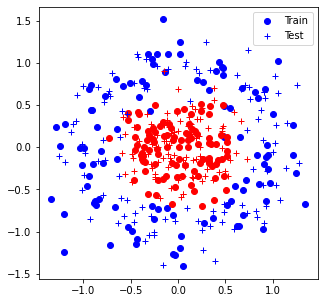

Iter 0: Acc train 0.5% (0.70), acc test 0.5% (0.70)


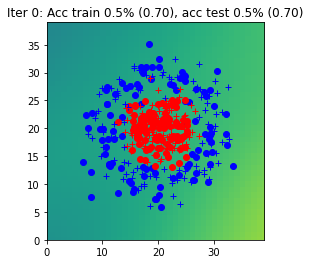

Iter 1: Acc train 0.7% (0.69), acc test 0.6% (0.69)


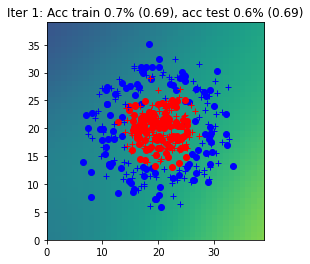

Iter 2: Acc train 0.6% (0.69), acc test 0.6% (0.69)


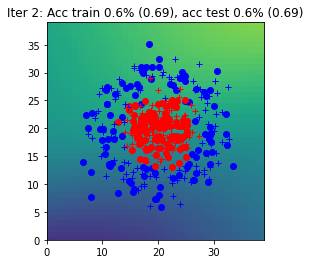

Iter 3: Acc train 0.6% (0.69), acc test 0.6% (0.69)


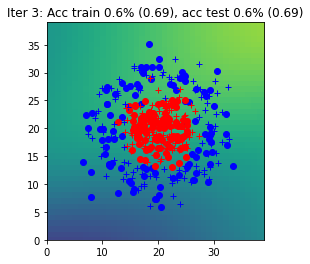

Iter 4: Acc train 0.5% (0.69), acc test 0.5% (0.69)


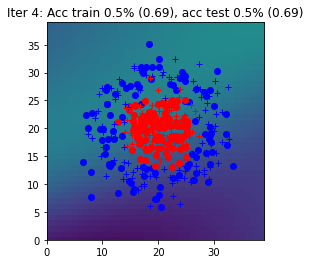

Iter 5: Acc train 0.7% (0.67), acc test 0.7% (0.67)


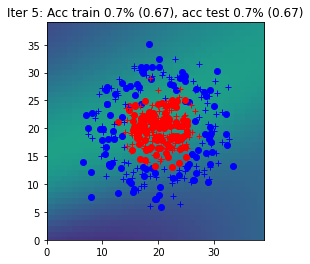

Iter 6: Acc train 0.6% (0.66), acc test 0.6% (0.66)


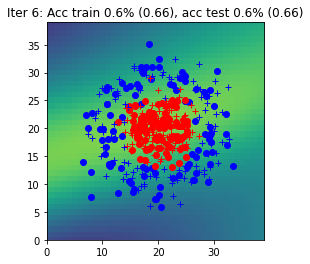

Iter 7: Acc train 0.7% (0.63), acc test 0.8% (0.63)


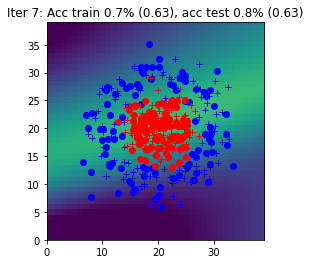

Iter 8: Acc train 0.6% (0.64), acc test 0.6% (0.63)


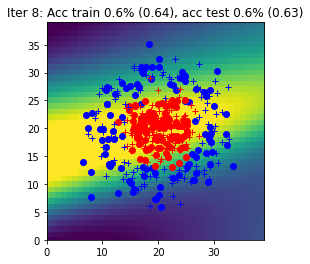

Iter 9: Acc train 0.8% (0.57), acc test 0.8% (0.57)


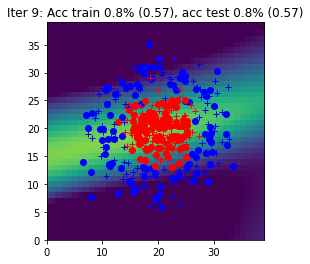

Iter 10: Acc train 0.8% (0.55), acc test 0.7% (0.55)


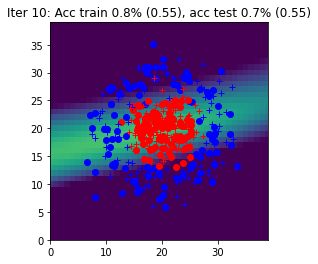

Iter 11: Acc train 0.8% (0.52), acc test 0.8% (0.51)


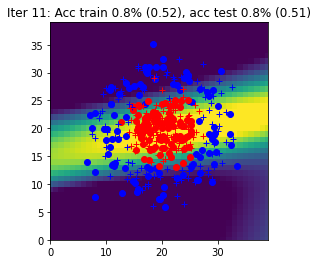

Iter 12: Acc train 0.8% (0.51), acc test 0.8% (0.51)


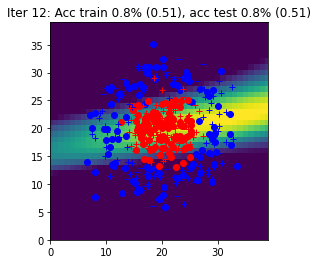

Iter 13: Acc train 0.8% (0.48), acc test 0.8% (0.48)


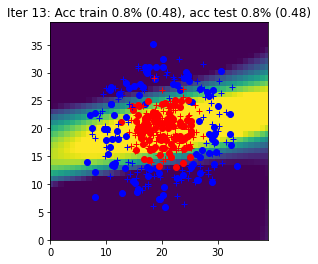

Iter 14: Acc train 0.8% (0.46), acc test 0.8% (0.45)


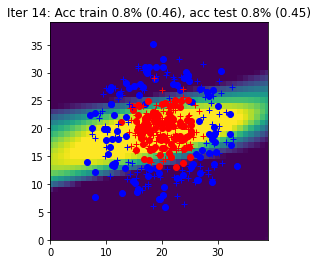

Iter 15: Acc train 0.8% (0.45), acc test 0.8% (0.45)


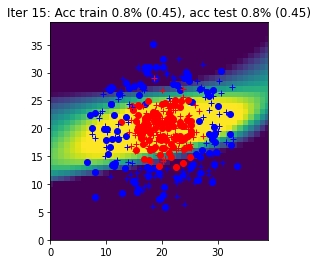

Iter 16: Acc train 0.8% (0.42), acc test 0.8% (0.42)


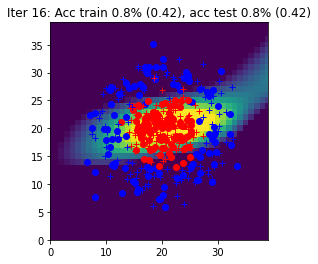

Iter 17: Acc train 0.8% (0.39), acc test 0.8% (0.38)


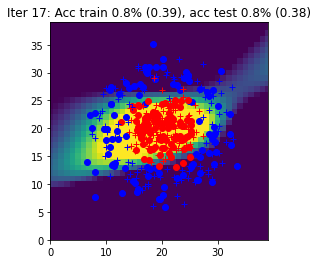

Iter 18: Acc train 0.9% (0.34), acc test 0.9% (0.35)


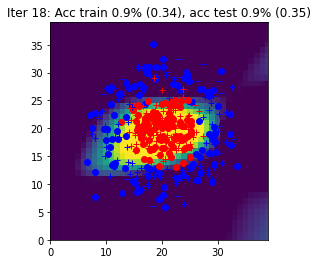

Iter 19: Acc train 0.9% (0.33), acc test 0.9% (0.35)


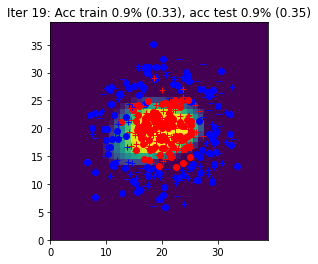

Iter 20: Acc train 0.9% (0.29), acc test 0.9% (0.29)


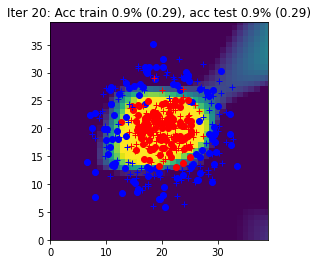

Iter 21: Acc train 0.9% (0.25), acc test 0.9% (0.27)


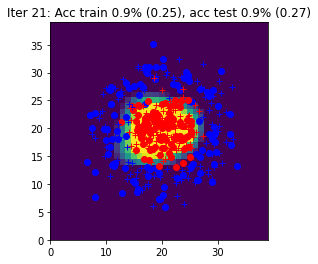

Iter 22: Acc train 0.9% (0.22), acc test 1.0% (0.24)


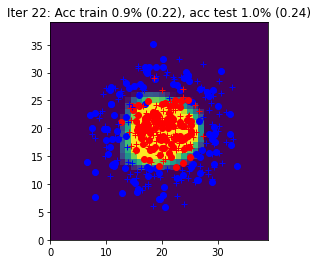

Iter 23: Acc train 0.9% (0.21), acc test 0.9% (0.22)


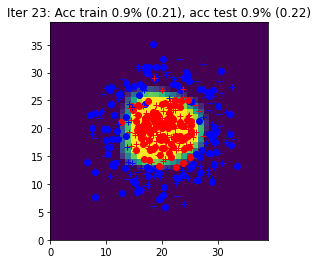

Iter 24: Acc train 0.9% (0.20), acc test 1.0% (0.21)


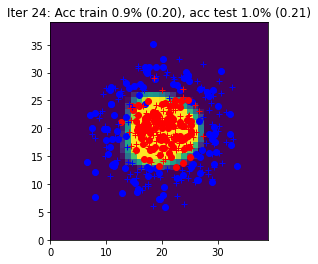

Iter 25: Acc train 0.9% (0.22), acc test 0.9% (0.22)


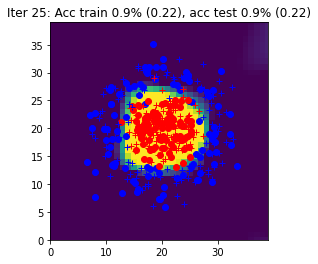

Iter 26: Acc train 0.9% (0.19), acc test 0.9% (0.20)


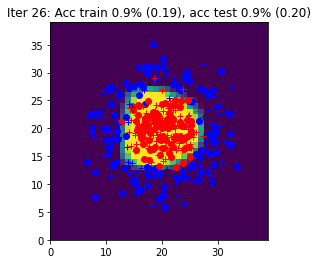

Iter 27: Acc train 1.0% (0.18), acc test 0.9% (0.19)


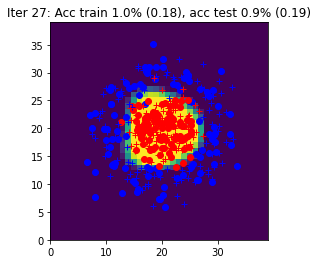

Iter 28: Acc train 0.9% (0.17), acc test 0.9% (0.20)


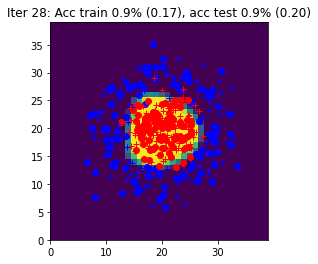

Iter 29: Acc train 0.9% (0.18), acc test 0.9% (0.21)


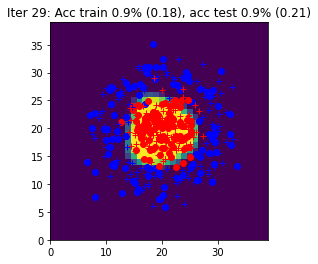

Iter 30: Acc train 0.9% (0.18), acc test 0.9% (0.22)


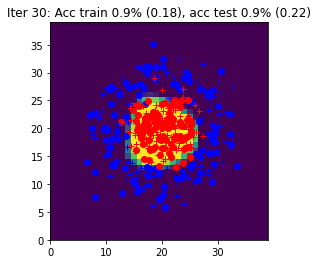

Iter 31: Acc train 0.9% (0.17), acc test 0.9% (0.18)


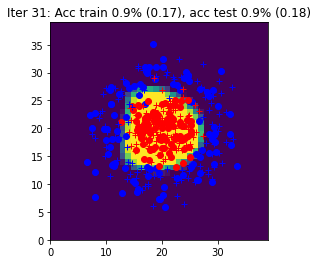

Iter 32: Acc train 0.9% (0.16), acc test 0.9% (0.20)


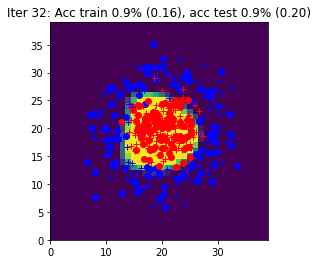

Iter 33: Acc train 0.9% (0.16), acc test 0.9% (0.17)


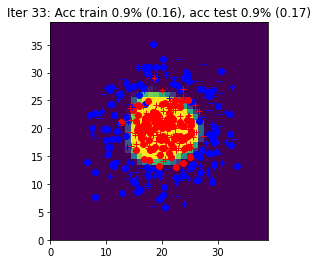

Iter 34: Acc train 0.9% (0.16), acc test 0.9% (0.18)


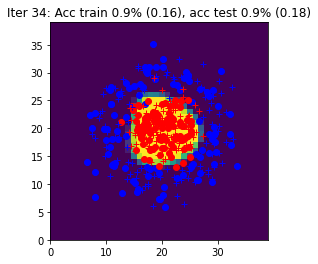

Iter 35: Acc train 0.9% (0.19), acc test 0.9% (0.19)


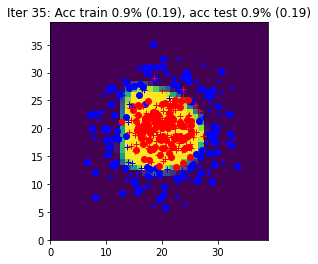

Iter 36: Acc train 0.9% (0.15), acc test 0.9% (0.19)


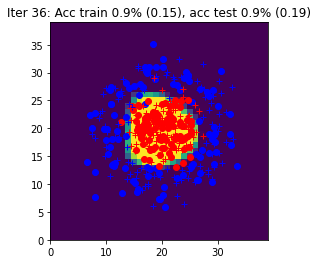

Iter 37: Acc train 0.9% (0.16), acc test 0.9% (0.15)


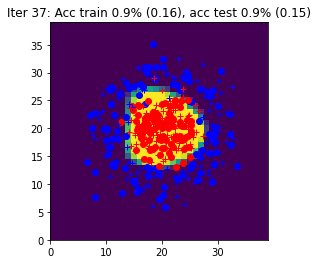

Iter 38: Acc train 0.9% (0.17), acc test 0.9% (0.21)


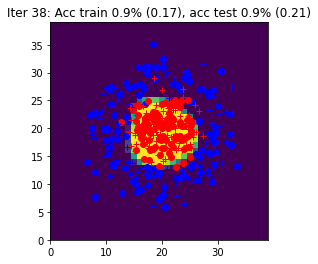

Iter 39: Acc train 0.9% (0.16), acc test 0.9% (0.16)


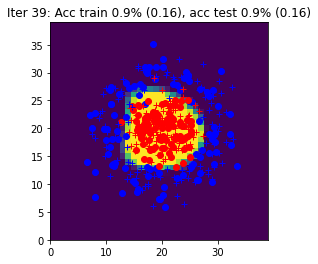

Iter 40: Acc train 0.9% (0.15), acc test 1.0% (0.15)


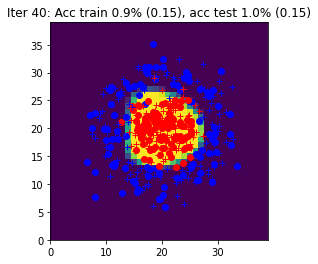

Iter 41: Acc train 1.0% (0.14), acc test 0.9% (0.16)


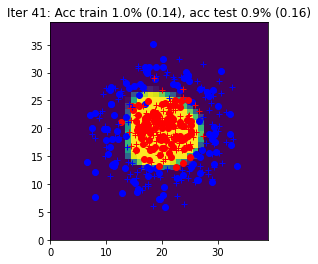

Iter 42: Acc train 0.9% (0.17), acc test 0.9% (0.22)


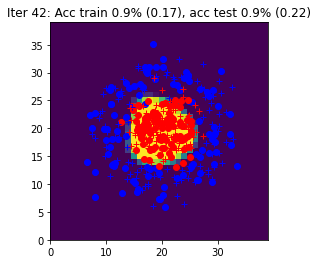

Iter 43: Acc train 0.9% (0.15), acc test 0.9% (0.15)


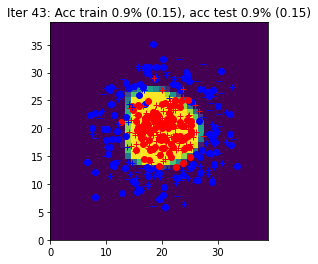

Iter 44: Acc train 1.0% (0.15), acc test 0.9% (0.16)


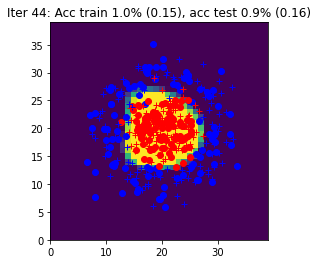

Iter 45: Acc train 0.9% (0.16), acc test 0.9% (0.20)


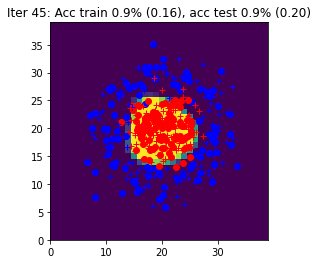

Iter 46: Acc train 0.9% (0.14), acc test 0.9% (0.16)


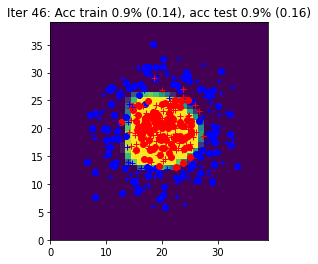

Iter 47: Acc train 0.9% (0.14), acc test 0.9% (0.15)


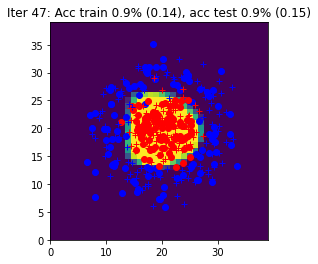

Iter 48: Acc train 0.9% (0.14), acc test 0.9% (0.15)


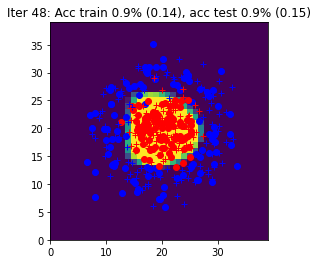

Iter 49: Acc train 0.9% (0.14), acc test 0.9% (0.16)


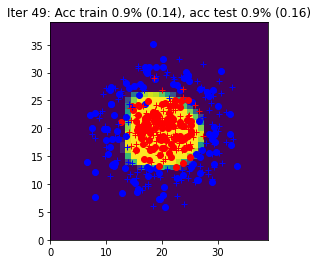

Iter 50: Acc train 0.9% (0.14), acc test 0.9% (0.17)


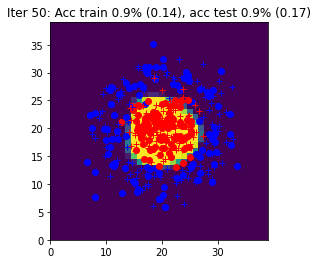

Iter 51: Acc train 1.0% (0.13), acc test 0.9% (0.17)


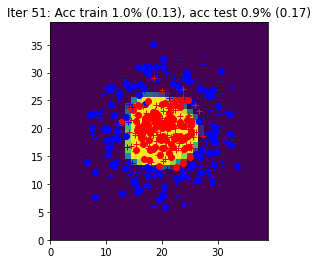

Iter 52: Acc train 1.0% (0.14), acc test 0.9% (0.15)


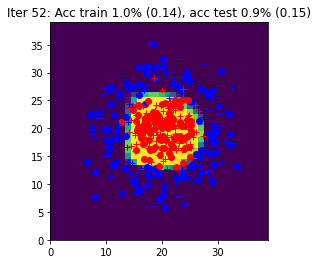

Iter 53: Acc train 0.9% (0.15), acc test 0.9% (0.20)


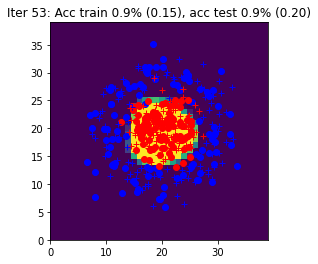

Iter 54: Acc train 1.0% (0.13), acc test 0.9% (0.16)


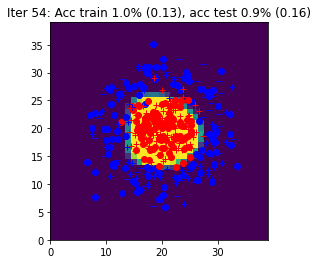

Iter 55: Acc train 0.9% (0.13), acc test 0.9% (0.15)


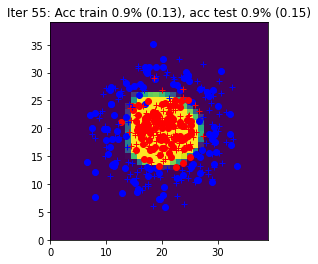

Iter 56: Acc train 1.0% (0.15), acc test 0.9% (0.15)


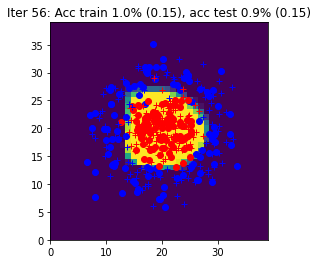

Iter 57: Acc train 0.9% (0.14), acc test 0.9% (0.14)


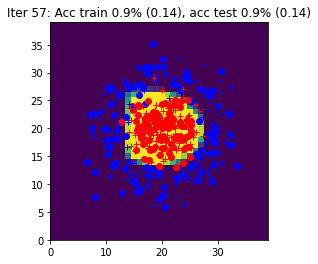

Iter 58: Acc train 0.9% (0.14), acc test 0.9% (0.16)


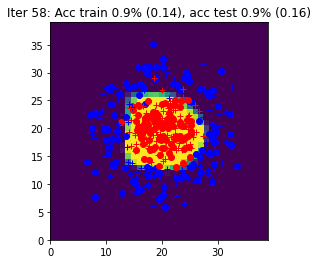

Iter 59: Acc train 0.9% (0.13), acc test 0.9% (0.16)


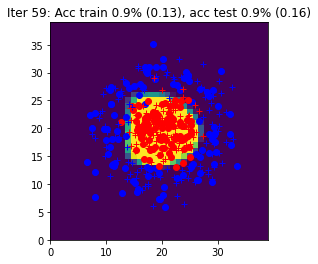

Iter 60: Acc train 0.9% (0.15), acc test 0.9% (0.21)


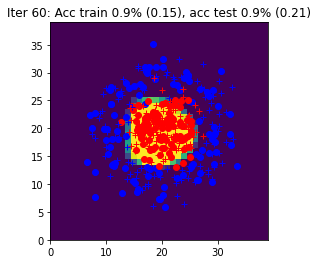

Iter 61: Acc train 0.9% (0.14), acc test 0.9% (0.17)


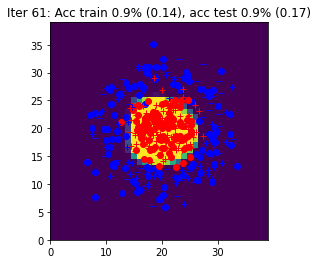

Iter 62: Acc train 0.9% (0.18), acc test 0.9% (0.25)


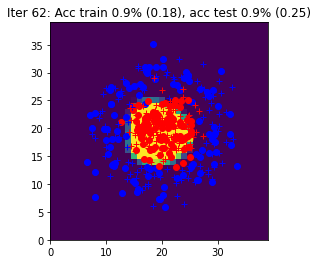

Iter 63: Acc train 0.9% (0.13), acc test 0.9% (0.19)


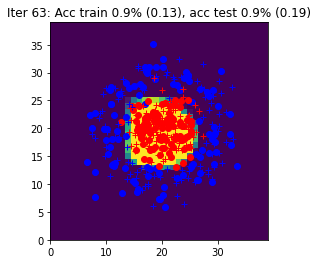

Iter 64: Acc train 0.9% (0.13), acc test 1.0% (0.16)


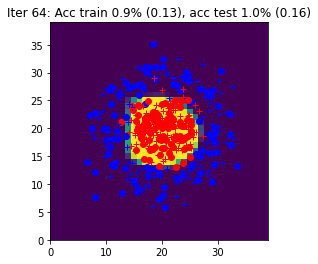

Iter 65: Acc train 0.9% (0.13), acc test 0.9% (0.16)


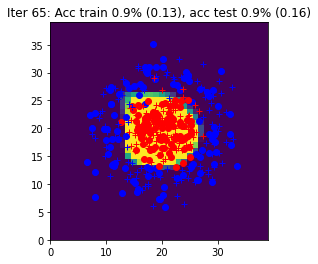

Iter 66: Acc train 0.9% (0.15), acc test 0.9% (0.19)


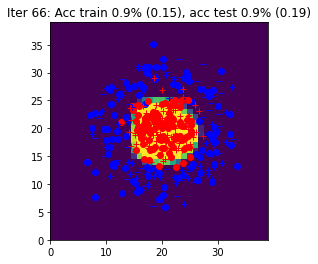

Iter 67: Acc train 1.0% (0.13), acc test 0.9% (0.15)


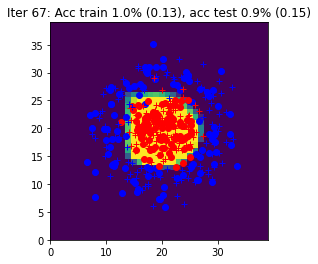

Iter 68: Acc train 0.9% (0.15), acc test 0.9% (0.15)


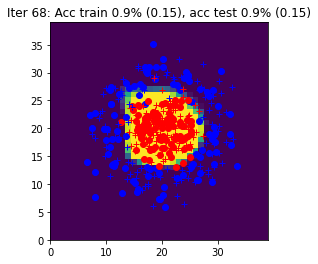

Iter 69: Acc train 0.9% (0.15), acc test 0.9% (0.18)


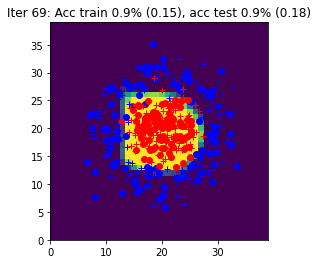

Iter 70: Acc train 1.0% (0.13), acc test 1.0% (0.16)


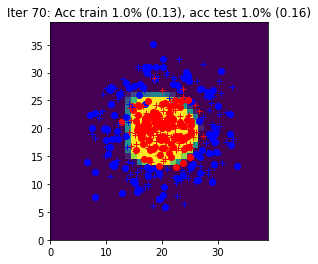

Iter 71: Acc train 0.9% (0.12), acc test 0.9% (0.16)


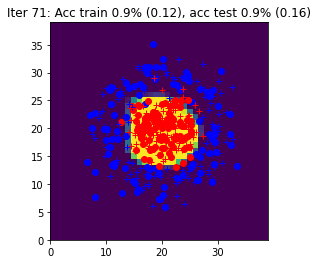

Iter 72: Acc train 1.0% (0.13), acc test 0.9% (0.17)


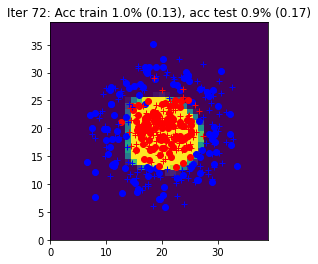

Iter 73: Acc train 1.0% (0.12), acc test 0.9% (0.15)


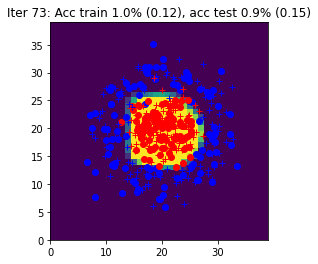

Iter 74: Acc train 1.0% (0.12), acc test 0.9% (0.15)


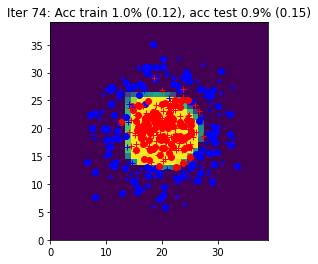

Iter 75: Acc train 1.0% (0.12), acc test 0.9% (0.15)


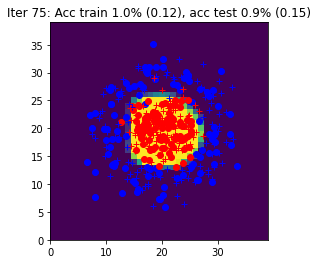

Iter 76: Acc train 1.0% (0.12), acc test 1.0% (0.15)


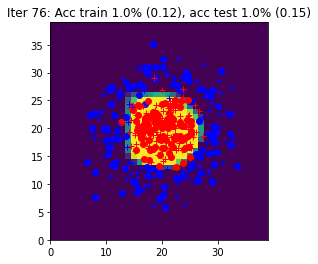

Iter 77: Acc train 1.0% (0.13), acc test 0.9% (0.15)


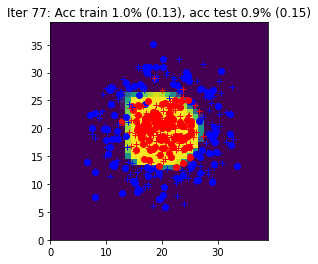

Iter 78: Acc train 0.9% (0.14), acc test 0.9% (0.16)


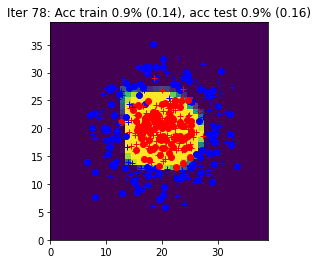

Iter 79: Acc train 0.9% (0.13), acc test 0.9% (0.19)


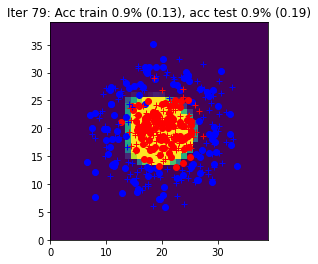

Iter 80: Acc train 0.9% (0.13), acc test 0.9% (0.18)


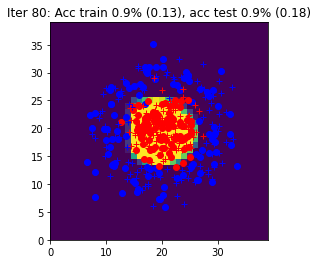

Iter 81: Acc train 1.0% (0.12), acc test 0.9% (0.15)


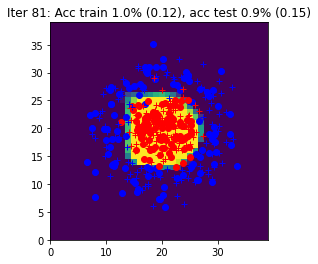

Iter 82: Acc train 1.0% (0.12), acc test 0.9% (0.15)


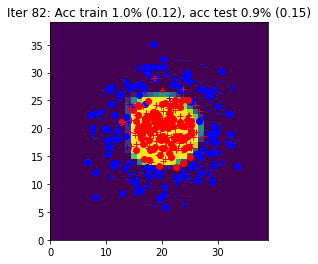

Iter 83: Acc train 1.0% (0.12), acc test 0.9% (0.15)


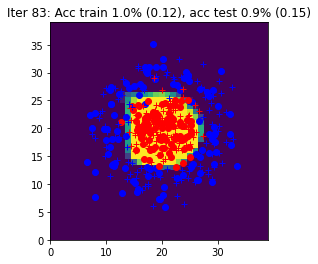

Iter 84: Acc train 1.0% (0.12), acc test 0.9% (0.17)


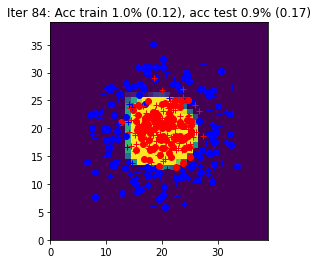

Iter 85: Acc train 1.0% (0.12), acc test 1.0% (0.14)


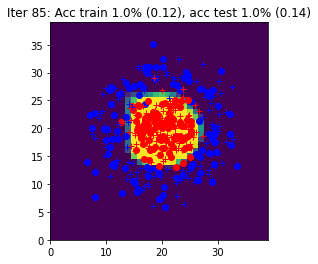

Iter 86: Acc train 0.9% (0.12), acc test 1.0% (0.18)


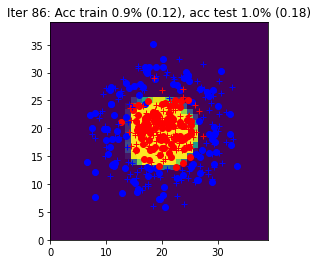

Iter 87: Acc train 0.9% (0.13), acc test 0.9% (0.18)


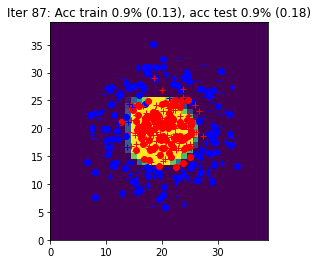

Iter 88: Acc train 0.9% (0.12), acc test 0.9% (0.16)


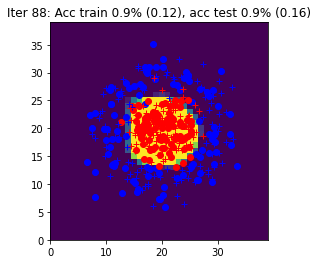

Iter 89: Acc train 1.0% (0.13), acc test 1.0% (0.17)


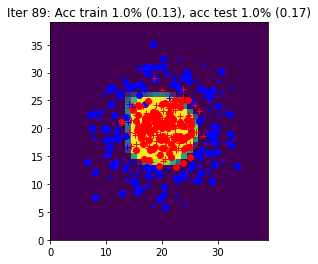

Iter 90: Acc train 1.0% (0.12), acc test 1.0% (0.18)


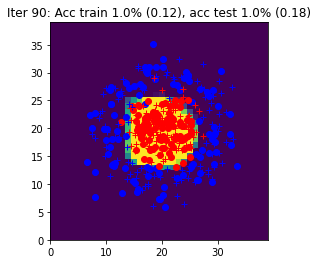

Iter 91: Acc train 1.0% (0.12), acc test 0.9% (0.16)


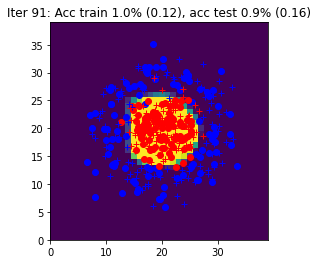

Iter 92: Acc train 1.0% (0.12), acc test 0.9% (0.18)


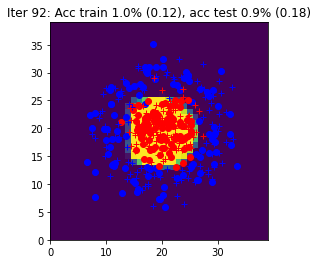

Iter 93: Acc train 1.0% (0.12), acc test 0.9% (0.15)


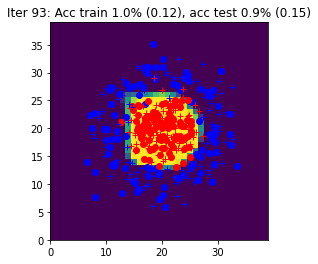

Iter 94: Acc train 1.0% (0.13), acc test 0.9% (0.16)


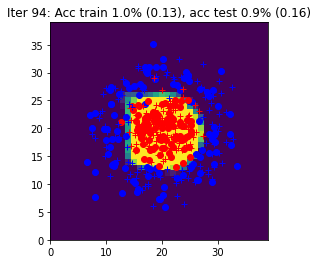

Iter 95: Acc train 1.0% (0.11), acc test 1.0% (0.15)


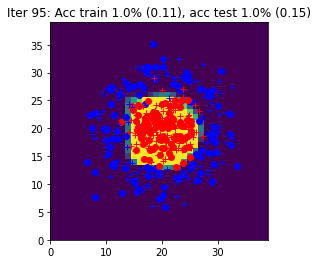

Iter 96: Acc train 0.9% (0.13), acc test 0.9% (0.19)


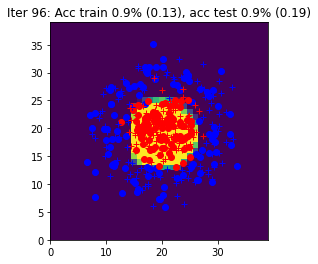

Iter 97: Acc train 1.0% (0.12), acc test 0.9% (0.19)


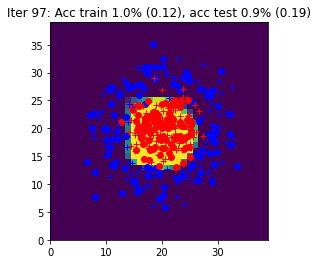

Iter 98: Acc train 0.9% (0.12), acc test 0.9% (0.18)


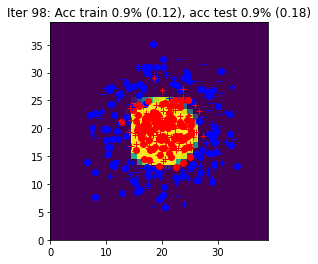

Iter 99: Acc train 0.9% (0.12), acc test 0.9% (0.17)


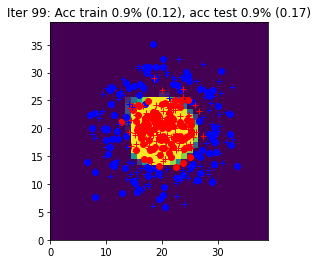

Iter 100: Acc train 0.9% (0.15), acc test 0.9% (0.18)


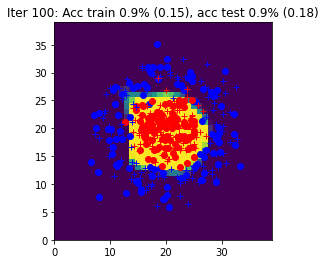

Iter 101: Acc train 1.0% (0.12), acc test 0.9% (0.17)


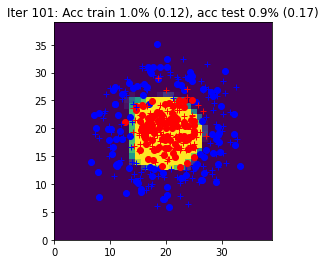

Iter 102: Acc train 1.0% (0.11), acc test 0.9% (0.16)


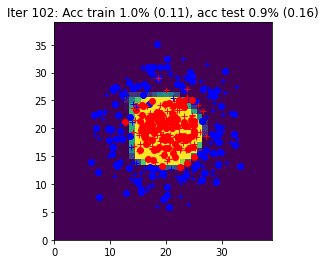

Iter 103: Acc train 1.0% (0.11), acc test 1.0% (0.17)


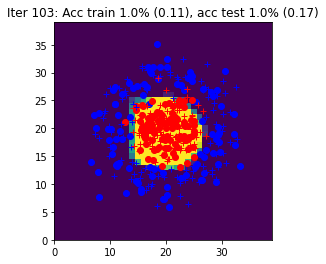

Iter 104: Acc train 1.0% (0.12), acc test 1.0% (0.15)


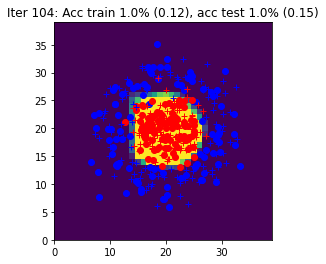

Iter 105: Acc train 0.9% (0.12), acc test 0.9% (0.17)


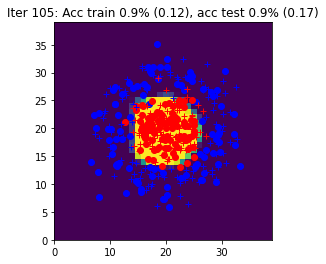

Iter 106: Acc train 0.9% (0.15), acc test 0.9% (0.24)


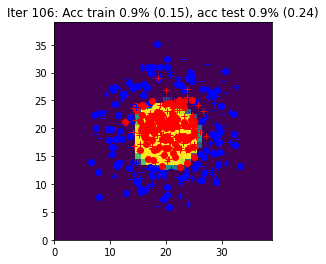

Iter 107: Acc train 1.0% (0.12), acc test 0.9% (0.14)


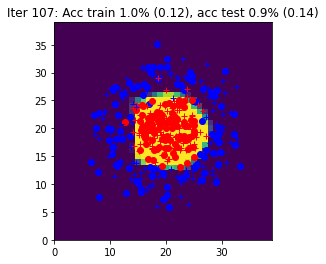

Iter 108: Acc train 1.0% (0.12), acc test 0.9% (0.16)


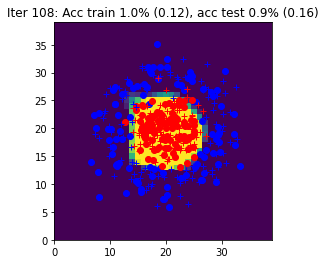

Iter 109: Acc train 1.0% (0.13), acc test 0.9% (0.15)


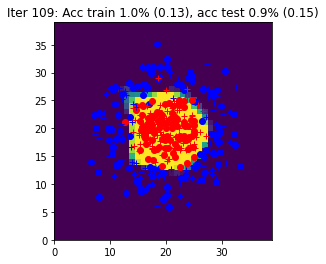

Iter 110: Acc train 0.9% (0.12), acc test 0.9% (0.18)


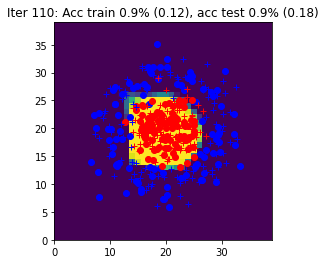

Iter 111: Acc train 1.0% (0.12), acc test 1.0% (0.19)


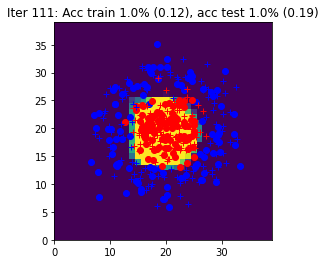

Iter 112: Acc train 1.0% (0.12), acc test 0.9% (0.14)


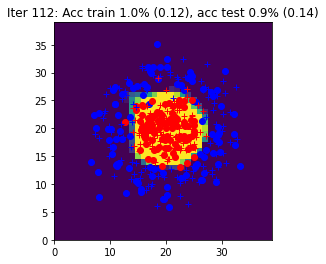

Iter 113: Acc train 1.0% (0.11), acc test 0.9% (0.14)


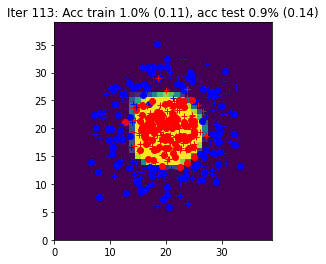

Iter 114: Acc train 0.9% (0.13), acc test 0.9% (0.21)


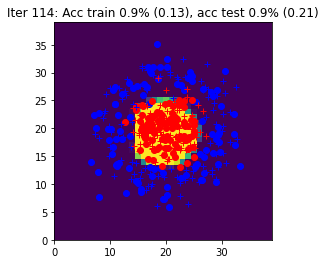

Iter 115: Acc train 0.9% (0.12), acc test 0.9% (0.19)


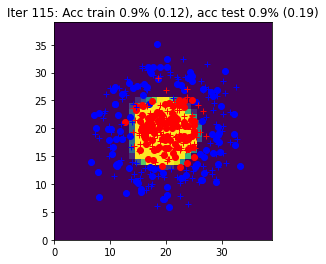

Iter 116: Acc train 0.9% (0.12), acc test 0.9% (0.18)


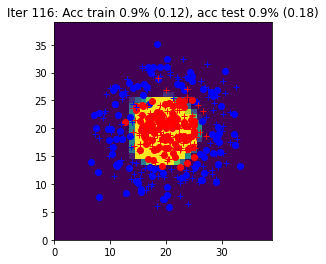

Iter 117: Acc train 1.0% (0.11), acc test 0.9% (0.15)


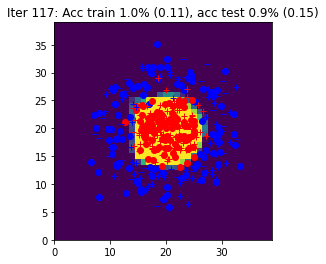

Iter 118: Acc train 1.0% (0.11), acc test 0.9% (0.16)


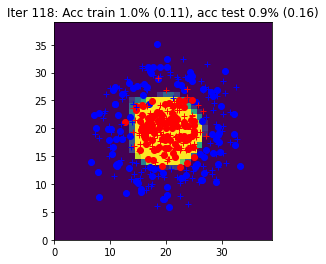

Iter 119: Acc train 1.0% (0.11), acc test 0.9% (0.16)


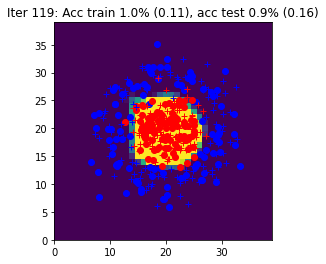

Iter 120: Acc train 1.0% (0.13), acc test 0.9% (0.15)


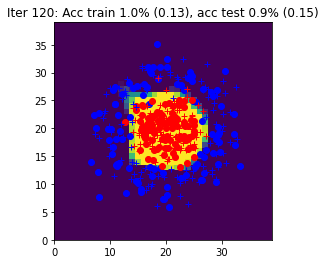

Iter 121: Acc train 0.9% (0.13), acc test 0.9% (0.22)


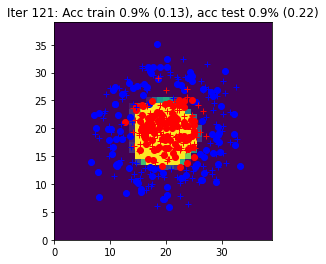

Iter 122: Acc train 1.0% (0.12), acc test 1.0% (0.15)


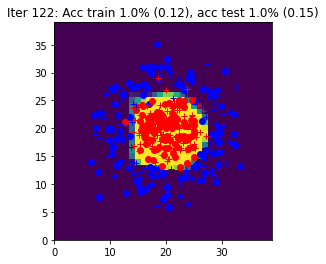

Iter 123: Acc train 1.0% (0.11), acc test 0.9% (0.16)


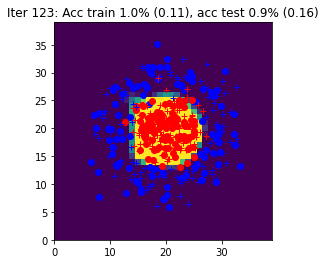

Iter 124: Acc train 0.9% (0.11), acc test 0.9% (0.17)


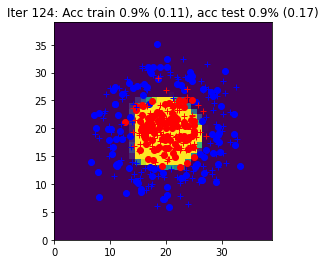

Iter 125: Acc train 1.0% (0.13), acc test 0.9% (0.15)


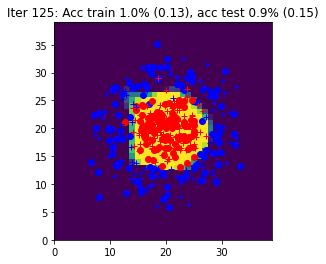

Iter 126: Acc train 1.0% (0.12), acc test 0.9% (0.14)


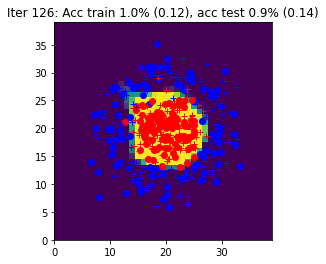

Iter 127: Acc train 1.0% (0.11), acc test 1.0% (0.16)


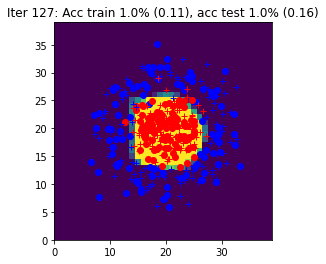

Iter 128: Acc train 1.0% (0.11), acc test 1.0% (0.19)


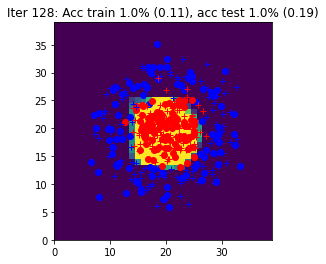

Iter 129: Acc train 1.0% (0.11), acc test 0.9% (0.15)


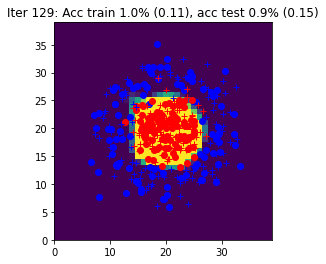

Iter 130: Acc train 1.0% (0.15), acc test 0.9% (0.16)


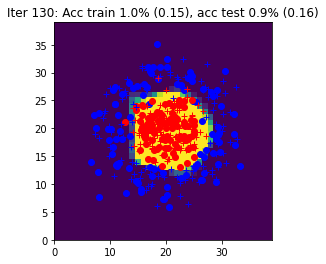

Iter 131: Acc train 1.0% (0.11), acc test 0.9% (0.17)


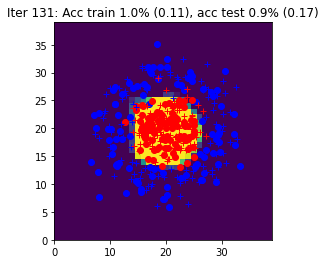

Iter 132: Acc train 1.0% (0.11), acc test 1.0% (0.17)


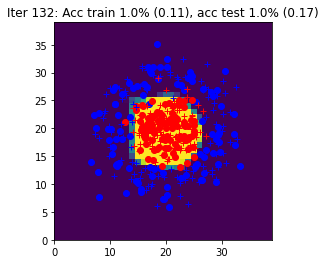

Iter 133: Acc train 0.9% (0.12), acc test 1.0% (0.18)


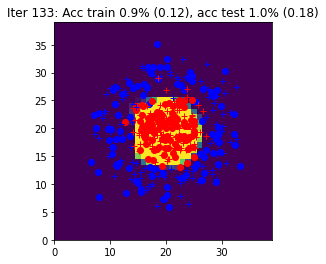

Iter 134: Acc train 1.0% (0.12), acc test 0.9% (0.20)


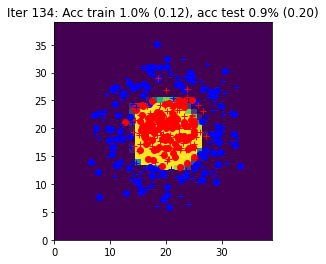

Iter 135: Acc train 1.0% (0.12), acc test 0.9% (0.16)


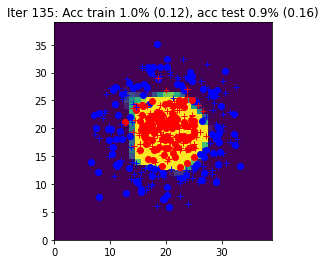

Iter 136: Acc train 1.0% (0.11), acc test 0.9% (0.15)


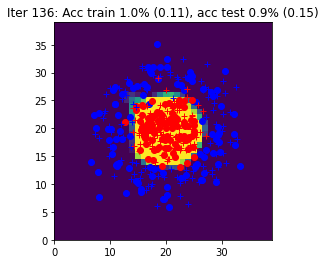

Iter 137: Acc train 1.0% (0.11), acc test 0.9% (0.17)


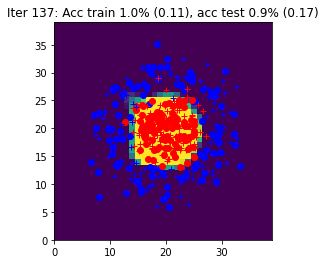

Iter 138: Acc train 1.0% (0.11), acc test 0.9% (0.17)


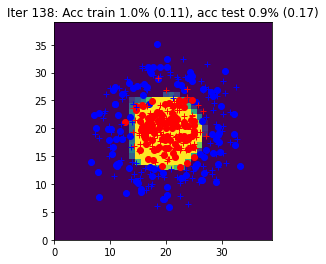

Iter 139: Acc train 0.9% (0.12), acc test 0.9% (0.19)


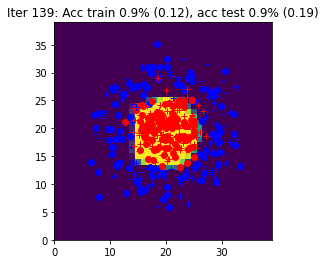

Iter 140: Acc train 0.9% (0.14), acc test 0.9% (0.18)


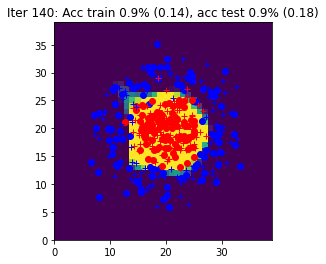

Iter 141: Acc train 1.0% (0.11), acc test 0.9% (0.17)


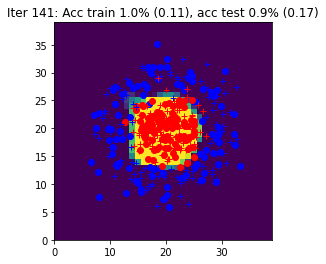

Iter 142: Acc train 1.0% (0.11), acc test 0.9% (0.18)


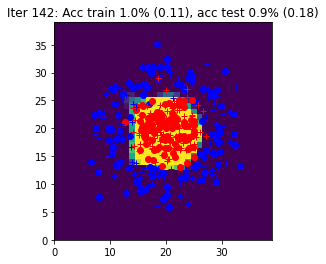

Iter 143: Acc train 1.0% (0.12), acc test 0.9% (0.17)


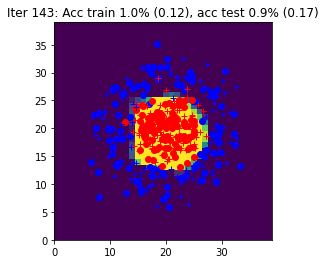

Iter 144: Acc train 1.0% (0.11), acc test 0.9% (0.17)


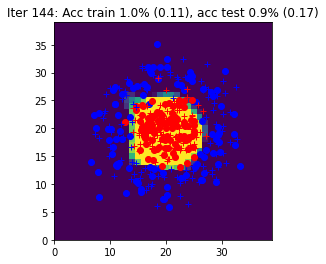

Iter 145: Acc train 0.9% (0.12), acc test 0.9% (0.19)


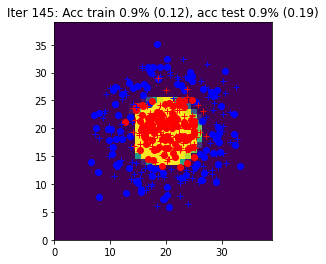

Iter 146: Acc train 1.0% (0.11), acc test 0.9% (0.17)


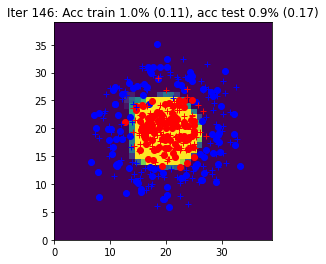

Iter 147: Acc train 1.0% (0.11), acc test 0.9% (0.16)


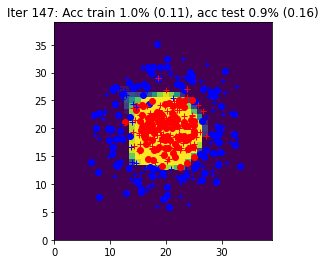

Iter 148: Acc train 1.0% (0.11), acc test 1.0% (0.18)


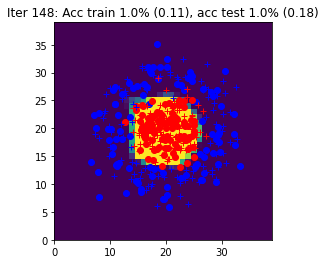

Iter 149: Acc train 1.0% (0.11), acc test 0.9% (0.16)


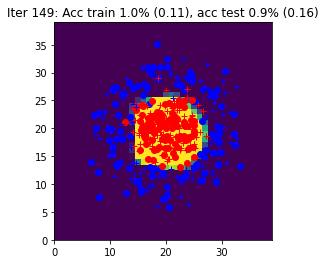

Finished after 24.35306143760681 seconds 


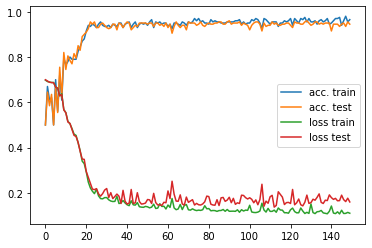

In [10]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch

tic = time()

for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        
        # pass batch forward
        Yhat , outputs = forward(params, X)
        
        # batch loss  
        loss , accuracy = loss_accuracy(Yhat, Y)
        
        # batch backward
        grads = backward(params, outputs, Y)
        
        # descent gradient
        params = sgd(params, grads, eta)

    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(Ygrid, title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

toc = time()

print(f"Finished after {toc-tic} seconds ")

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 2 : Simplification of the backward pass with `torch.autograd`



In [11]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}

    params["Wh"] = torch.normal(mean=0,std=0.3,size=(nh,nx),requires_grad=True)
    params["Wy"] = torch.normal(mean=0,std=0.3,size=(ny,nh),requires_grad=True)
    params["bh"] =  torch.normal(mean=0,std=0.3,size=(1,nh),requires_grad=True)
    params["by"] =  torch.normal(mean=0,std=0.3,size=(1,ny),requires_grad=True)
    
    return params

The function `forward` remains unchanged from previous part.

The function `backward` is no longer used because of "autograd".

In [12]:
def sgd(params, eta):

    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators
    
    with torch.no_grad():
        params["Wh"] -= eta * params["Wh"].grad
        params["Wh"].grad.zero_()
        params["Wy"] -= eta * params["Wy"].grad
        params["Wy"].grad.zero_()
        params["bh"] -= eta * params["bh"].grad
        params["bh"].grad.zero_()
        params["by"] -= eta * params["by"].grad
        params["by"].grad.zero_()
    return params

## Global learning procedure with autograd

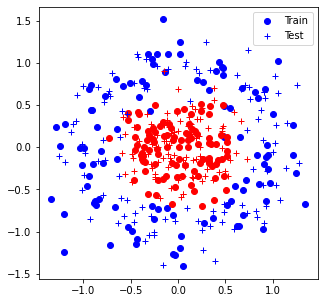

Iter 0: Acc train 0.7% (0.74), acc test 0.6% (0.73)


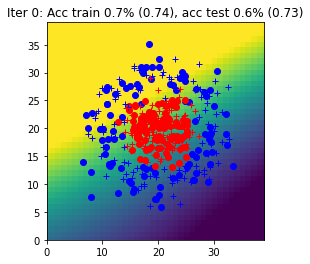

Iter 1: Acc train 0.6% (0.72), acc test 0.6% (0.72)


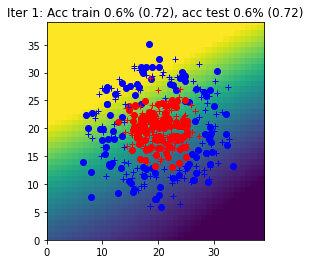

Iter 2: Acc train 0.6% (0.71), acc test 0.6% (0.71)


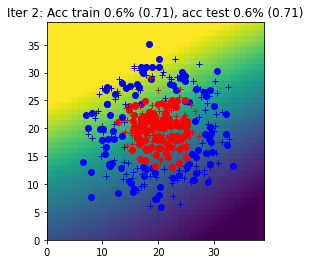

Iter 3: Acc train 0.5% (0.71), acc test 0.6% (0.70)


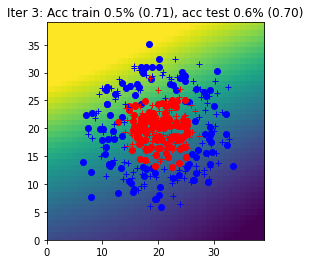

Iter 4: Acc train 0.5% (0.70), acc test 0.6% (0.70)


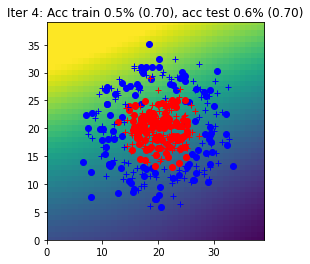

Iter 5: Acc train 0.5% (0.70), acc test 0.5% (0.70)


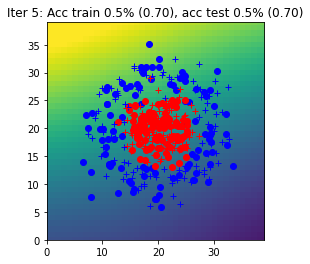

Iter 6: Acc train 0.5% (0.70), acc test 0.5% (0.70)


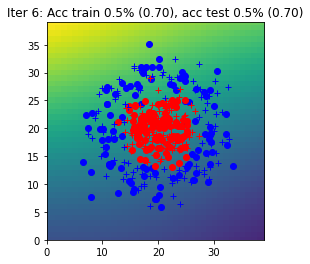

Iter 7: Acc train 0.6% (0.70), acc test 0.5% (0.70)


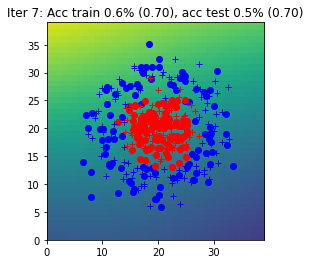

Iter 8: Acc train 0.6% (0.70), acc test 0.5% (0.69)


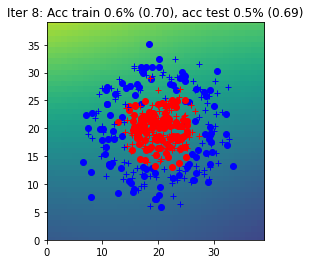

Iter 9: Acc train 0.6% (0.69), acc test 0.5% (0.69)


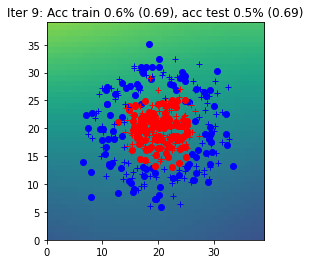

Iter 10: Acc train 0.6% (0.69), acc test 0.6% (0.69)


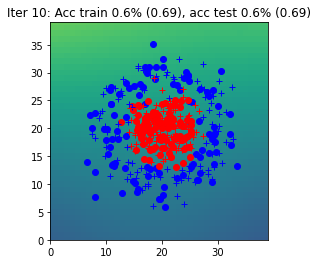

Iter 11: Acc train 0.6% (0.69), acc test 0.6% (0.69)


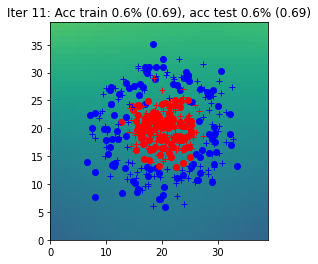

Iter 12: Acc train 0.7% (0.69), acc test 0.7% (0.69)


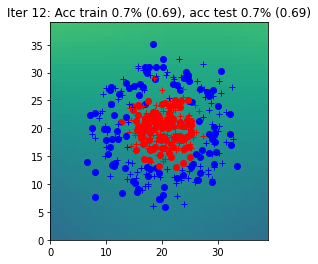

Iter 13: Acc train 0.7% (0.69), acc test 0.7% (0.69)


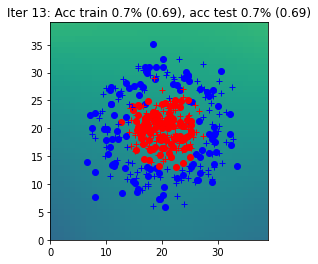

Iter 14: Acc train 0.7% (0.69), acc test 0.7% (0.69)


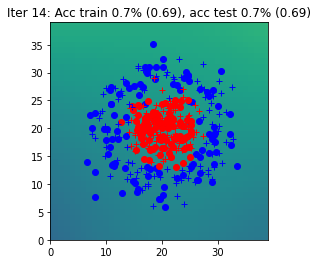

Iter 15: Acc train 0.6% (0.69), acc test 0.6% (0.69)


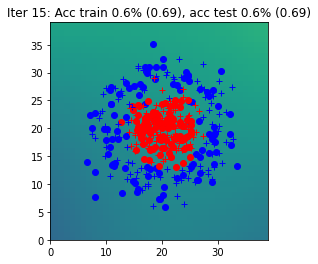

Iter 16: Acc train 0.7% (0.69), acc test 0.7% (0.69)


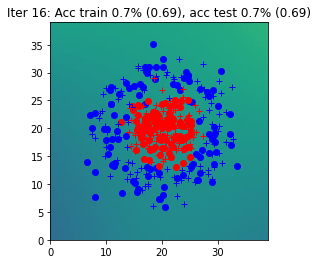

Iter 17: Acc train 0.6% (0.69), acc test 0.6% (0.69)


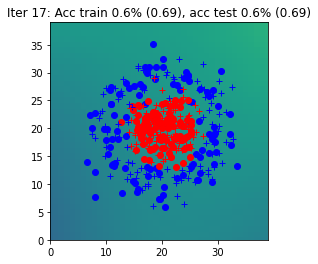

Iter 18: Acc train 0.6% (0.69), acc test 0.6% (0.69)


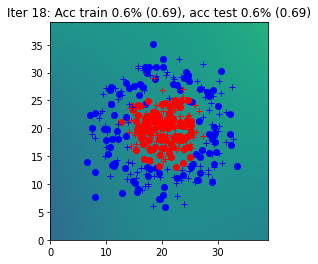

Iter 19: Acc train 0.6% (0.69), acc test 0.6% (0.69)


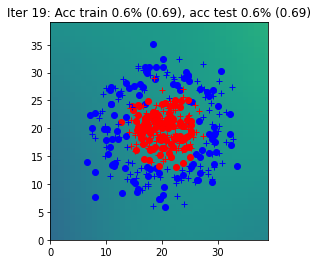

Iter 20: Acc train 0.6% (0.69), acc test 0.6% (0.69)


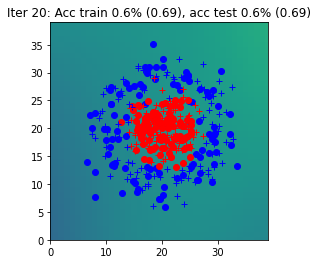

Iter 21: Acc train 0.6% (0.69), acc test 0.6% (0.69)


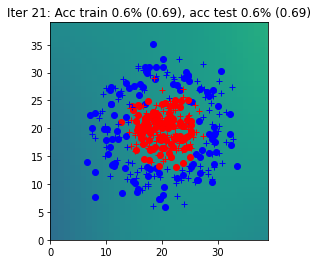

Iter 22: Acc train 0.6% (0.69), acc test 0.6% (0.69)


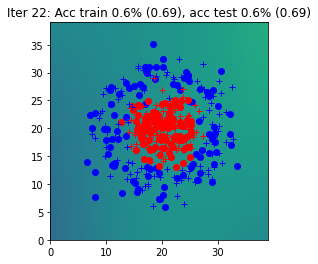

Iter 23: Acc train 0.6% (0.69), acc test 0.6% (0.69)


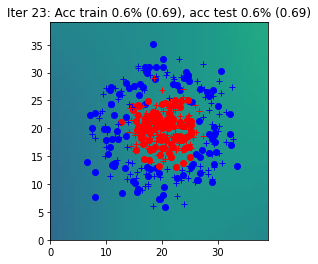

Iter 24: Acc train 0.6% (0.69), acc test 0.6% (0.69)


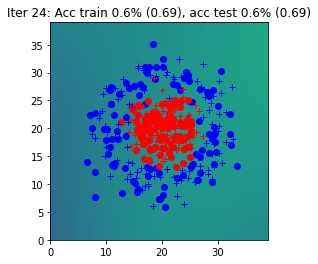

Iter 25: Acc train 0.6% (0.69), acc test 0.6% (0.69)


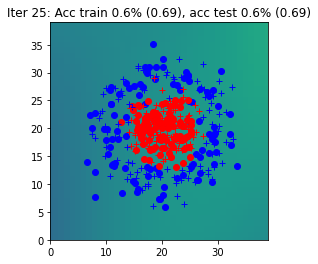

Iter 26: Acc train 0.7% (0.69), acc test 0.6% (0.69)


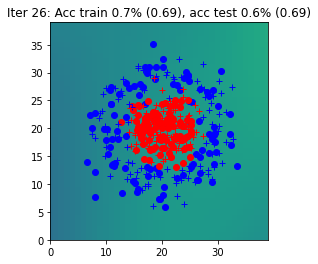

Iter 27: Acc train 0.6% (0.69), acc test 0.6% (0.69)


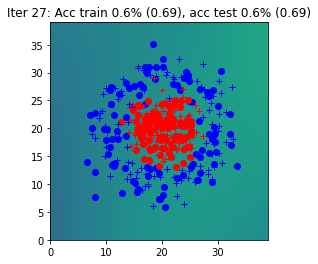

Iter 28: Acc train 0.5% (0.69), acc test 0.5% (0.69)


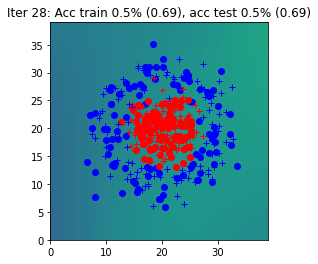

Iter 29: Acc train 0.6% (0.69), acc test 0.6% (0.69)


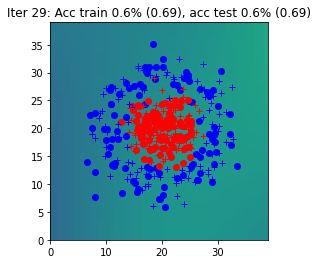

Iter 30: Acc train 0.6% (0.69), acc test 0.6% (0.69)


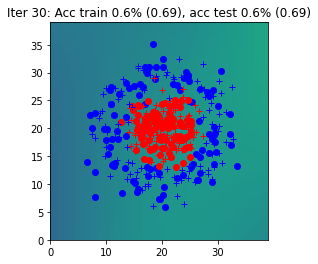

Iter 31: Acc train 0.5% (0.69), acc test 0.5% (0.69)


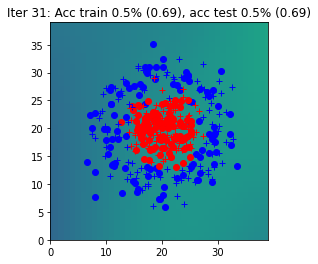

Iter 32: Acc train 0.5% (0.69), acc test 0.5% (0.69)


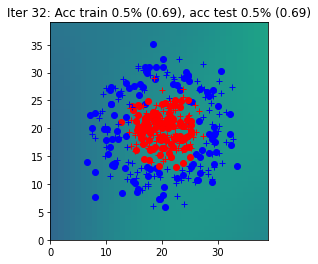

Iter 33: Acc train 0.6% (0.69), acc test 0.6% (0.69)


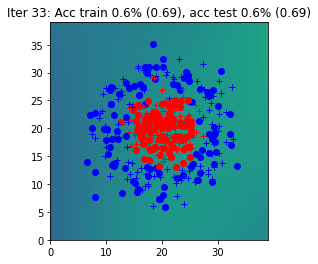

Iter 34: Acc train 0.7% (0.69), acc test 0.6% (0.69)


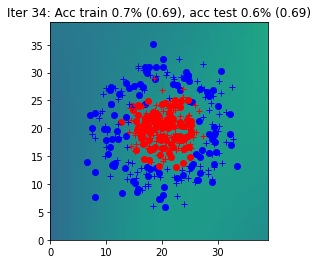

Iter 35: Acc train 0.7% (0.69), acc test 0.6% (0.69)


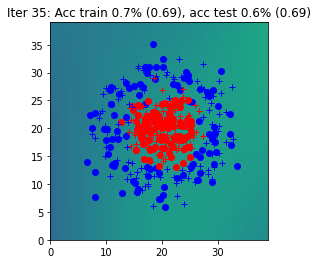

Iter 36: Acc train 0.6% (0.69), acc test 0.6% (0.69)


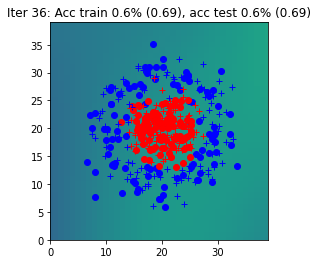

Iter 37: Acc train 0.6% (0.69), acc test 0.6% (0.69)


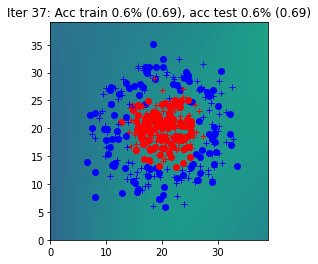

Iter 38: Acc train 0.7% (0.69), acc test 0.7% (0.69)


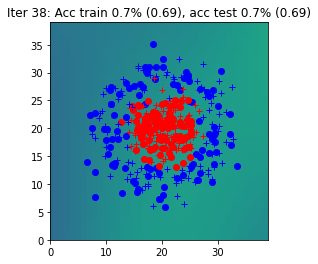

Iter 39: Acc train 0.7% (0.69), acc test 0.7% (0.69)


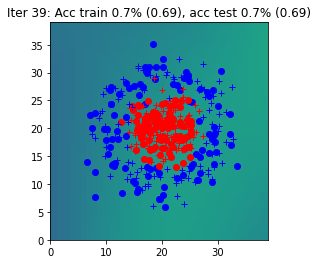

Iter 40: Acc train 0.6% (0.69), acc test 0.6% (0.69)


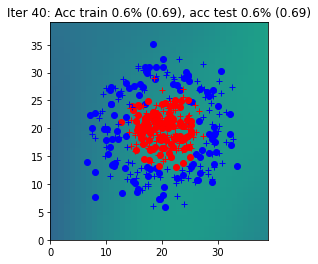

Iter 41: Acc train 0.7% (0.69), acc test 0.7% (0.69)


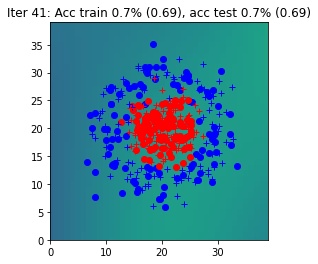

Iter 42: Acc train 0.6% (0.69), acc test 0.6% (0.69)


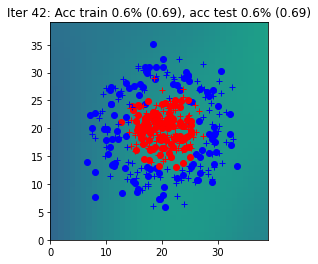

Iter 43: Acc train 0.6% (0.69), acc test 0.6% (0.69)


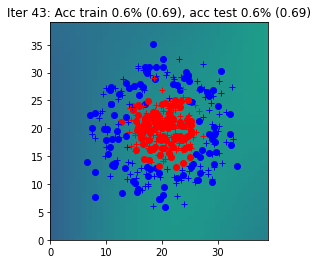

Iter 44: Acc train 0.6% (0.69), acc test 0.5% (0.69)


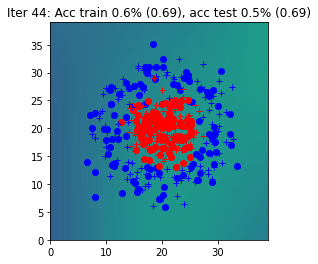

Iter 45: Acc train 0.6% (0.69), acc test 0.6% (0.69)


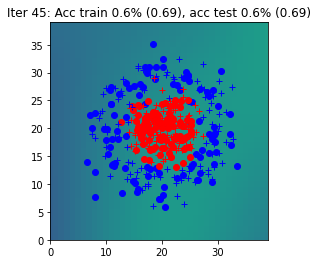

Iter 46: Acc train 0.6% (0.68), acc test 0.5% (0.69)


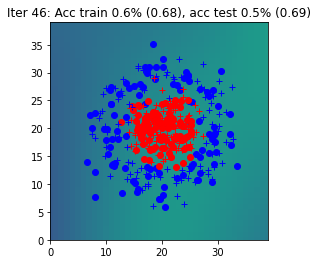

Iter 47: Acc train 0.7% (0.68), acc test 0.6% (0.69)


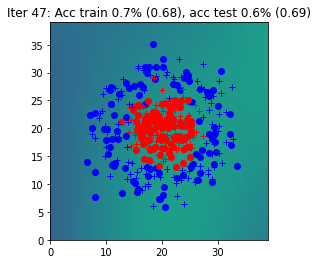

Iter 48: Acc train 0.7% (0.68), acc test 0.6% (0.69)


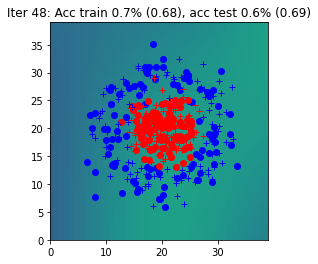

Iter 49: Acc train 0.7% (0.68), acc test 0.7% (0.69)


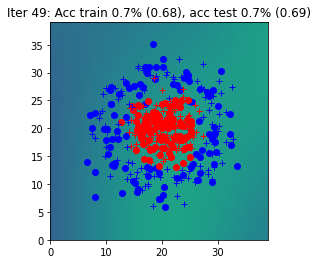

Iter 50: Acc train 0.7% (0.68), acc test 0.7% (0.68)


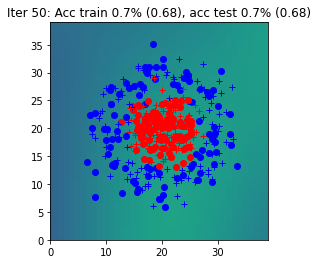

Iter 51: Acc train 0.7% (0.68), acc test 0.6% (0.68)


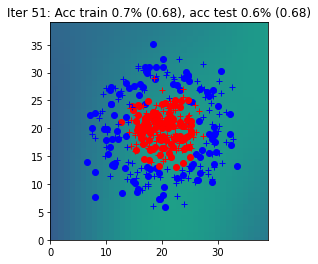

Iter 52: Acc train 0.7% (0.68), acc test 0.6% (0.68)


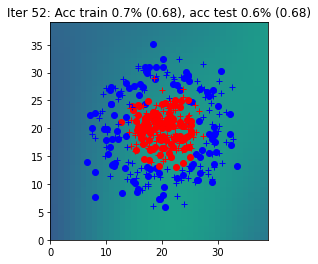

Iter 53: Acc train 0.6% (0.68), acc test 0.6% (0.68)


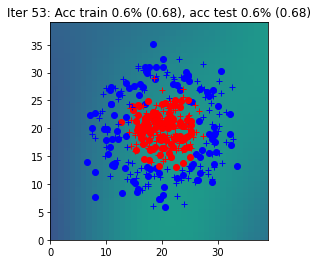

Iter 54: Acc train 0.7% (0.68), acc test 0.6% (0.68)


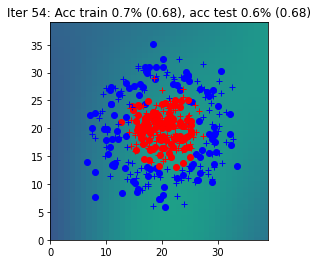

Iter 55: Acc train 0.7% (0.68), acc test 0.7% (0.68)


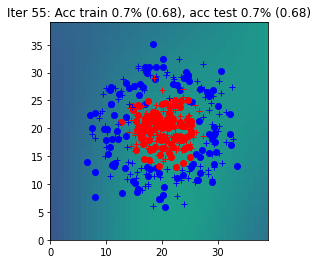

Iter 56: Acc train 0.7% (0.68), acc test 0.6% (0.68)


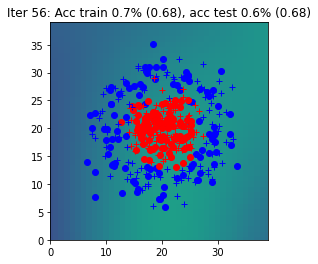

Iter 57: Acc train 0.7% (0.68), acc test 0.6% (0.68)


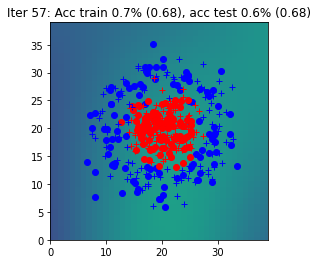

Iter 58: Acc train 0.7% (0.68), acc test 0.7% (0.68)


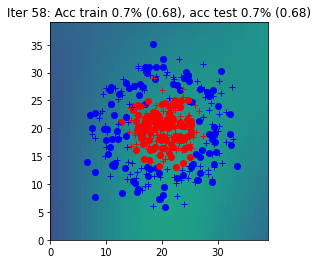

Iter 59: Acc train 0.7% (0.68), acc test 0.7% (0.68)


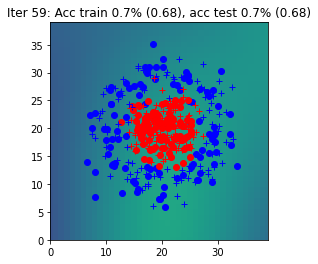

Iter 60: Acc train 0.7% (0.68), acc test 0.7% (0.68)


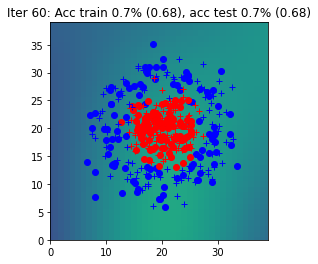

Iter 61: Acc train 0.7% (0.68), acc test 0.7% (0.68)


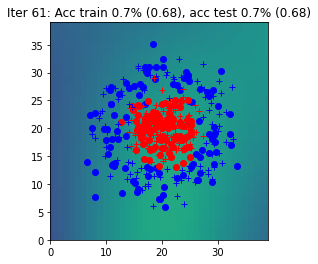

Iter 62: Acc train 0.7% (0.68), acc test 0.7% (0.68)


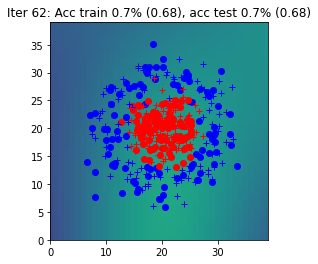

Iter 63: Acc train 0.7% (0.67), acc test 0.7% (0.68)


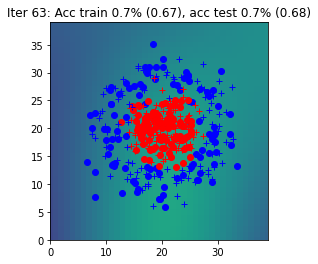

Iter 64: Acc train 0.7% (0.67), acc test 0.6% (0.68)


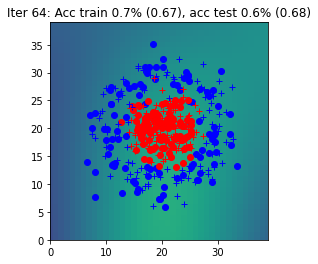

Iter 65: Acc train 0.7% (0.67), acc test 0.7% (0.67)


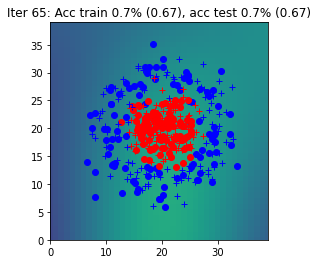

Iter 66: Acc train 0.7% (0.67), acc test 0.7% (0.67)


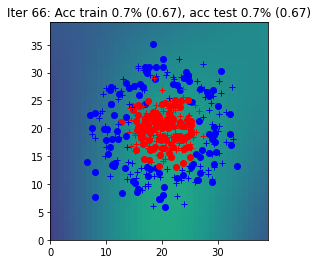

Iter 67: Acc train 0.7% (0.67), acc test 0.7% (0.67)


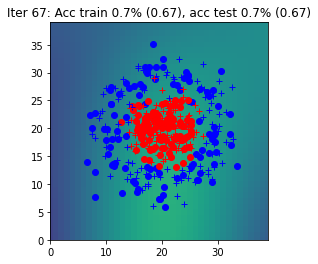

Iter 68: Acc train 0.7% (0.67), acc test 0.7% (0.67)


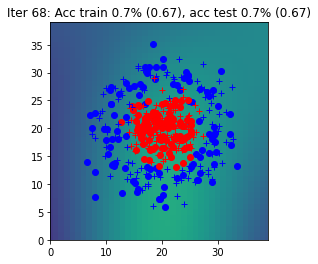

Iter 69: Acc train 0.7% (0.67), acc test 0.7% (0.67)


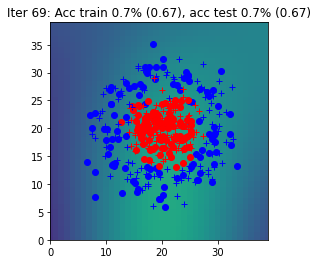

Iter 70: Acc train 0.7% (0.67), acc test 0.7% (0.67)


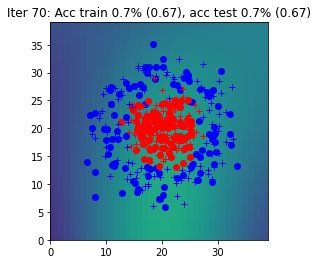

Iter 71: Acc train 0.8% (0.67), acc test 0.8% (0.67)


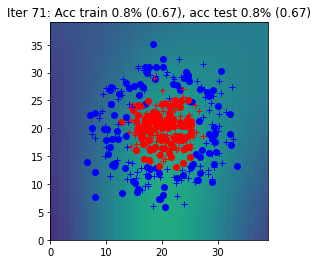

Iter 72: Acc train 0.8% (0.66), acc test 0.8% (0.67)


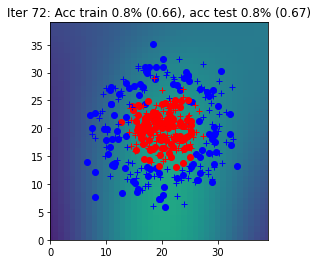

Iter 73: Acc train 0.8% (0.66), acc test 0.8% (0.66)


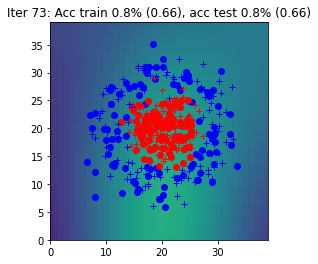

Iter 74: Acc train 0.8% (0.66), acc test 0.8% (0.66)


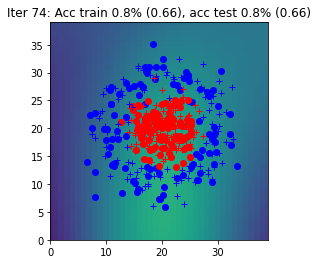

Iter 75: Acc train 0.7% (0.66), acc test 0.7% (0.66)


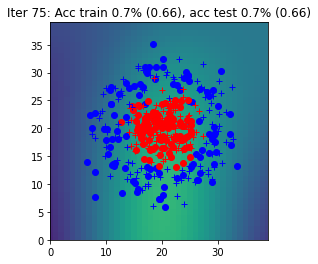

Iter 76: Acc train 0.7% (0.66), acc test 0.7% (0.66)


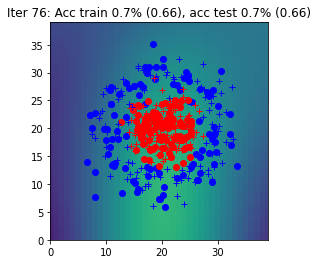

Iter 77: Acc train 0.8% (0.66), acc test 0.8% (0.66)


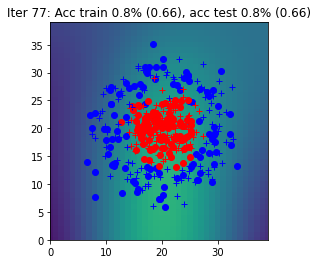

Iter 78: Acc train 0.8% (0.65), acc test 0.8% (0.66)


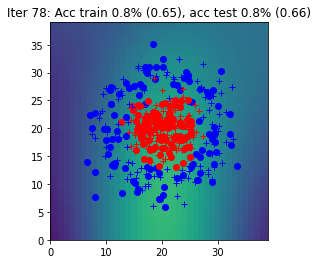

Iter 79: Acc train 0.8% (0.65), acc test 0.8% (0.65)


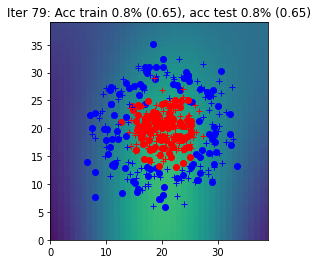

Iter 80: Acc train 0.8% (0.65), acc test 0.8% (0.65)


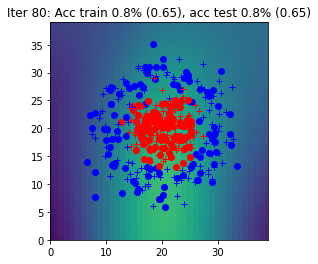

Iter 81: Acc train 0.7% (0.65), acc test 0.7% (0.65)


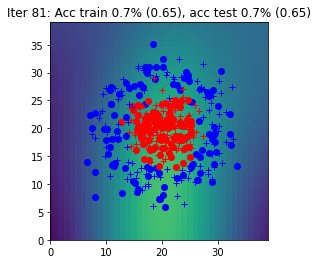

Iter 82: Acc train 0.8% (0.65), acc test 0.8% (0.65)


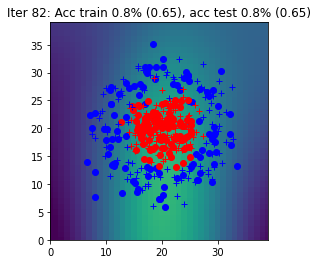

Iter 83: Acc train 0.8% (0.64), acc test 0.8% (0.64)


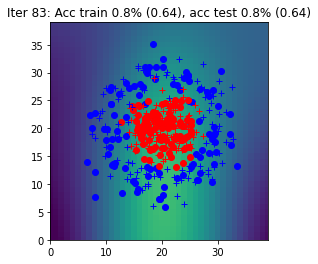

Iter 84: Acc train 0.8% (0.64), acc test 0.8% (0.64)


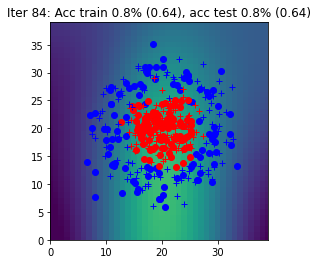

Iter 85: Acc train 0.8% (0.64), acc test 0.8% (0.64)


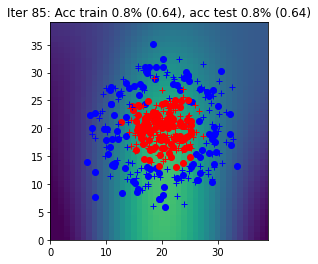

Iter 86: Acc train 0.8% (0.63), acc test 0.8% (0.64)


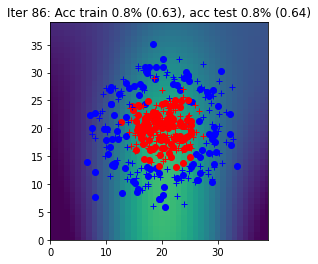

Iter 87: Acc train 0.8% (0.63), acc test 0.8% (0.63)


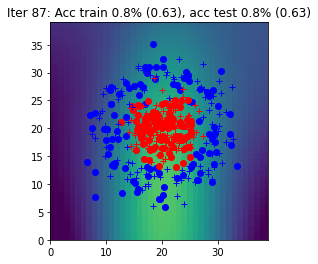

Iter 88: Acc train 0.8% (0.63), acc test 0.8% (0.63)


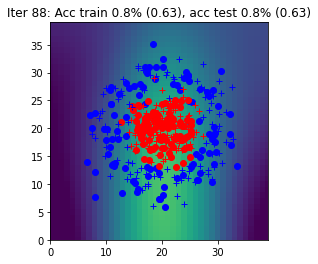

Iter 89: Acc train 0.8% (0.63), acc test 0.8% (0.63)


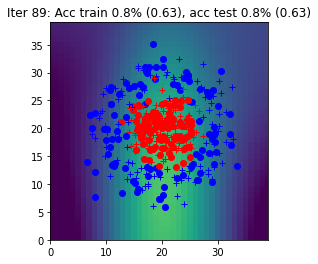

Iter 90: Acc train 0.8% (0.62), acc test 0.8% (0.63)


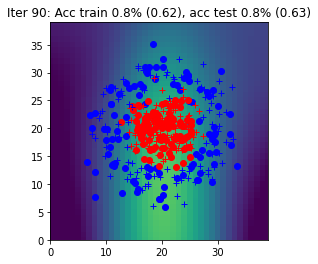

Iter 91: Acc train 0.8% (0.62), acc test 0.8% (0.62)


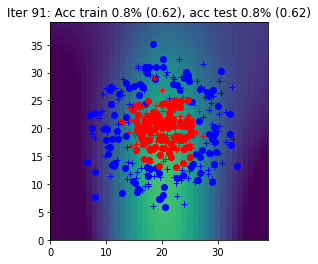

Iter 92: Acc train 0.8% (0.62), acc test 0.8% (0.62)


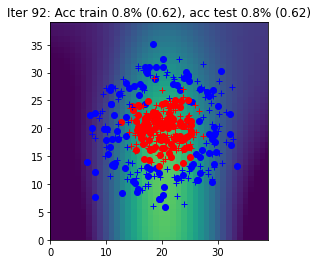

Iter 93: Acc train 0.8% (0.61), acc test 0.8% (0.62)


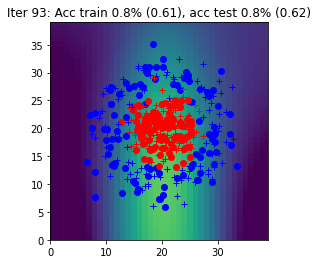

Iter 94: Acc train 0.8% (0.61), acc test 0.8% (0.61)


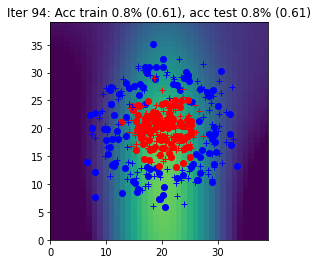

Iter 95: Acc train 0.8% (0.61), acc test 0.8% (0.61)


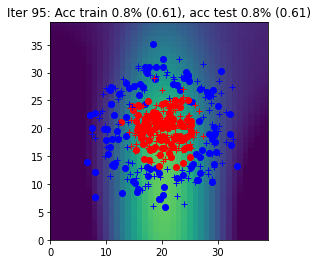

Iter 96: Acc train 0.8% (0.60), acc test 0.8% (0.60)


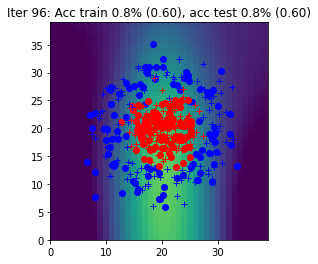

Iter 97: Acc train 0.8% (0.60), acc test 0.8% (0.60)


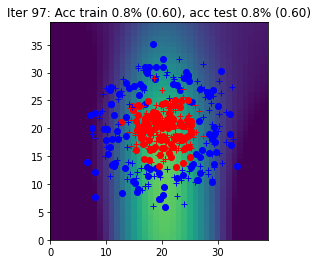

Iter 98: Acc train 0.8% (0.60), acc test 0.8% (0.60)


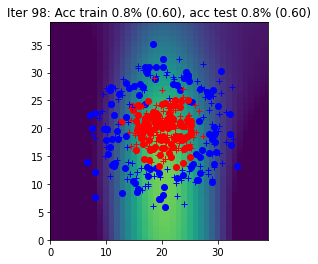

Iter 99: Acc train 0.8% (0.59), acc test 0.8% (0.59)


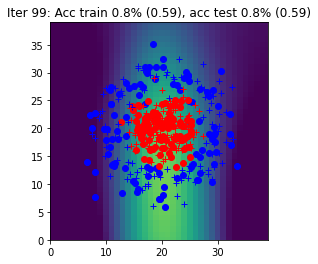

Iter 100: Acc train 0.8% (0.59), acc test 0.8% (0.59)


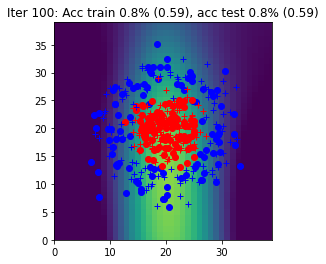

Iter 101: Acc train 0.8% (0.58), acc test 0.8% (0.59)


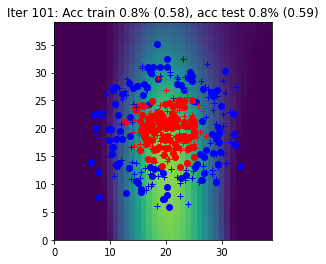

Iter 102: Acc train 0.8% (0.58), acc test 0.8% (0.58)


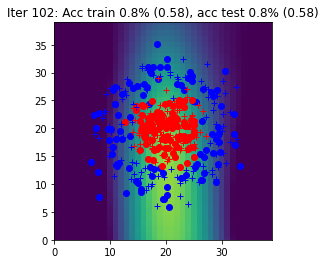

Iter 103: Acc train 0.8% (0.58), acc test 0.8% (0.58)


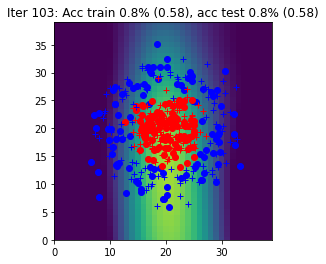

Iter 104: Acc train 0.8% (0.57), acc test 0.8% (0.58)


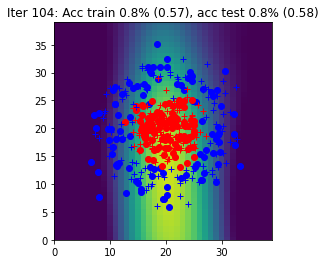

Iter 105: Acc train 0.8% (0.57), acc test 0.8% (0.57)


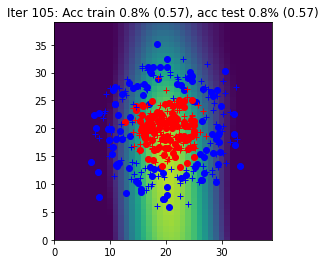

Iter 106: Acc train 0.8% (0.57), acc test 0.8% (0.57)


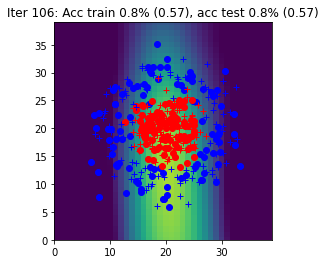

Iter 107: Acc train 0.8% (0.56), acc test 0.8% (0.56)


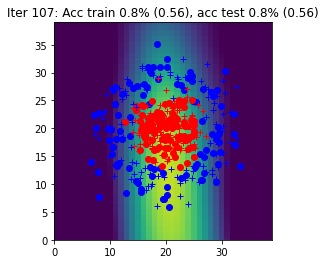

Iter 108: Acc train 0.8% (0.56), acc test 0.8% (0.56)


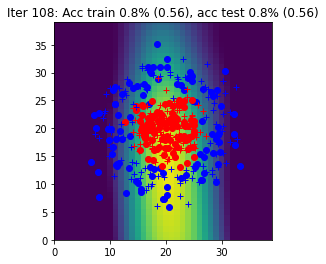

Iter 109: Acc train 0.8% (0.55), acc test 0.8% (0.56)


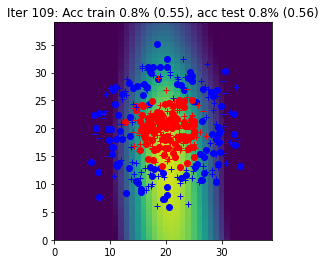

Iter 110: Acc train 0.8% (0.55), acc test 0.8% (0.55)


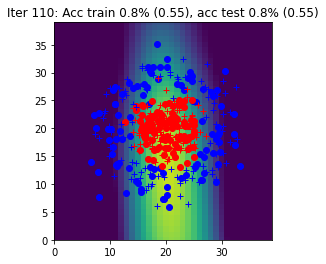

Iter 111: Acc train 0.8% (0.55), acc test 0.8% (0.55)


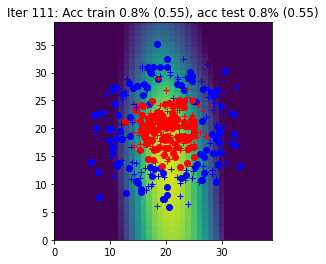

Iter 112: Acc train 0.8% (0.54), acc test 0.8% (0.55)


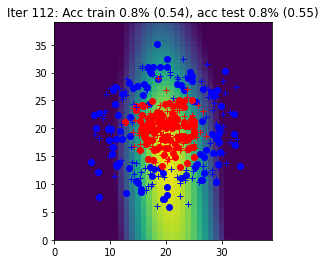

Iter 113: Acc train 0.8% (0.54), acc test 0.8% (0.54)


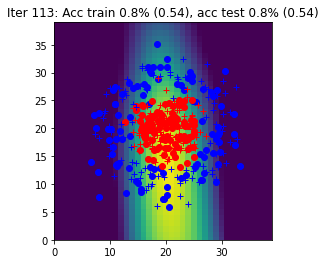

Iter 114: Acc train 0.8% (0.54), acc test 0.8% (0.54)


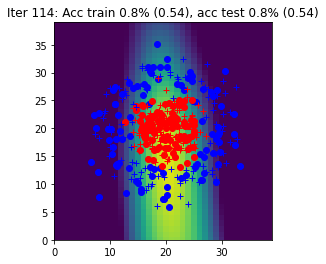

Iter 115: Acc train 0.8% (0.53), acc test 0.8% (0.54)


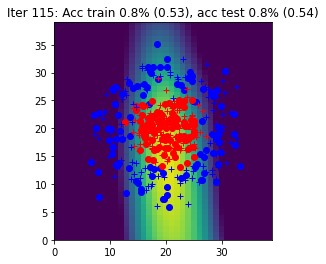

Iter 116: Acc train 0.8% (0.53), acc test 0.8% (0.53)


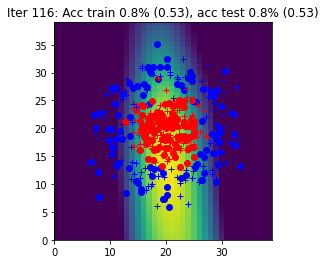

Iter 117: Acc train 0.8% (0.52), acc test 0.8% (0.53)


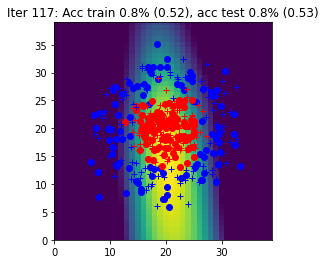

Iter 118: Acc train 0.8% (0.52), acc test 0.8% (0.53)


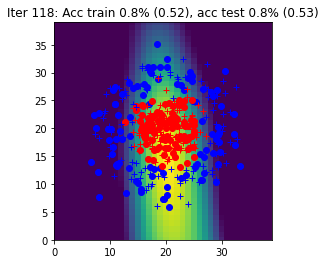

Iter 119: Acc train 0.8% (0.52), acc test 0.8% (0.52)


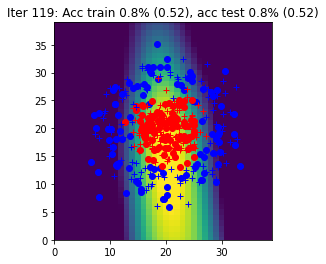

Iter 120: Acc train 0.9% (0.51), acc test 0.8% (0.52)


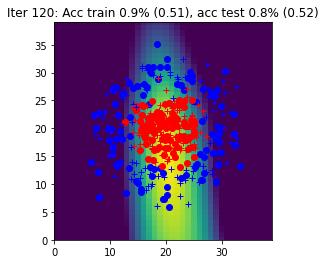

Iter 121: Acc train 0.8% (0.51), acc test 0.8% (0.52)


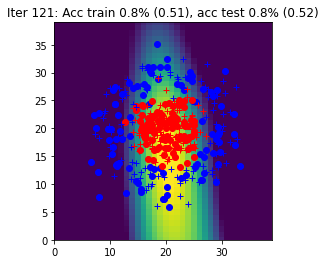

Iter 122: Acc train 0.8% (0.51), acc test 0.8% (0.51)


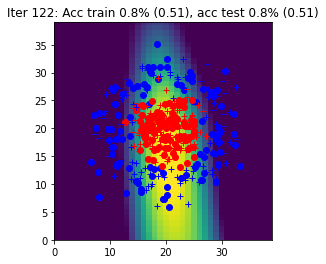

Iter 123: Acc train 0.8% (0.50), acc test 0.8% (0.51)


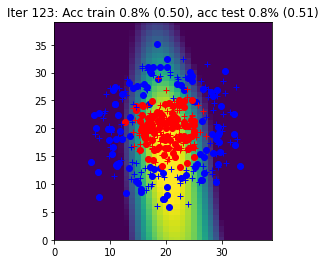

Iter 124: Acc train 0.8% (0.50), acc test 0.8% (0.51)


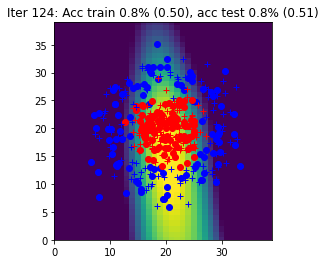

Iter 125: Acc train 0.8% (0.50), acc test 0.8% (0.50)


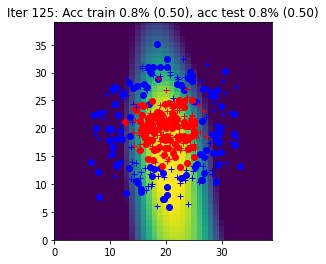

Iter 126: Acc train 0.8% (0.49), acc test 0.8% (0.50)


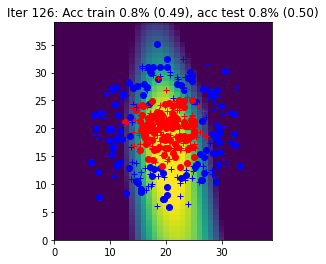

Iter 127: Acc train 0.8% (0.49), acc test 0.8% (0.50)


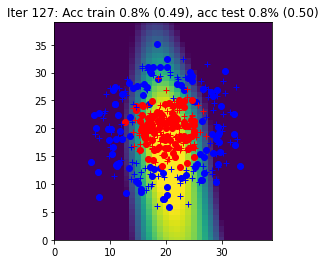

Iter 128: Acc train 0.8% (0.49), acc test 0.8% (0.49)


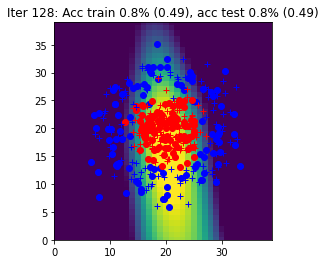

Iter 129: Acc train 0.8% (0.48), acc test 0.8% (0.49)


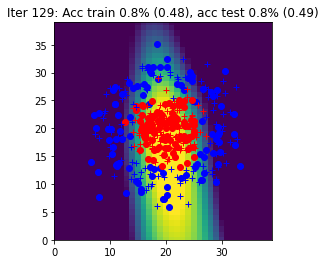

Iter 130: Acc train 0.8% (0.48), acc test 0.8% (0.49)


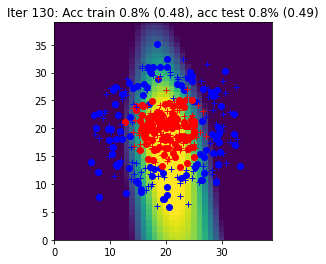

Iter 131: Acc train 0.8% (0.48), acc test 0.8% (0.48)


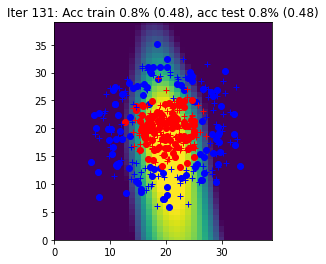

Iter 132: Acc train 0.8% (0.47), acc test 0.8% (0.48)


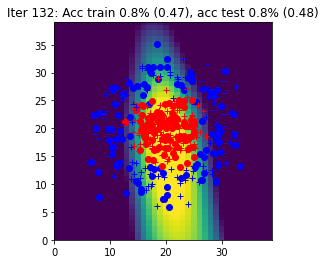

Iter 133: Acc train 0.8% (0.47), acc test 0.8% (0.48)


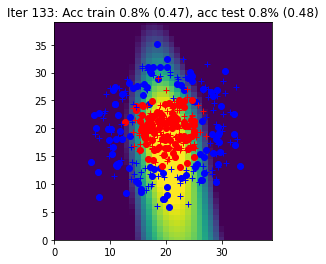

Iter 134: Acc train 0.9% (0.47), acc test 0.8% (0.48)


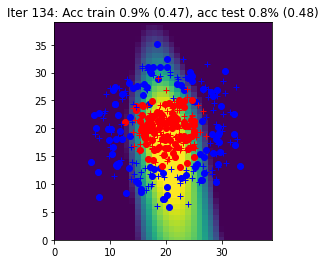

Iter 135: Acc train 0.9% (0.46), acc test 0.8% (0.47)


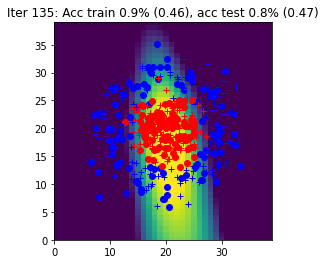

Iter 136: Acc train 0.8% (0.46), acc test 0.8% (0.47)


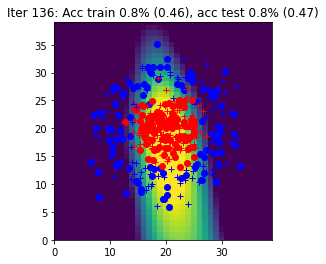

Iter 137: Acc train 0.9% (0.46), acc test 0.8% (0.47)


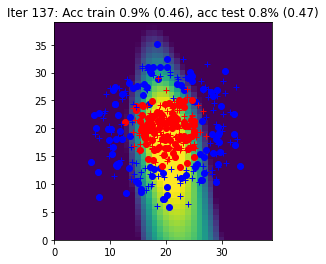

Iter 138: Acc train 0.9% (0.45), acc test 0.8% (0.46)


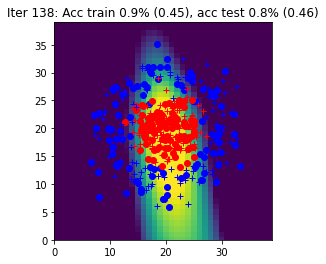

Iter 139: Acc train 0.9% (0.45), acc test 0.8% (0.46)


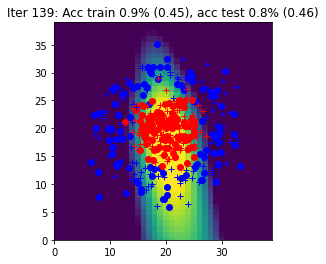

Iter 140: Acc train 0.9% (0.44), acc test 0.8% (0.46)


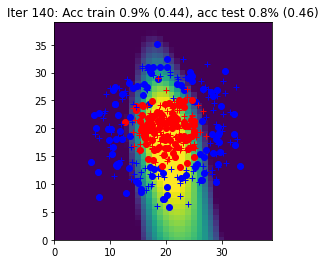

Iter 141: Acc train 0.9% (0.44), acc test 0.8% (0.45)


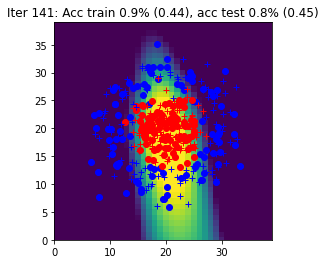

Iter 142: Acc train 0.8% (0.44), acc test 0.8% (0.45)


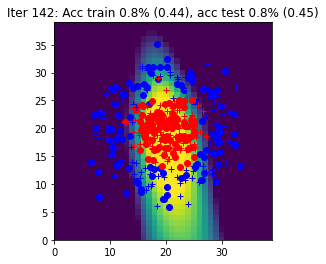

Iter 143: Acc train 0.9% (0.43), acc test 0.8% (0.45)


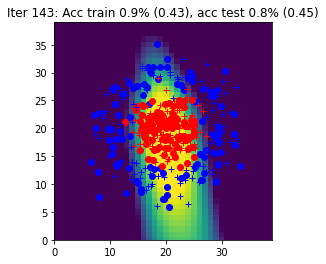

Iter 144: Acc train 0.9% (0.43), acc test 0.8% (0.44)


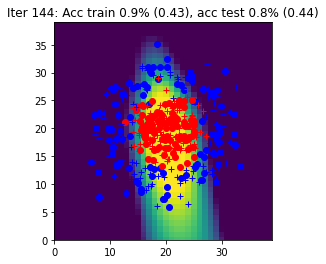

Iter 145: Acc train 0.9% (0.43), acc test 0.8% (0.44)


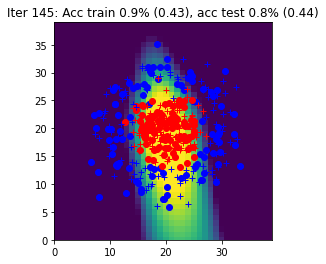

Iter 146: Acc train 0.9% (0.42), acc test 0.8% (0.44)


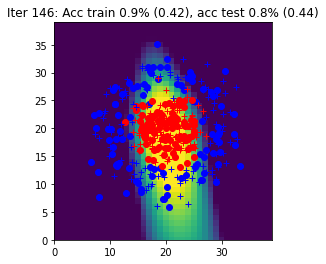

Iter 147: Acc train 0.9% (0.42), acc test 0.8% (0.43)


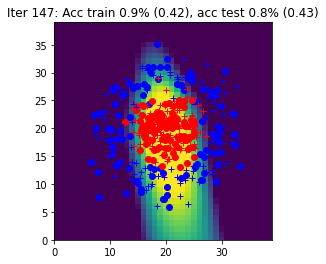

Iter 148: Acc train 0.9% (0.41), acc test 0.8% (0.43)


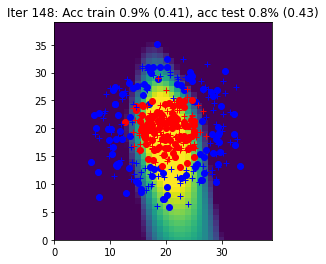

Iter 149: Acc train 0.9% (0.41), acc test 0.8% (0.43)


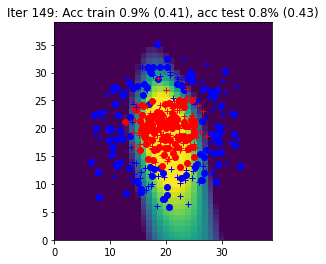

Finished after 26.4056613445282 seconds 


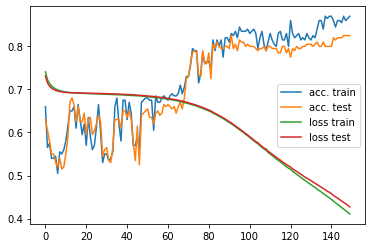

In [13]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

tic = time()

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, sgd
        # and the backward function with autograd
        
        # pass batch forward
        Yhat , outputs = forward(params, X)
        
        # batch loss  
        loss , accuracy = loss_accuracy(Yhat, Y)
        
        # batch backward
        loss.backward()
        
        # descent gradient
        params = sgd(params, eta)
        
    with torch.no_grad():
        Yhat_train, _ = forward(params, data.Xtrain)
        Yhat_test, _ = forward(params, data.Xtest)
        Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
        Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
        Ygrid, _ = forward(params, data.Xgrid)

        title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
        print(title)
        # detach() is used to remove the predictions from the computational graph in autograd
        data.plot_data_with_grid(Ygrid.detach(), title)

        curves[0].append(acctrain)
        curves[1].append(acctest)
        curves[2].append(Ltrain)
        curves[3].append(Ltest)

toc = time()

print(f"Finished after {toc-tic} seconds ")
    
fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 3 : Simplification of the forward pass with `torch.nn`

`init_params` and `forward` are replaced by the `init_model` function which defines the network architecture and the loss.

In [14]:
def init_model(nx, nh, ny):

    model = torch.nn.Sequential(
        torch.nn.Linear(nx,nh),
        torch.nn.ReLU(),
        torch.nn.Linear(nh,ny),
        torch.nn.Sigmoid()
    )
    loss = torch.nn.CrossEntropyLoss()
    return model, loss

In [34]:
def loss_accuracy(loss, yhat, y):
    
    yhat_bis = torch.nn.Softmax(dim=0)(yhat)
    
    predictions_hat = torch.argmax(yhat_bis, dim=1)

    predictions = torch.argmax(y, dim=1)

    correct_predictions = (predictions_hat == predictions).sum().item()

    return loss(yhat,y), correct_predictions / len(y)

In [31]:
def sgd(model, eta):

    with torch.no_grad():
        for param in model.parameters():
            param -= eta * param.grad
        model.zero_grad()
        
    return model

## Global learning procedure with autograd and `torch.nn`

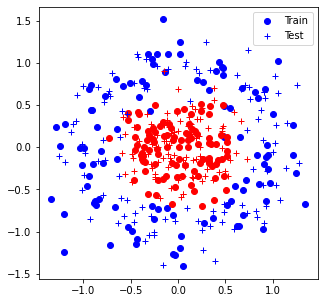

Iter 0: Acc train 0.6% (0.69), acc test 0.5% (0.69)


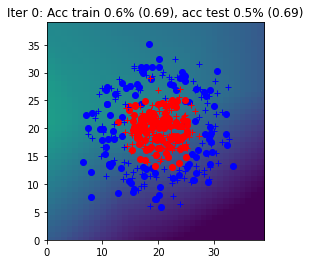

Iter 1: Acc train 0.6% (0.69), acc test 0.5% (0.69)


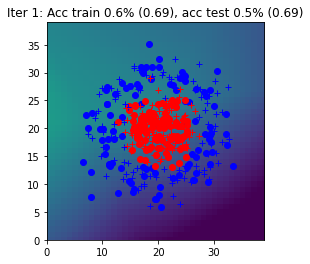

Iter 2: Acc train 0.6% (0.69), acc test 0.5% (0.69)


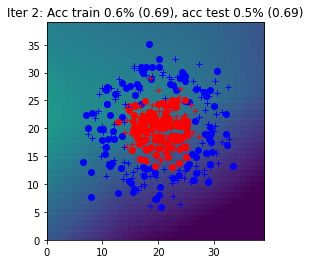

Iter 3: Acc train 0.6% (0.69), acc test 0.5% (0.69)


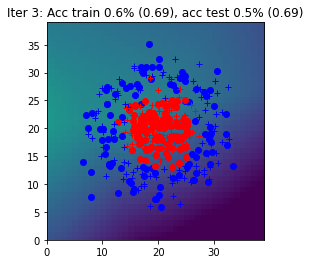

Iter 4: Acc train 0.6% (0.69), acc test 0.6% (0.69)


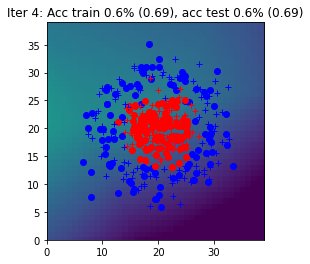

Iter 5: Acc train 0.6% (0.69), acc test 0.6% (0.69)


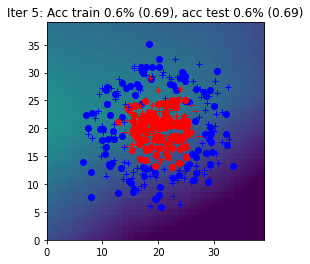

Iter 6: Acc train 0.6% (0.69), acc test 0.6% (0.69)


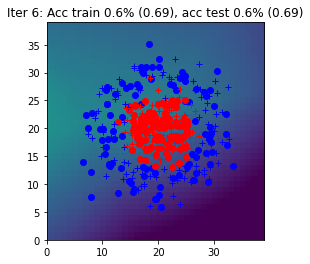

Iter 7: Acc train 0.6% (0.69), acc test 0.6% (0.69)


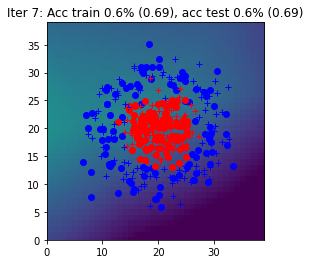

Iter 8: Acc train 0.6% (0.69), acc test 0.6% (0.68)


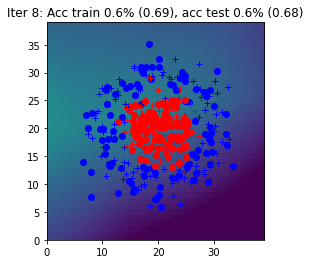

Iter 9: Acc train 0.6% (0.68), acc test 0.6% (0.68)


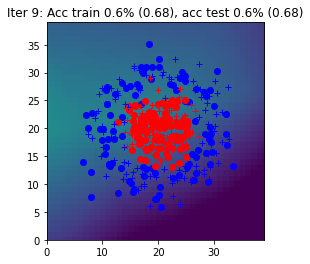

Iter 10: Acc train 0.6% (0.68), acc test 0.6% (0.68)


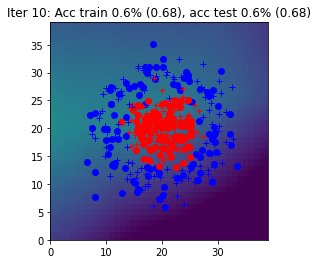

Iter 11: Acc train 0.6% (0.68), acc test 0.6% (0.68)


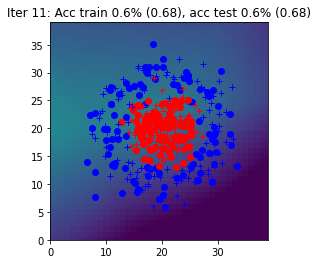

Iter 12: Acc train 0.6% (0.68), acc test 0.6% (0.68)


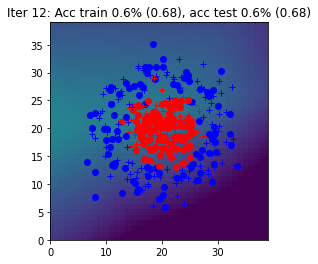

Iter 13: Acc train 0.6% (0.68), acc test 0.6% (0.68)


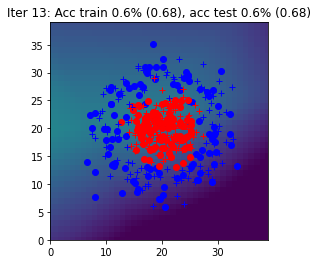

Iter 14: Acc train 0.6% (0.68), acc test 0.7% (0.68)


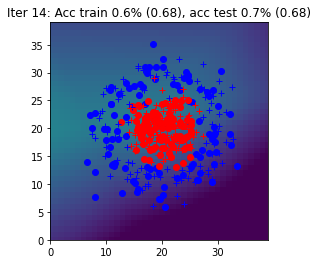

Iter 15: Acc train 0.7% (0.68), acc test 0.7% (0.68)


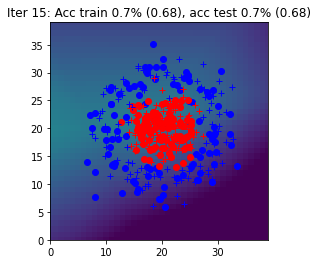

Iter 16: Acc train 0.7% (0.68), acc test 0.7% (0.68)


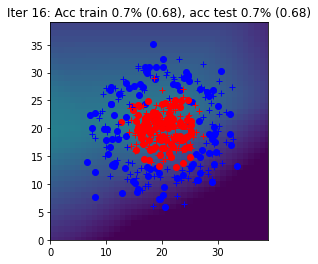

Iter 17: Acc train 0.7% (0.68), acc test 0.7% (0.68)


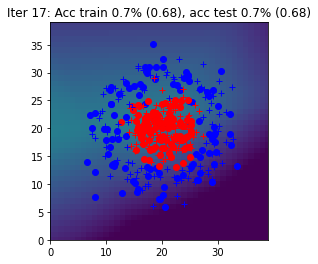

Iter 18: Acc train 0.7% (0.68), acc test 0.7% (0.68)


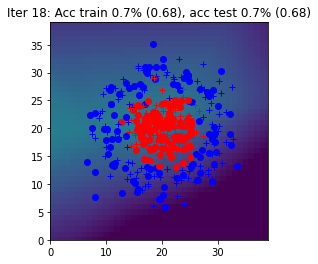

Iter 19: Acc train 0.7% (0.68), acc test 0.7% (0.68)


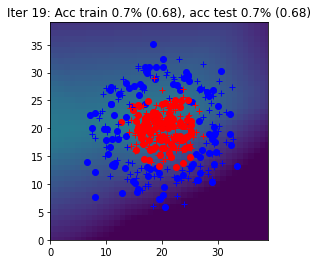

Iter 20: Acc train 0.8% (0.68), acc test 0.7% (0.68)


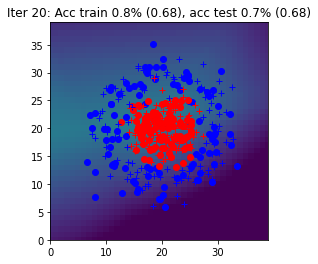

Iter 21: Acc train 0.8% (0.68), acc test 0.7% (0.68)


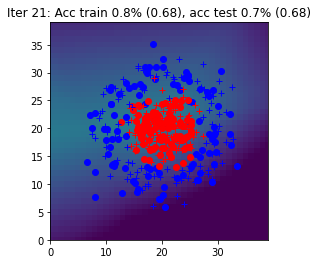

Iter 22: Acc train 0.8% (0.68), acc test 0.7% (0.68)


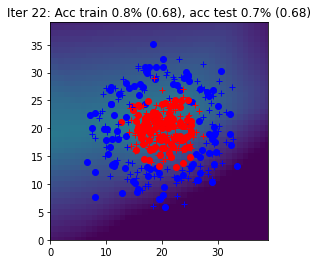

Iter 23: Acc train 0.8% (0.68), acc test 0.7% (0.67)


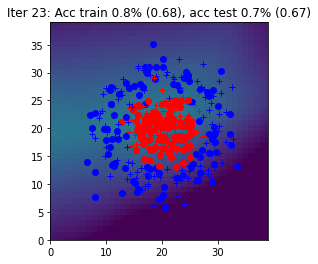

Iter 24: Acc train 0.8% (0.67), acc test 0.7% (0.67)


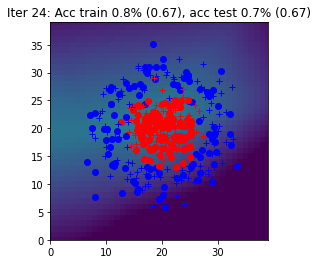

Iter 25: Acc train 0.8% (0.67), acc test 0.8% (0.67)


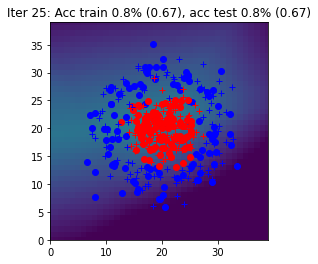

Iter 26: Acc train 0.8% (0.67), acc test 0.8% (0.67)


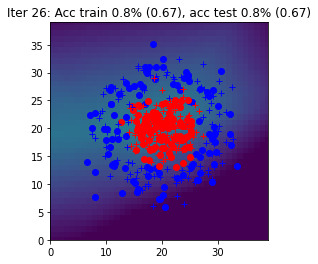

Iter 27: Acc train 0.8% (0.67), acc test 0.8% (0.67)


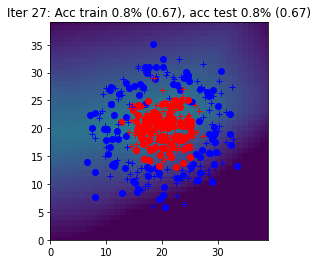

Iter 28: Acc train 0.8% (0.67), acc test 0.8% (0.67)


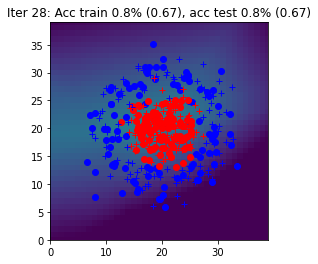

Iter 29: Acc train 0.8% (0.67), acc test 0.8% (0.67)


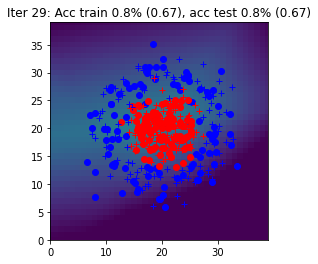

Iter 30: Acc train 0.8% (0.67), acc test 0.8% (0.67)


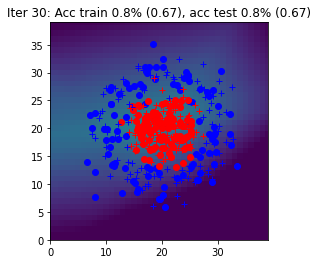

Iter 31: Acc train 0.8% (0.67), acc test 0.8% (0.67)


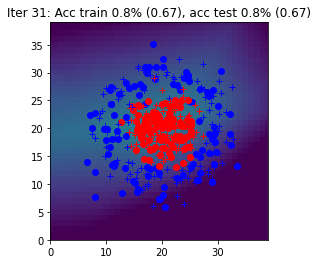

Iter 32: Acc train 0.8% (0.67), acc test 0.8% (0.67)


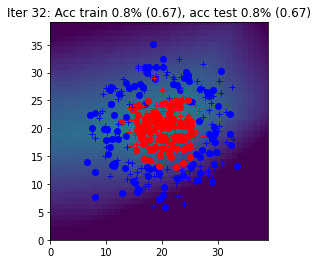

Iter 33: Acc train 0.8% (0.67), acc test 0.8% (0.67)


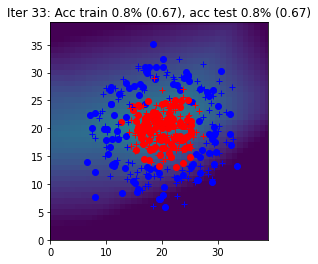

Iter 34: Acc train 0.8% (0.67), acc test 0.8% (0.67)


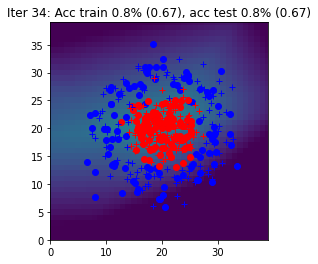

Iter 35: Acc train 0.8% (0.67), acc test 0.8% (0.67)


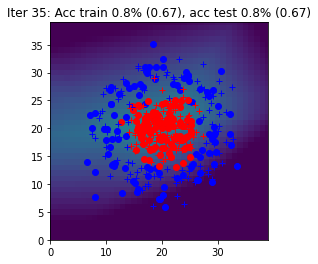

Iter 36: Acc train 0.8% (0.66), acc test 0.8% (0.66)


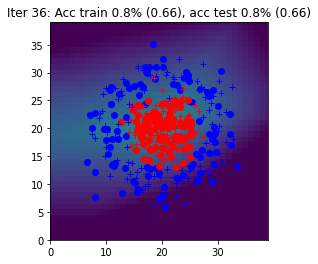

Iter 37: Acc train 0.8% (0.66), acc test 0.8% (0.66)


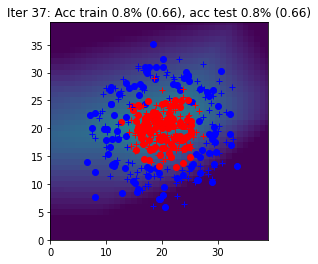

Iter 38: Acc train 0.8% (0.66), acc test 0.8% (0.66)


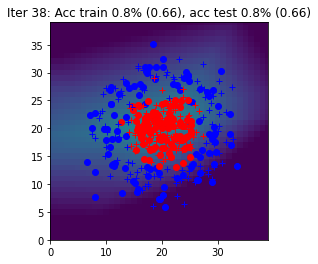

Iter 39: Acc train 0.8% (0.66), acc test 0.8% (0.66)


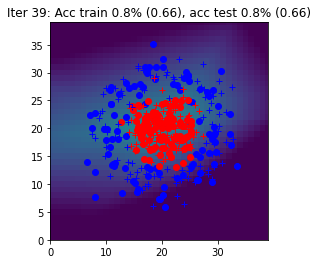

Iter 40: Acc train 0.8% (0.66), acc test 0.8% (0.66)


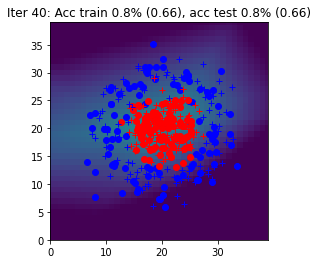

Iter 41: Acc train 0.8% (0.66), acc test 0.8% (0.66)


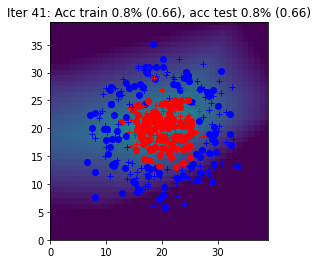

Iter 42: Acc train 0.8% (0.66), acc test 0.8% (0.66)


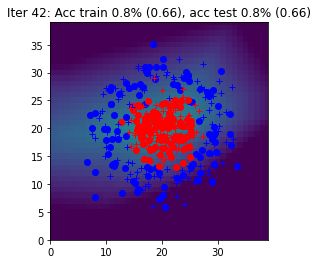

Iter 43: Acc train 0.8% (0.66), acc test 0.8% (0.66)


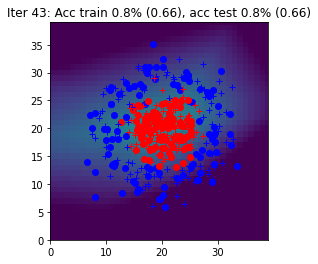

Iter 44: Acc train 0.8% (0.66), acc test 0.8% (0.66)


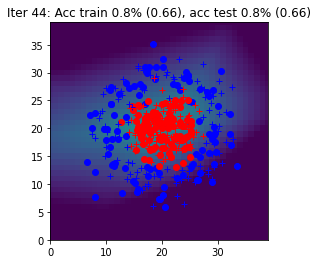

Iter 45: Acc train 0.8% (0.66), acc test 0.8% (0.66)


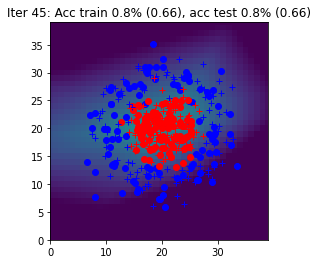

Iter 46: Acc train 0.8% (0.65), acc test 0.8% (0.65)


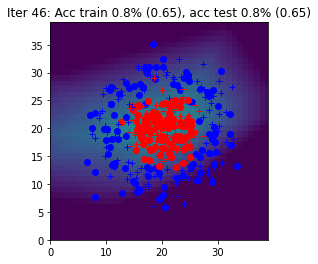

Iter 47: Acc train 0.8% (0.65), acc test 0.8% (0.65)


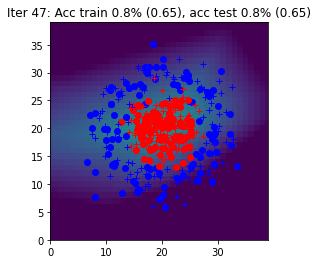

Iter 48: Acc train 0.8% (0.65), acc test 0.8% (0.65)


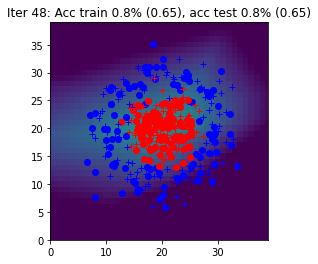

Iter 49: Acc train 0.8% (0.65), acc test 0.8% (0.65)


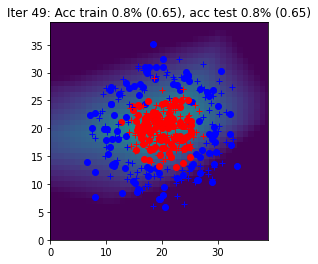

Iter 50: Acc train 0.8% (0.65), acc test 0.9% (0.65)


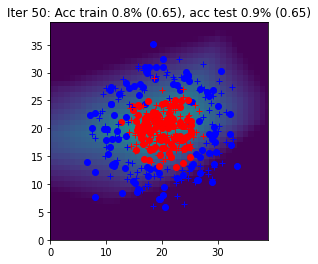

Iter 51: Acc train 0.8% (0.65), acc test 0.9% (0.65)


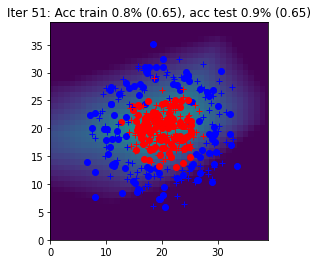

Iter 52: Acc train 0.8% (0.65), acc test 0.9% (0.65)


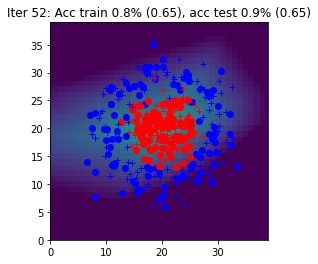

Iter 53: Acc train 0.8% (0.65), acc test 0.9% (0.65)


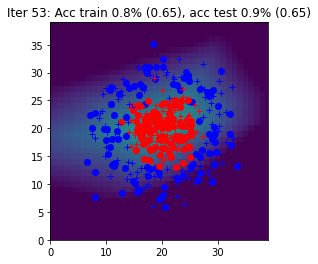

Iter 54: Acc train 0.8% (0.65), acc test 0.9% (0.65)


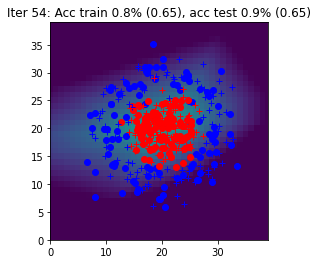

Iter 55: Acc train 0.8% (0.64), acc test 0.9% (0.64)


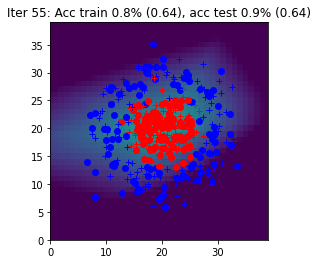

Iter 56: Acc train 0.8% (0.64), acc test 0.9% (0.64)


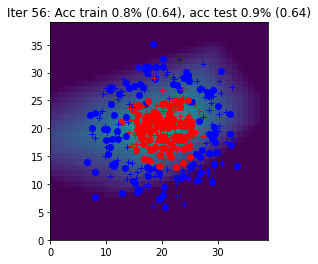

Iter 57: Acc train 0.9% (0.64), acc test 0.9% (0.64)


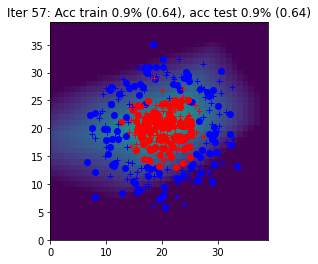

Iter 58: Acc train 0.9% (0.64), acc test 0.9% (0.64)


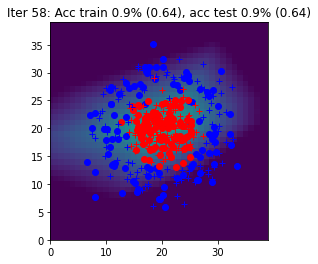

Iter 59: Acc train 0.9% (0.64), acc test 0.9% (0.64)


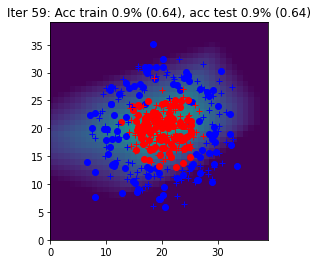

Iter 60: Acc train 0.9% (0.64), acc test 0.9% (0.64)


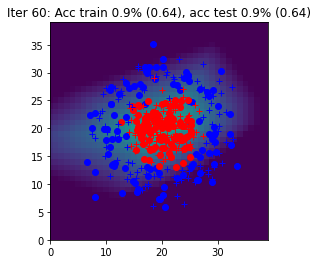

Iter 61: Acc train 0.9% (0.64), acc test 0.9% (0.64)


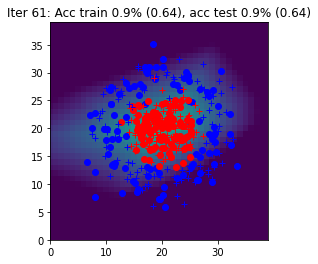

Iter 62: Acc train 0.9% (0.64), acc test 0.9% (0.64)


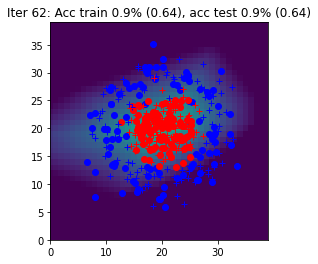

Iter 63: Acc train 0.9% (0.63), acc test 0.9% (0.63)


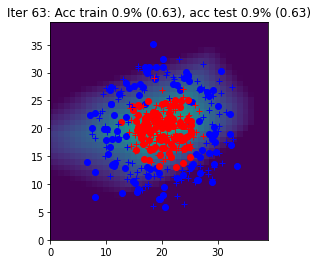

Iter 64: Acc train 0.9% (0.63), acc test 0.9% (0.63)


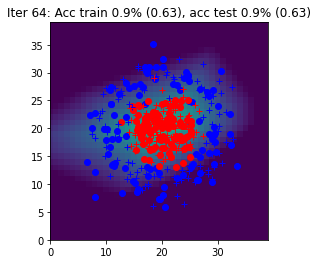

Iter 65: Acc train 0.9% (0.63), acc test 0.9% (0.63)


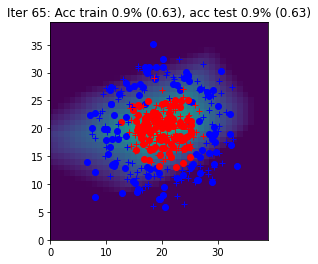

Iter 66: Acc train 0.9% (0.63), acc test 0.9% (0.63)


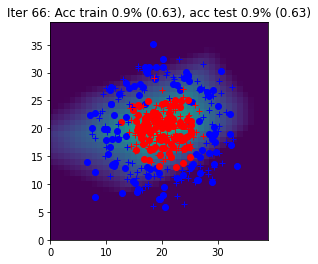

Iter 67: Acc train 0.9% (0.63), acc test 0.9% (0.63)


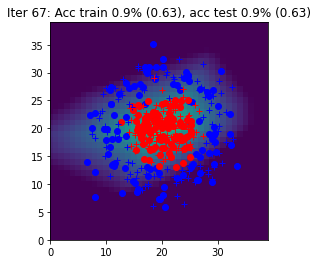

Iter 68: Acc train 0.9% (0.63), acc test 0.9% (0.63)


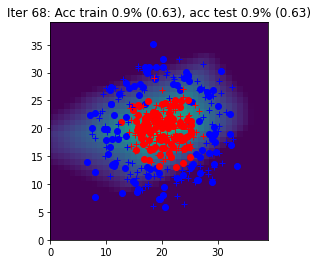

Iter 69: Acc train 0.9% (0.63), acc test 0.9% (0.63)


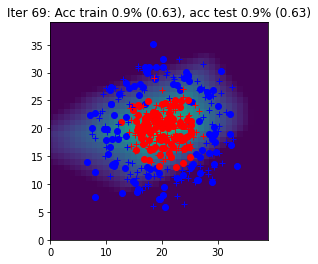

Iter 70: Acc train 0.9% (0.63), acc test 0.9% (0.62)


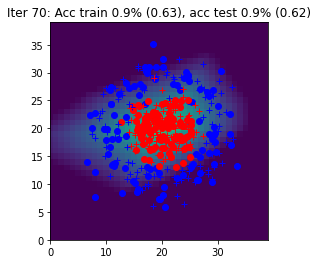

Iter 71: Acc train 0.9% (0.62), acc test 0.9% (0.62)


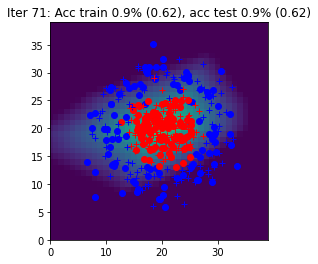

Iter 72: Acc train 0.9% (0.62), acc test 0.9% (0.62)


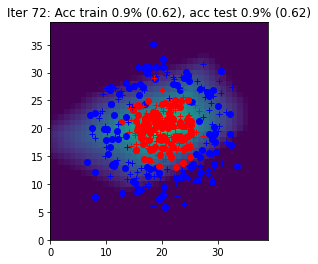

Iter 73: Acc train 0.9% (0.62), acc test 0.9% (0.62)


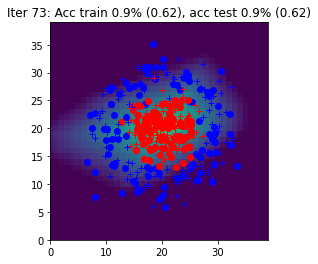

Iter 74: Acc train 0.9% (0.62), acc test 0.9% (0.62)


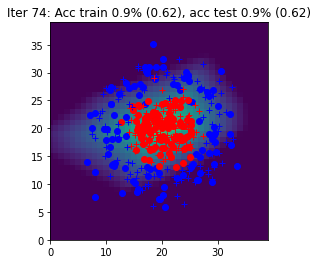

Iter 75: Acc train 0.9% (0.62), acc test 0.9% (0.62)


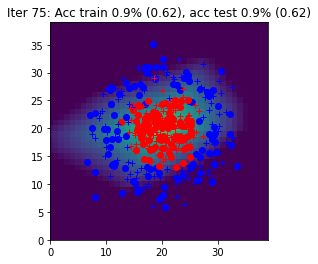

Iter 76: Acc train 0.9% (0.62), acc test 0.9% (0.62)


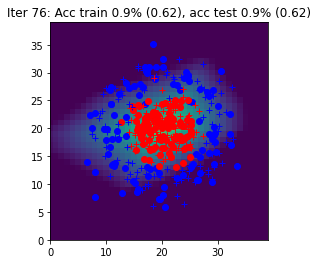

Iter 77: Acc train 0.9% (0.62), acc test 0.9% (0.62)


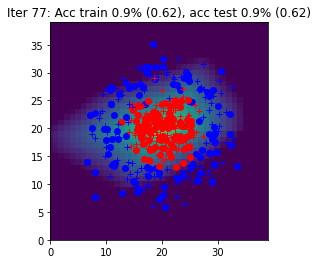

Iter 78: Acc train 0.9% (0.62), acc test 0.9% (0.61)


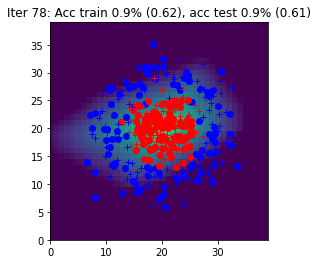

Iter 79: Acc train 0.9% (0.61), acc test 0.9% (0.61)


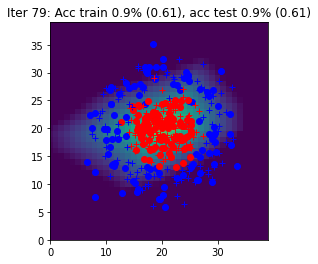

Iter 80: Acc train 0.9% (0.61), acc test 0.9% (0.61)


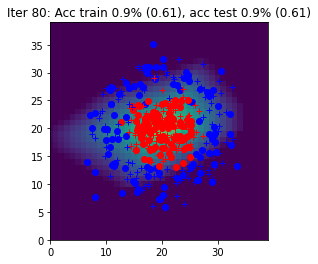

Iter 81: Acc train 0.9% (0.61), acc test 0.9% (0.61)


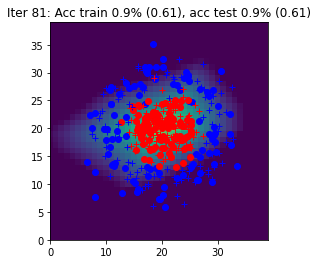

Iter 82: Acc train 0.9% (0.61), acc test 0.9% (0.61)


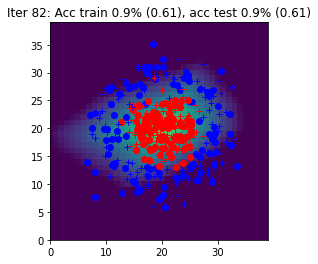

Iter 83: Acc train 0.9% (0.61), acc test 0.9% (0.61)


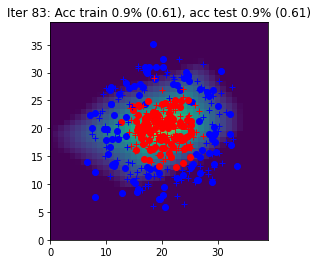

Iter 84: Acc train 0.9% (0.61), acc test 0.9% (0.61)


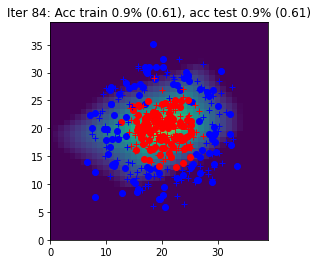

Iter 85: Acc train 0.9% (0.61), acc test 0.9% (0.60)


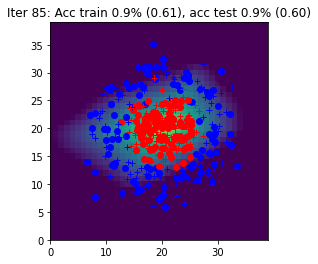

Iter 86: Acc train 0.9% (0.60), acc test 0.9% (0.60)


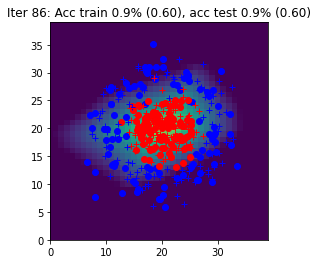

Iter 87: Acc train 0.9% (0.60), acc test 0.9% (0.60)


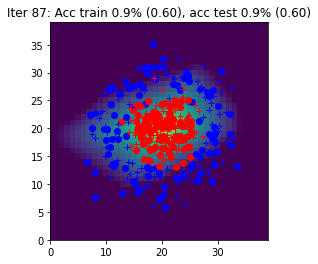

Iter 88: Acc train 0.9% (0.60), acc test 0.9% (0.60)


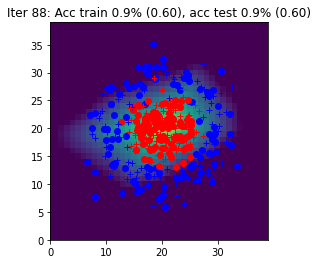

Iter 89: Acc train 0.9% (0.60), acc test 0.9% (0.60)


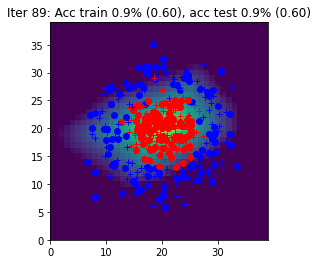

Iter 90: Acc train 0.9% (0.60), acc test 0.9% (0.60)


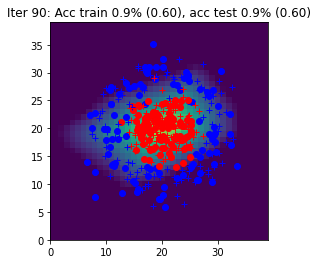

Iter 91: Acc train 0.9% (0.60), acc test 0.9% (0.59)


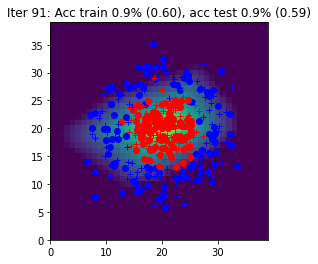

Iter 92: Acc train 0.9% (0.59), acc test 0.9% (0.59)


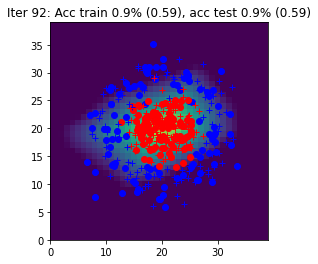

Iter 93: Acc train 0.9% (0.59), acc test 0.9% (0.59)


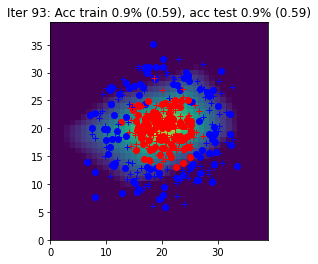

Iter 94: Acc train 0.9% (0.59), acc test 0.9% (0.59)


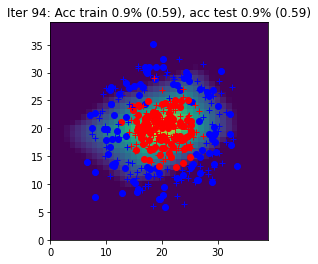

Iter 95: Acc train 0.9% (0.59), acc test 0.9% (0.59)


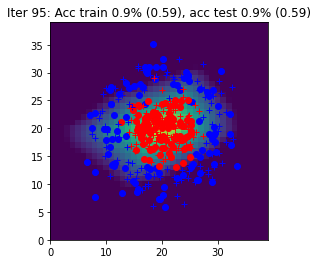

Iter 96: Acc train 0.9% (0.59), acc test 0.9% (0.59)


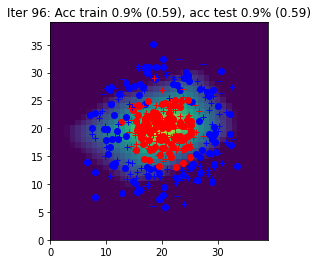

Iter 97: Acc train 0.9% (0.59), acc test 0.9% (0.59)


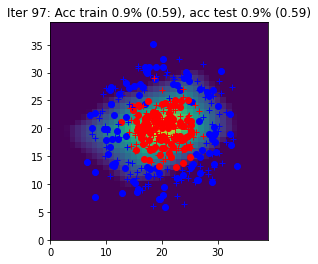

Iter 98: Acc train 0.9% (0.59), acc test 0.9% (0.58)


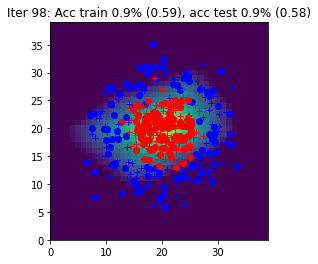

Iter 99: Acc train 0.9% (0.58), acc test 0.9% (0.58)


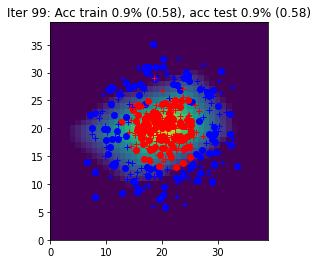

Iter 100: Acc train 0.9% (0.58), acc test 0.9% (0.58)


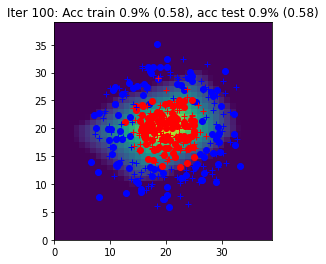

Iter 101: Acc train 0.9% (0.58), acc test 0.9% (0.58)


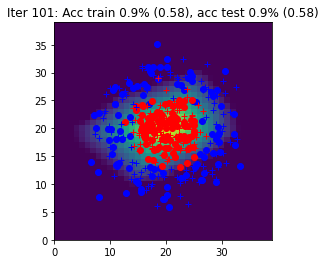

Iter 102: Acc train 0.9% (0.58), acc test 0.9% (0.58)


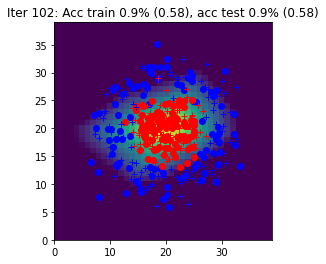

Iter 103: Acc train 0.9% (0.58), acc test 0.9% (0.58)


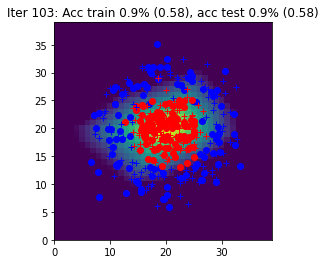

Iter 104: Acc train 0.9% (0.58), acc test 0.9% (0.57)


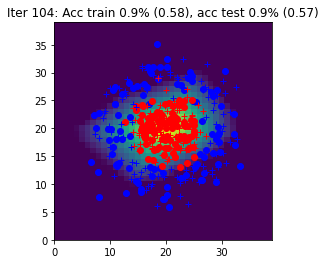

Iter 105: Acc train 0.9% (0.58), acc test 0.9% (0.57)


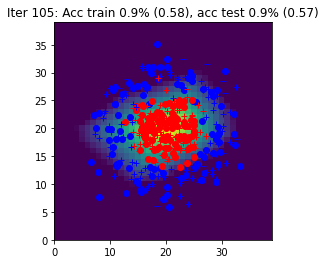

Iter 106: Acc train 0.9% (0.57), acc test 0.9% (0.57)


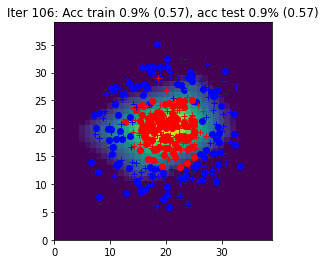

Iter 107: Acc train 0.9% (0.57), acc test 0.9% (0.57)


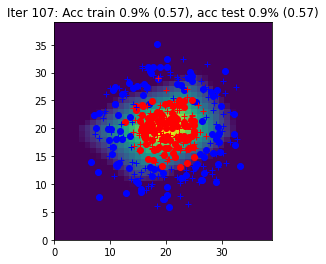

Iter 108: Acc train 0.9% (0.57), acc test 0.9% (0.57)


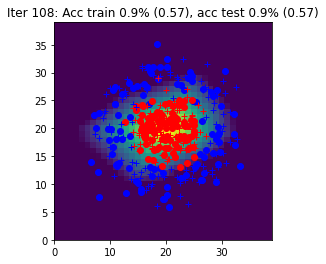

Iter 109: Acc train 0.9% (0.57), acc test 0.9% (0.57)


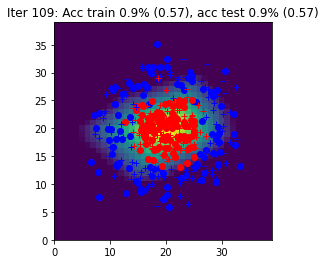

Iter 110: Acc train 0.9% (0.57), acc test 0.9% (0.57)


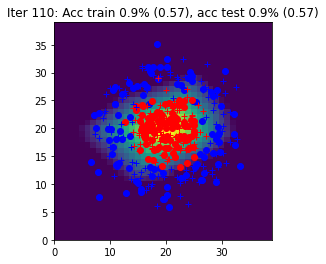

Iter 111: Acc train 0.9% (0.57), acc test 0.9% (0.56)


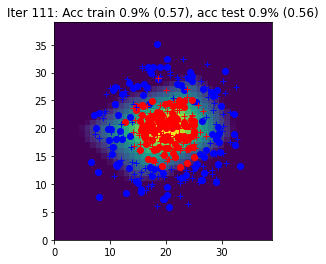

Iter 112: Acc train 0.9% (0.56), acc test 0.9% (0.56)


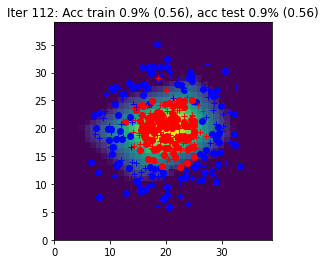

Iter 113: Acc train 0.9% (0.56), acc test 0.9% (0.56)


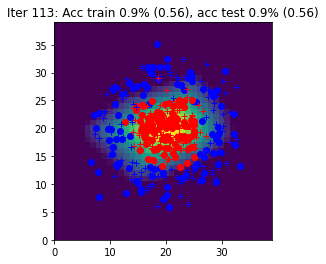

Iter 114: Acc train 0.9% (0.56), acc test 0.9% (0.56)


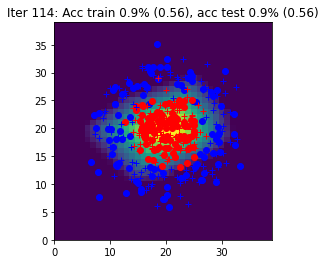

Iter 115: Acc train 0.9% (0.56), acc test 0.9% (0.56)


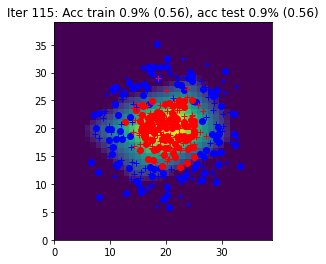

Iter 116: Acc train 0.9% (0.56), acc test 0.9% (0.56)


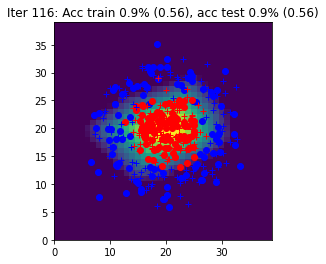

Iter 117: Acc train 0.9% (0.56), acc test 0.9% (0.55)


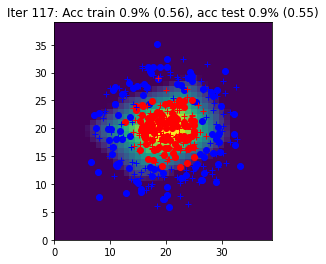

Iter 118: Acc train 0.9% (0.56), acc test 1.0% (0.55)


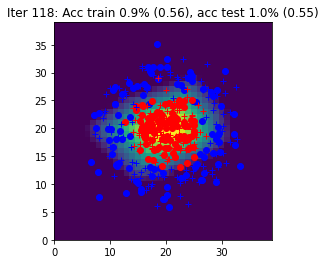

Iter 119: Acc train 0.9% (0.55), acc test 1.0% (0.55)


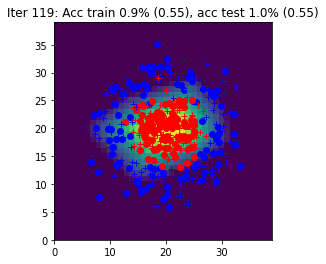

Iter 120: Acc train 0.9% (0.55), acc test 1.0% (0.55)


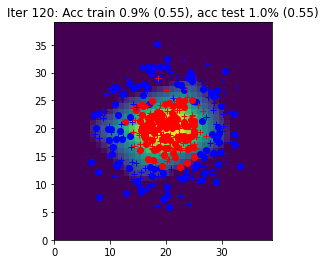

Iter 121: Acc train 0.9% (0.55), acc test 1.0% (0.55)


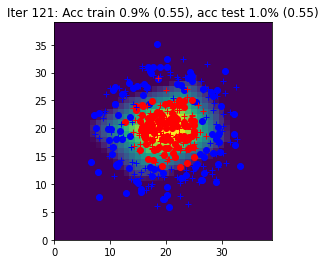

Iter 122: Acc train 0.9% (0.55), acc test 1.0% (0.55)


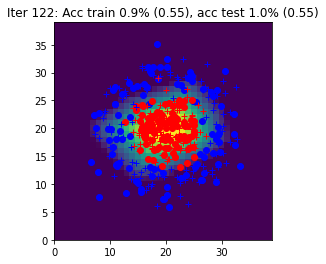

Iter 123: Acc train 0.9% (0.55), acc test 1.0% (0.55)


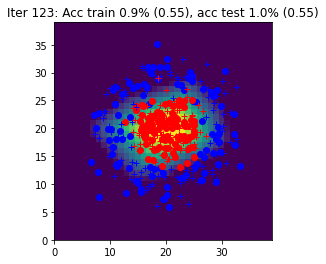

Iter 124: Acc train 0.9% (0.55), acc test 1.0% (0.54)


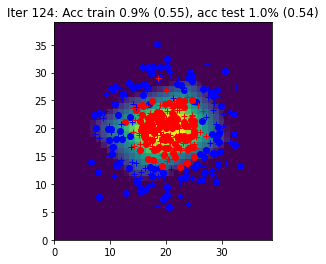

Iter 125: Acc train 0.9% (0.54), acc test 1.0% (0.54)


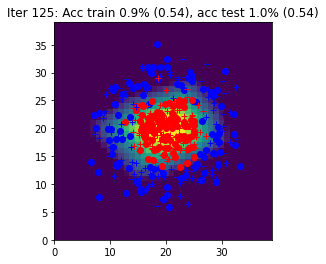

Iter 126: Acc train 0.9% (0.54), acc test 1.0% (0.54)


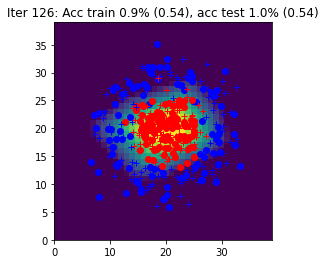

Iter 127: Acc train 0.9% (0.54), acc test 1.0% (0.54)


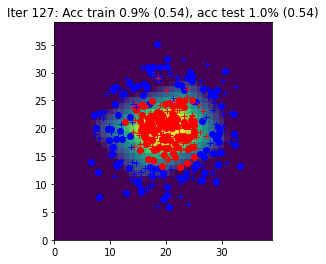

Iter 128: Acc train 0.9% (0.54), acc test 1.0% (0.54)


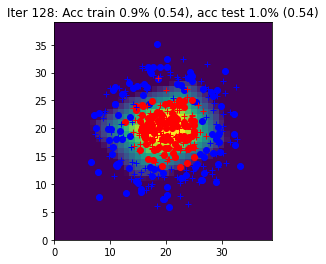

Iter 129: Acc train 0.9% (0.54), acc test 1.0% (0.54)


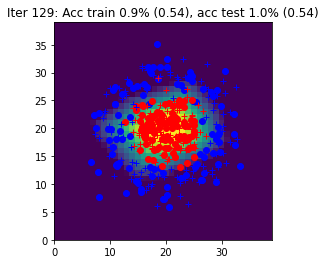

Iter 130: Acc train 0.9% (0.54), acc test 0.9% (0.54)


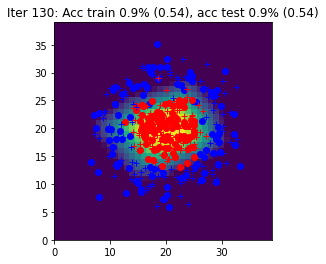

Iter 131: Acc train 0.9% (0.54), acc test 0.9% (0.53)


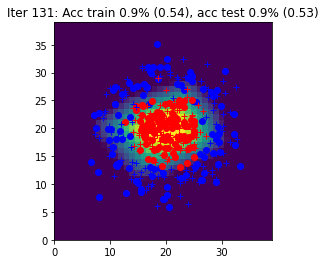

Iter 132: Acc train 0.9% (0.53), acc test 0.9% (0.53)


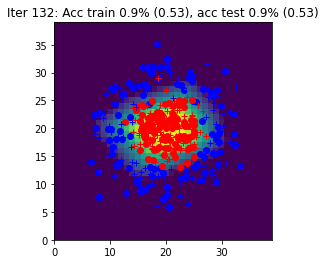

Iter 133: Acc train 0.9% (0.53), acc test 0.9% (0.53)


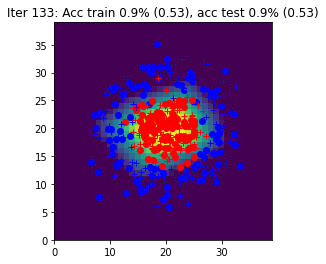

Iter 134: Acc train 0.9% (0.53), acc test 0.9% (0.53)


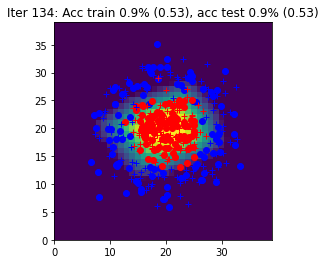

Iter 135: Acc train 0.9% (0.53), acc test 0.9% (0.53)


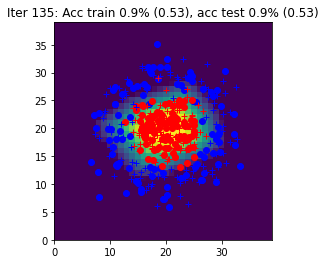

Iter 136: Acc train 0.9% (0.53), acc test 0.9% (0.53)


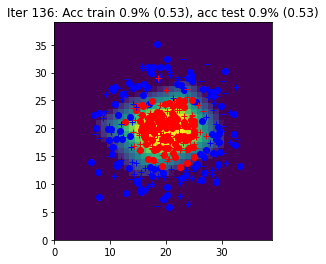

Iter 137: Acc train 0.9% (0.53), acc test 0.9% (0.52)


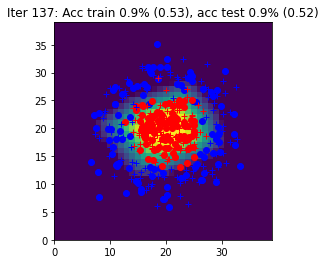

Iter 138: Acc train 0.9% (0.53), acc test 0.9% (0.52)


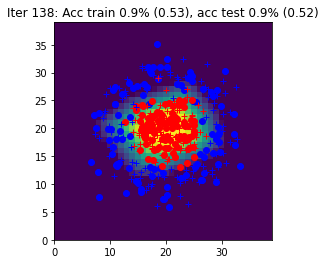

Iter 139: Acc train 0.9% (0.52), acc test 0.9% (0.52)


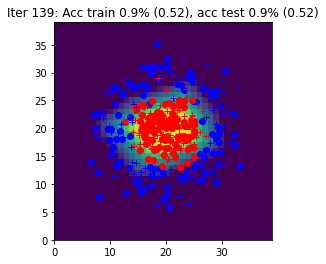

Iter 140: Acc train 0.9% (0.52), acc test 0.9% (0.52)


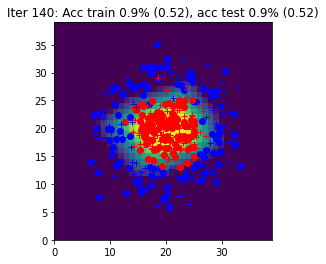

Iter 141: Acc train 0.9% (0.52), acc test 0.9% (0.52)


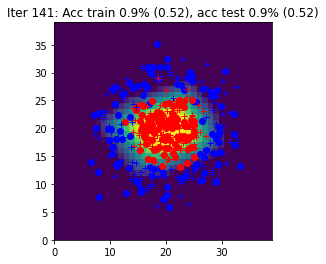

Iter 142: Acc train 0.9% (0.52), acc test 0.9% (0.52)


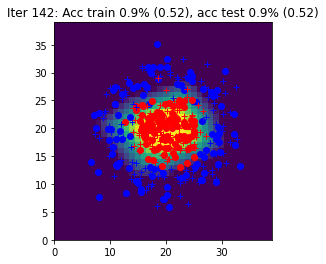

Iter 143: Acc train 0.9% (0.52), acc test 0.9% (0.52)


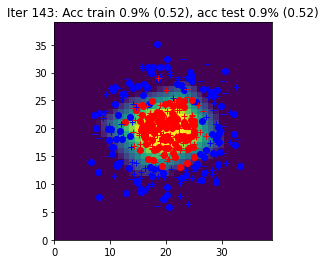

Iter 144: Acc train 0.9% (0.52), acc test 0.9% (0.52)


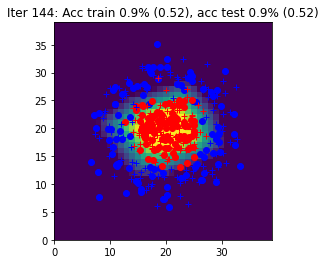

Iter 145: Acc train 0.9% (0.52), acc test 0.9% (0.51)


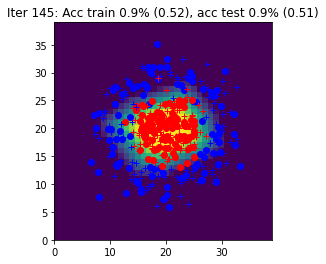

Iter 146: Acc train 0.9% (0.51), acc test 0.9% (0.51)


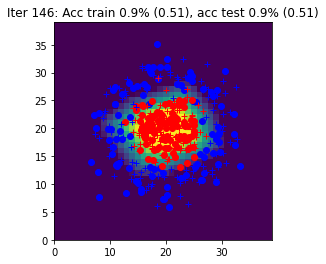

Iter 147: Acc train 0.9% (0.51), acc test 0.9% (0.51)


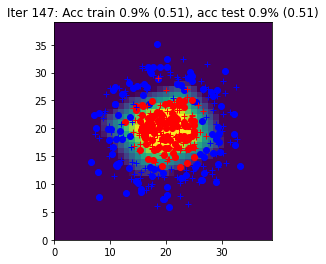

Iter 148: Acc train 0.9% (0.51), acc test 0.9% (0.51)


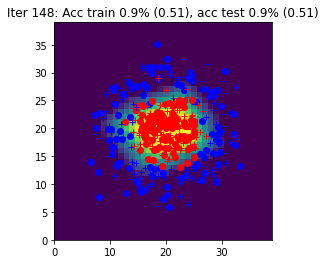

Iter 149: Acc train 0.9% (0.51), acc test 0.9% (0.51)


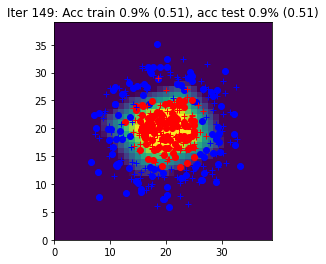

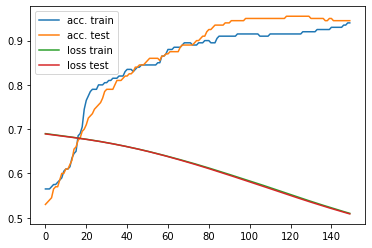

In [49]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.04

model, loss = init_model(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy, sgd
        # the forward with the predict method from the model
        # and the backward function with autograd
        
        # pass batch forward
        Yhat = model(X)
        
        # batch loss  
        L , accuracy = loss_accuracy(loss,Yhat, Y)
        
        # batch backward
        L.backward()
        
        # descent gradient
        model = sgd(model, eta)

    
    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(Ygrid.detach(), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain.item())
    curves[3].append(Ltest.item())

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 4 : Simplification of the SGD with `torch.optim`

In [51]:
def init_model(nx, nh, ny, eta):


    model = torch.nn.Sequential(
        torch.nn.Linear(nx,nh),
        torch.nn.ReLU(),
        torch.nn.Linear(nh,ny),
        torch.nn.Sigmoid()
    )
    loss = torch.nn.CrossEntropyLoss()
    optim = torch.optim.SGD(model.parameters(), lr=eta)

    return model, loss, optim

The `sgd` function is replaced by calling the `optim.zero_grad()` before the backward and `optim.step()` after.

## Algorithme global d'apprentissage (avec autograd, les couches `torch.nn` et `torch.optim`)

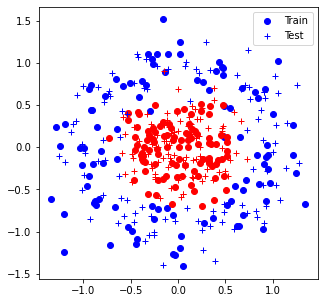

Iter 0: Acc train 0.4% (0.70), acc test 0.4% (0.70)


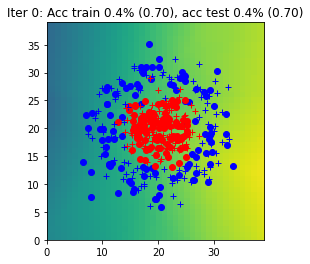

Iter 1: Acc train 0.4% (0.70), acc test 0.4% (0.70)


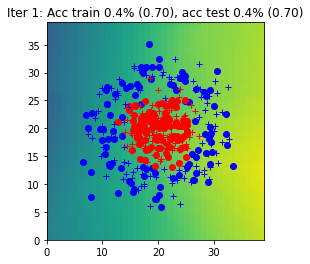

Iter 2: Acc train 0.4% (0.70), acc test 0.4% (0.70)


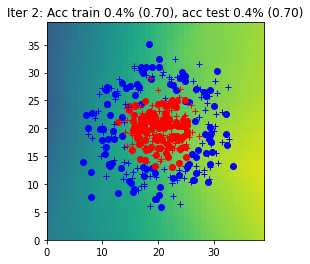

Iter 3: Acc train 0.5% (0.70), acc test 0.4% (0.70)


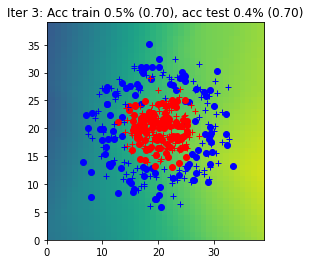

Iter 4: Acc train 0.5% (0.70), acc test 0.4% (0.70)


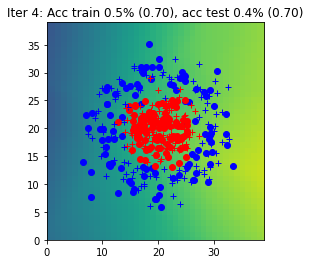

Iter 5: Acc train 0.5% (0.70), acc test 0.5% (0.70)


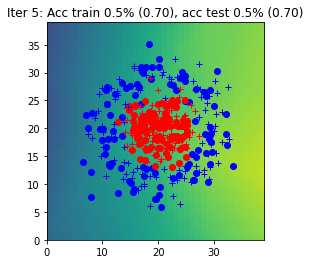

Iter 6: Acc train 0.5% (0.70), acc test 0.5% (0.70)


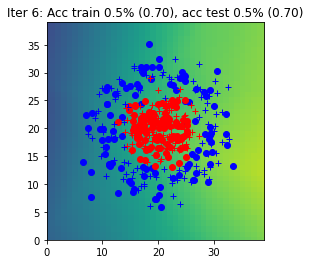

Iter 7: Acc train 0.5% (0.70), acc test 0.5% (0.70)


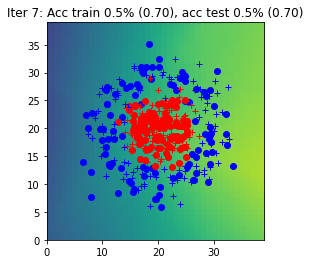

Iter 8: Acc train 0.5% (0.69), acc test 0.5% (0.70)


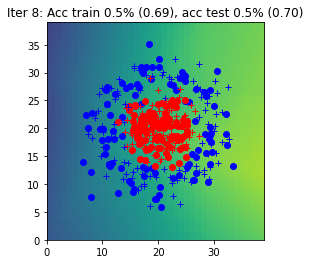

Iter 9: Acc train 0.5% (0.69), acc test 0.5% (0.70)


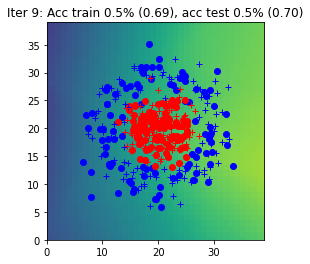

Iter 10: Acc train 0.5% (0.69), acc test 0.5% (0.69)


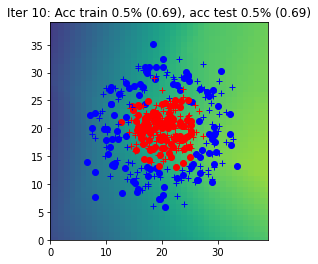

Iter 11: Acc train 0.5% (0.69), acc test 0.5% (0.69)


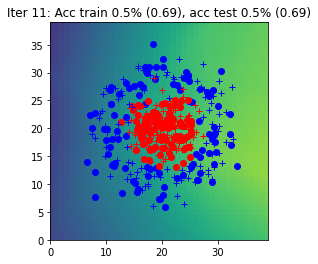

Iter 12: Acc train 0.5% (0.69), acc test 0.5% (0.69)


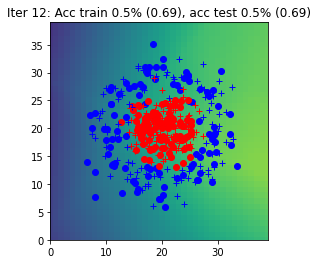

Iter 13: Acc train 0.5% (0.69), acc test 0.5% (0.69)


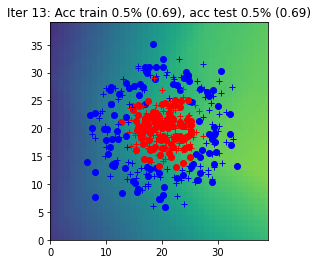

Iter 14: Acc train 0.6% (0.69), acc test 0.5% (0.69)


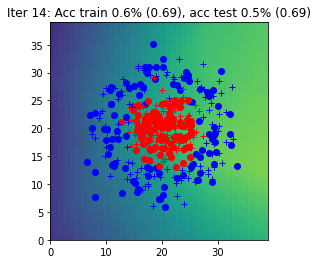

Iter 15: Acc train 0.6% (0.69), acc test 0.5% (0.69)


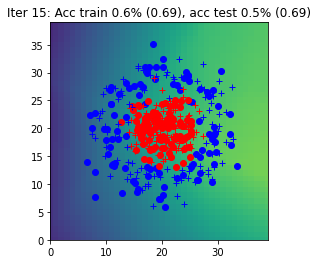

Iter 16: Acc train 0.6% (0.69), acc test 0.6% (0.69)


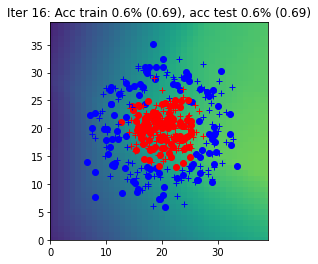

Iter 17: Acc train 0.6% (0.69), acc test 0.6% (0.69)


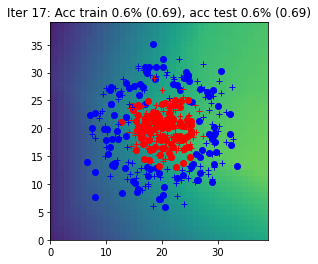

Iter 18: Acc train 0.6% (0.69), acc test 0.6% (0.69)


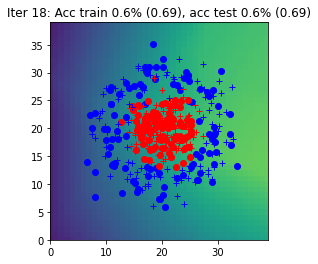

Iter 19: Acc train 0.6% (0.69), acc test 0.6% (0.69)


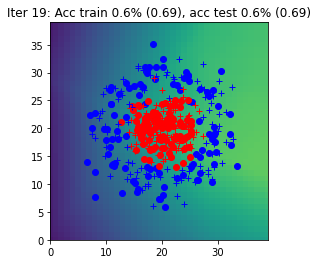

Iter 20: Acc train 0.6% (0.69), acc test 0.6% (0.69)


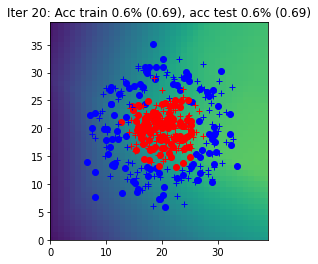

Iter 21: Acc train 0.6% (0.69), acc test 0.6% (0.69)


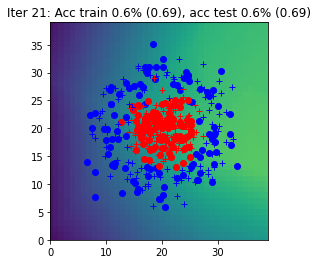

Iter 22: Acc train 0.6% (0.69), acc test 0.6% (0.69)


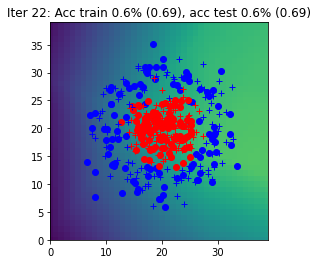

Iter 23: Acc train 0.6% (0.69), acc test 0.6% (0.69)


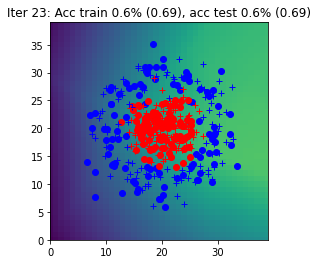

Iter 24: Acc train 0.6% (0.69), acc test 0.6% (0.69)


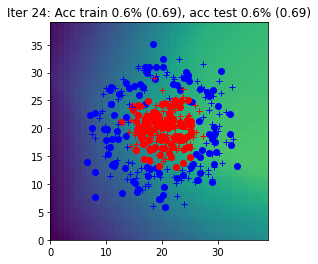

Iter 25: Acc train 0.6% (0.69), acc test 0.6% (0.69)


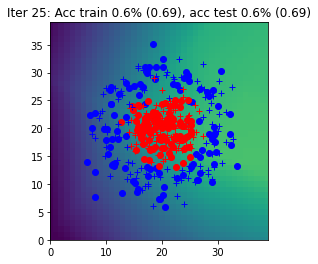

Iter 26: Acc train 0.6% (0.69), acc test 0.6% (0.69)


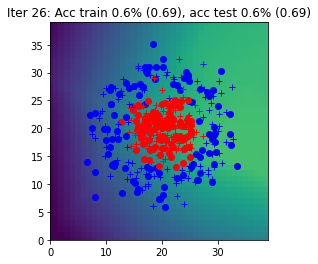

Iter 27: Acc train 0.6% (0.69), acc test 0.6% (0.69)


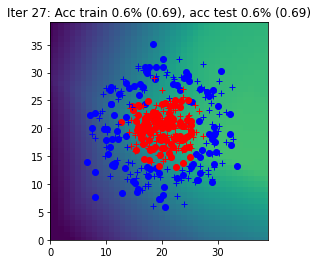

Iter 28: Acc train 0.6% (0.69), acc test 0.6% (0.69)


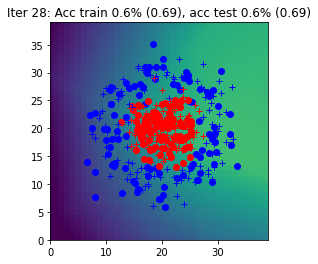

Iter 29: Acc train 0.6% (0.69), acc test 0.6% (0.69)


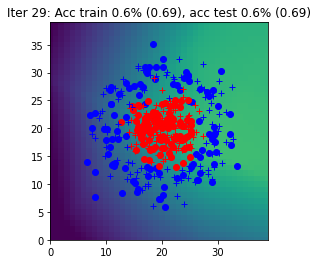

Iter 30: Acc train 0.6% (0.69), acc test 0.7% (0.69)


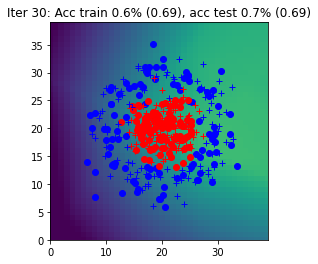

Iter 31: Acc train 0.6% (0.68), acc test 0.7% (0.69)


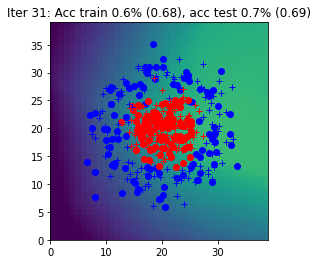

Iter 32: Acc train 0.6% (0.68), acc test 0.7% (0.69)


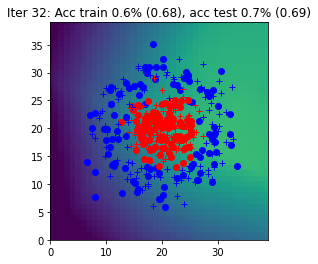

Iter 33: Acc train 0.6% (0.68), acc test 0.7% (0.68)


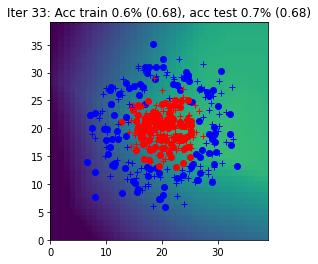

Iter 34: Acc train 0.6% (0.68), acc test 0.7% (0.68)


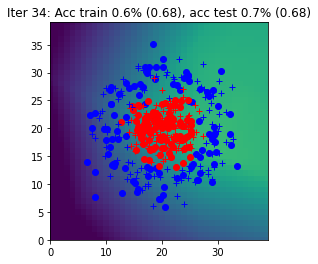

Iter 35: Acc train 0.7% (0.68), acc test 0.7% (0.68)


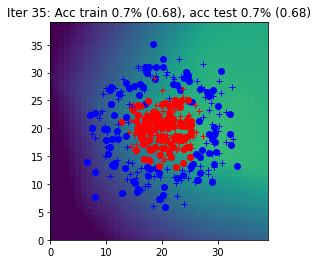

Iter 36: Acc train 0.7% (0.68), acc test 0.7% (0.68)


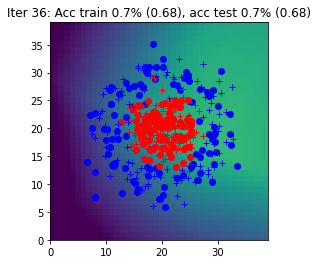

Iter 37: Acc train 0.7% (0.68), acc test 0.7% (0.68)


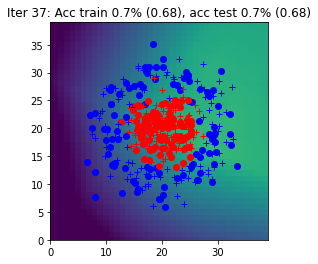

Iter 38: Acc train 0.7% (0.68), acc test 0.7% (0.68)


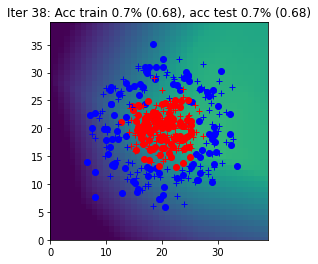

Iter 39: Acc train 0.7% (0.68), acc test 0.7% (0.68)


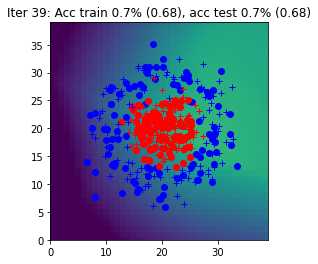

Iter 40: Acc train 0.7% (0.68), acc test 0.7% (0.68)


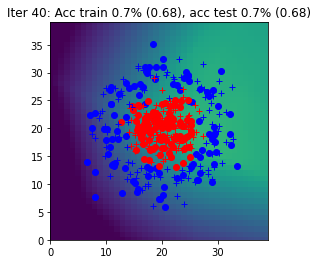

Iter 41: Acc train 0.7% (0.68), acc test 0.7% (0.68)


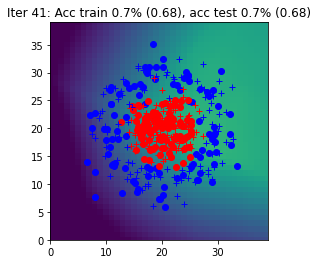

Iter 42: Acc train 0.7% (0.68), acc test 0.7% (0.68)


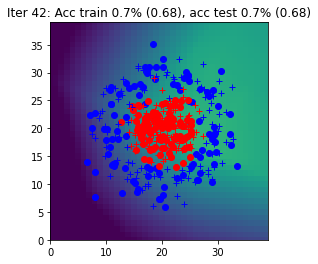

Iter 43: Acc train 0.7% (0.68), acc test 0.7% (0.68)


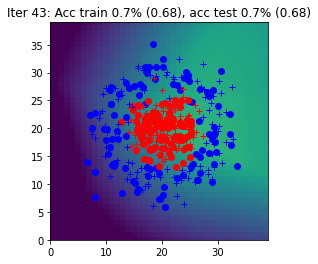

Iter 44: Acc train 0.7% (0.68), acc test 0.7% (0.68)


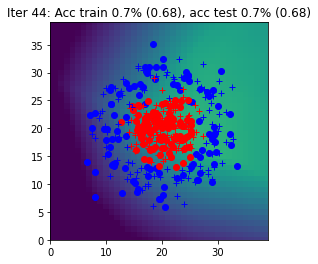

Iter 45: Acc train 0.7% (0.68), acc test 0.7% (0.68)


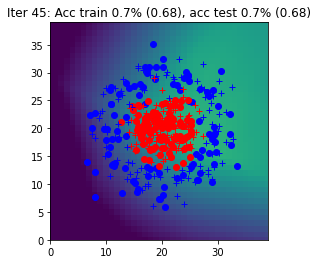

Iter 46: Acc train 0.7% (0.68), acc test 0.7% (0.68)


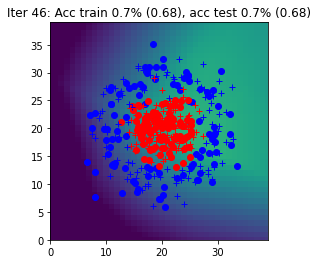

Iter 47: Acc train 0.7% (0.68), acc test 0.7% (0.68)


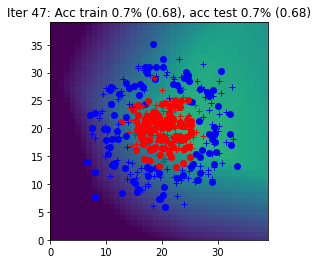

Iter 48: Acc train 0.7% (0.68), acc test 0.7% (0.68)


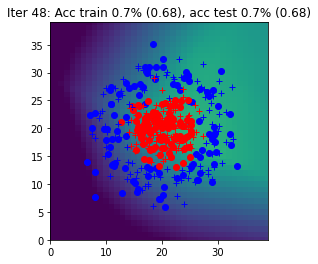

Iter 49: Acc train 0.7% (0.68), acc test 0.7% (0.68)


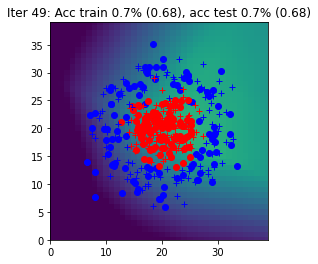

Iter 50: Acc train 0.7% (0.67), acc test 0.7% (0.68)


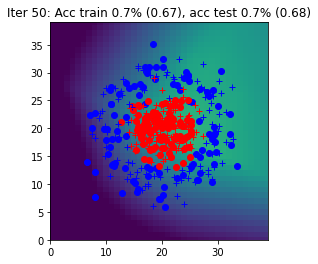

Iter 51: Acc train 0.7% (0.67), acc test 0.7% (0.67)


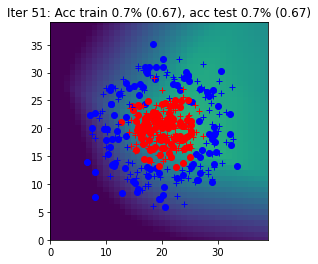

Iter 52: Acc train 0.7% (0.67), acc test 0.7% (0.67)


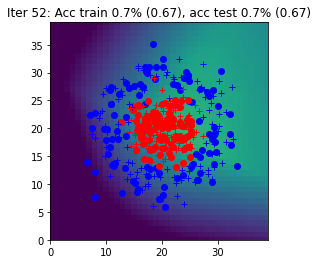

Iter 53: Acc train 0.7% (0.67), acc test 0.7% (0.67)


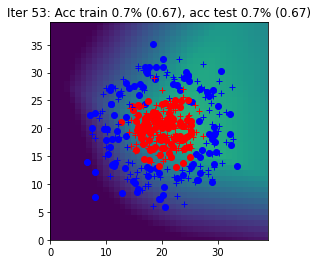

Iter 54: Acc train 0.7% (0.67), acc test 0.7% (0.67)


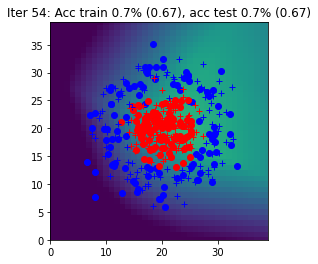

Iter 55: Acc train 0.7% (0.67), acc test 0.7% (0.67)


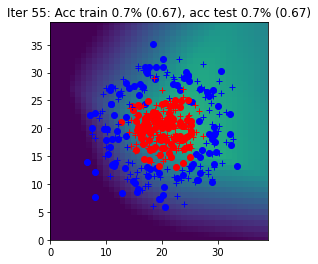

Iter 56: Acc train 0.7% (0.67), acc test 0.7% (0.67)


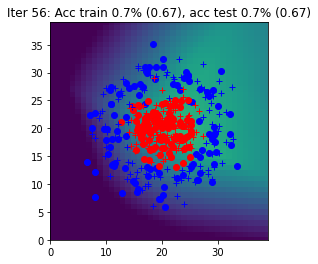

Iter 57: Acc train 0.7% (0.67), acc test 0.7% (0.67)


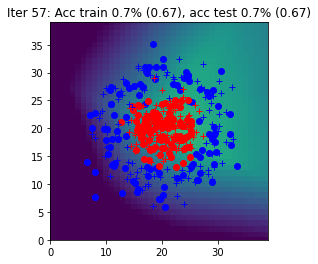

Iter 58: Acc train 0.8% (0.67), acc test 0.7% (0.67)


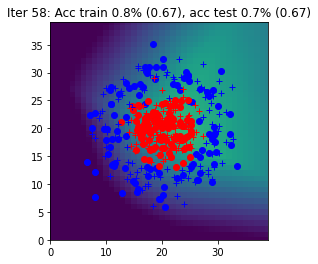

Iter 59: Acc train 0.8% (0.67), acc test 0.8% (0.67)


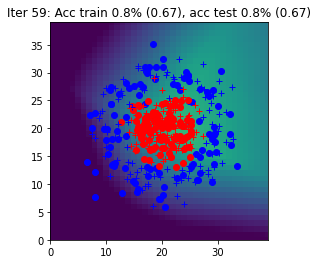

Iter 60: Acc train 0.8% (0.67), acc test 0.8% (0.67)


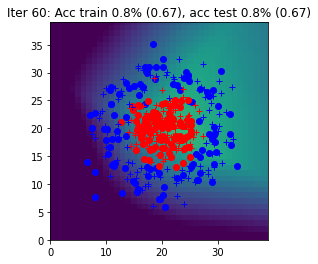

Iter 61: Acc train 0.8% (0.67), acc test 0.8% (0.67)


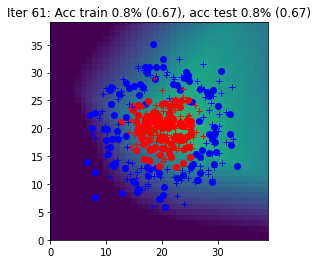

Iter 62: Acc train 0.8% (0.67), acc test 0.8% (0.67)


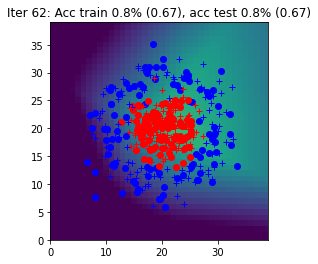

Iter 63: Acc train 0.8% (0.66), acc test 0.8% (0.67)


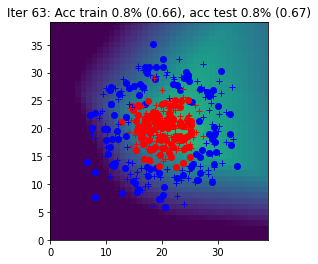

Iter 64: Acc train 0.8% (0.66), acc test 0.8% (0.66)


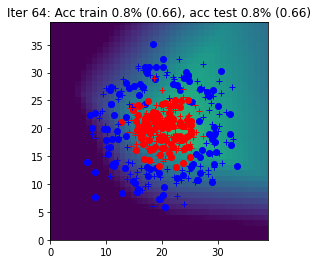

Iter 65: Acc train 0.8% (0.66), acc test 0.8% (0.66)


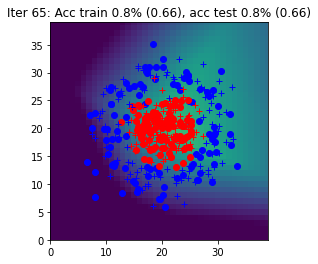

Iter 66: Acc train 0.8% (0.66), acc test 0.8% (0.66)


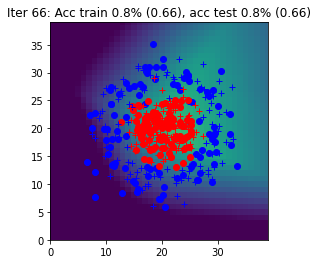

Iter 67: Acc train 0.8% (0.66), acc test 0.8% (0.66)


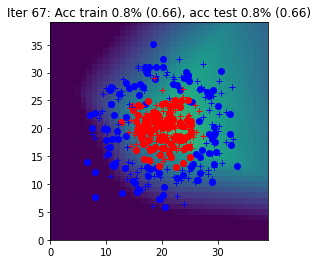

Iter 68: Acc train 0.8% (0.66), acc test 0.8% (0.66)


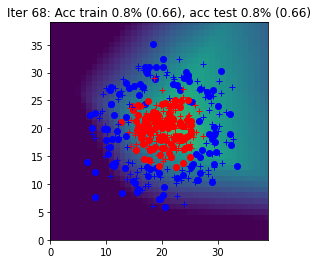

Iter 69: Acc train 0.8% (0.66), acc test 0.8% (0.66)


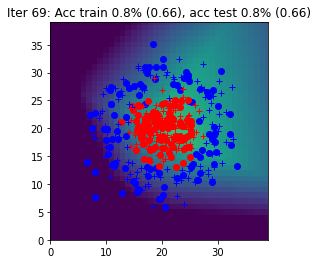

Iter 70: Acc train 0.8% (0.66), acc test 0.8% (0.66)


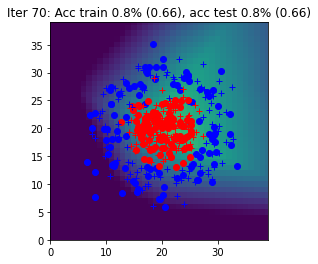

Iter 71: Acc train 0.8% (0.66), acc test 0.8% (0.66)


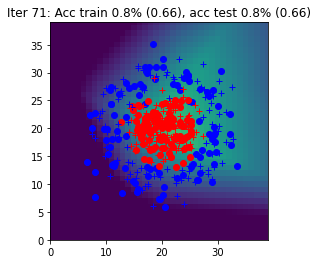

Iter 72: Acc train 0.8% (0.66), acc test 0.8% (0.66)


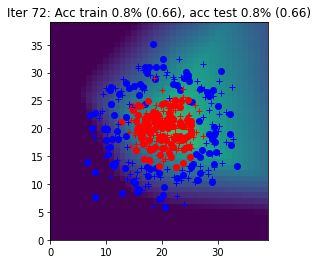

Iter 73: Acc train 0.8% (0.66), acc test 0.8% (0.66)


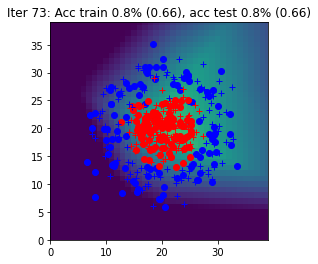

Iter 74: Acc train 0.8% (0.65), acc test 0.8% (0.66)


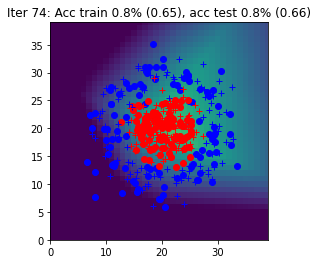

Iter 75: Acc train 0.8% (0.65), acc test 0.8% (0.65)


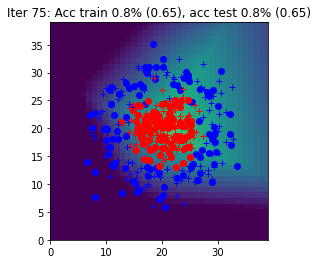

Iter 76: Acc train 0.8% (0.65), acc test 0.8% (0.65)


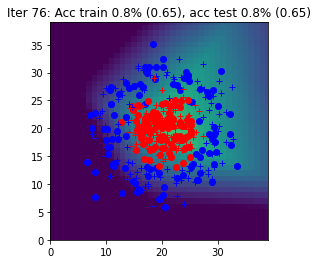

Iter 77: Acc train 0.8% (0.65), acc test 0.8% (0.65)


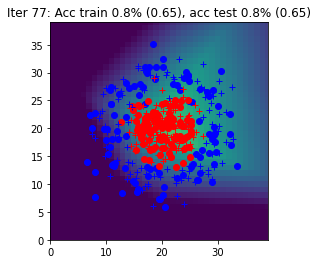

Iter 78: Acc train 0.8% (0.65), acc test 0.9% (0.65)


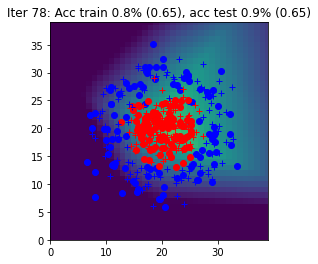

Iter 79: Acc train 0.8% (0.65), acc test 0.9% (0.65)


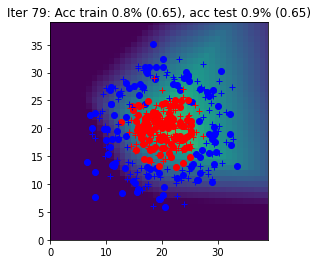

Iter 80: Acc train 0.8% (0.65), acc test 0.9% (0.65)


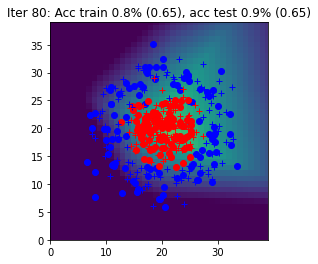

Iter 81: Acc train 0.8% (0.65), acc test 0.9% (0.65)


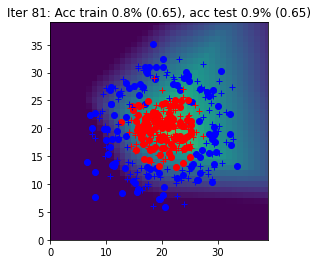

Iter 82: Acc train 0.8% (0.65), acc test 0.9% (0.65)


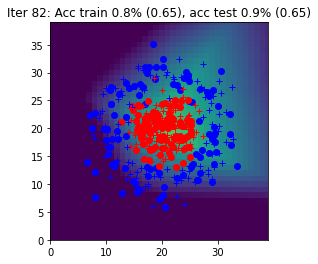

Iter 83: Acc train 0.8% (0.64), acc test 0.9% (0.65)


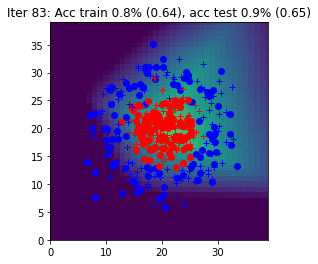

Iter 84: Acc train 0.9% (0.64), acc test 0.9% (0.64)


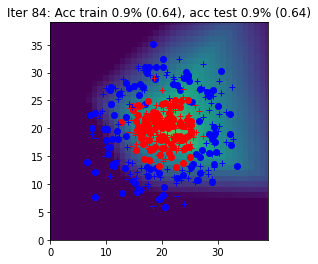

Iter 85: Acc train 0.9% (0.64), acc test 0.9% (0.64)


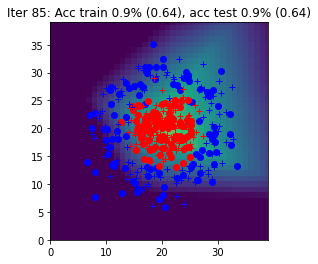

Iter 86: Acc train 0.9% (0.64), acc test 0.9% (0.64)


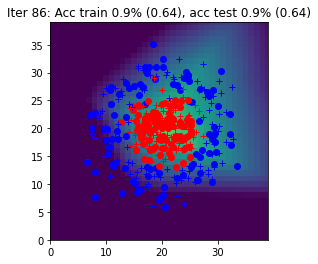

Iter 87: Acc train 0.9% (0.64), acc test 0.9% (0.64)


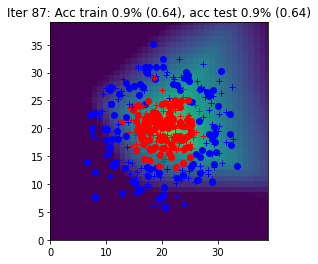

Iter 88: Acc train 0.9% (0.64), acc test 0.9% (0.64)


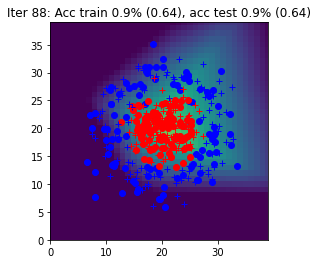

Iter 89: Acc train 0.9% (0.64), acc test 0.9% (0.64)


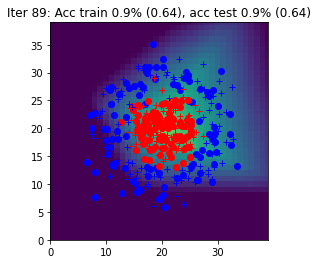

Iter 90: Acc train 0.9% (0.64), acc test 0.9% (0.64)


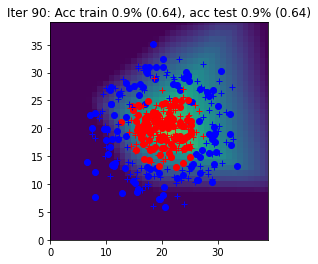

Iter 91: Acc train 0.9% (0.64), acc test 0.9% (0.64)


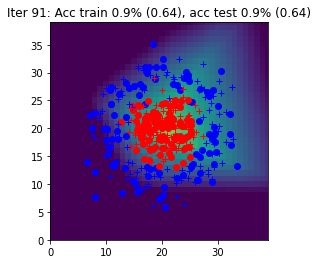

Iter 92: Acc train 0.9% (0.63), acc test 0.9% (0.63)


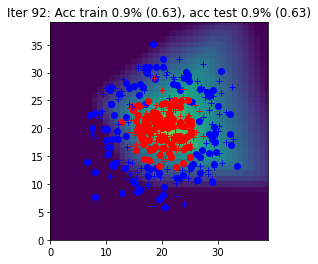

Iter 93: Acc train 0.9% (0.63), acc test 0.9% (0.63)


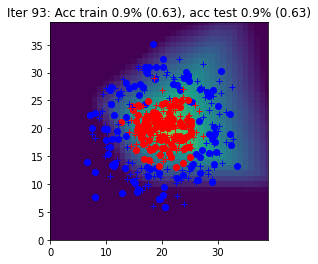

Iter 94: Acc train 0.9% (0.63), acc test 0.9% (0.63)


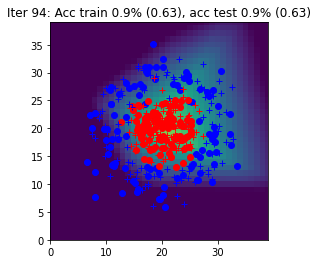

Iter 95: Acc train 0.9% (0.63), acc test 0.9% (0.63)


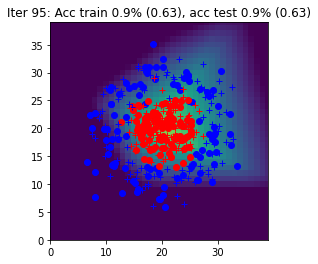

Iter 96: Acc train 0.9% (0.63), acc test 0.9% (0.63)


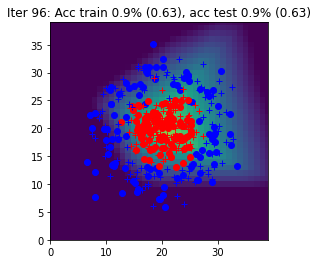

Iter 97: Acc train 0.9% (0.63), acc test 0.9% (0.63)


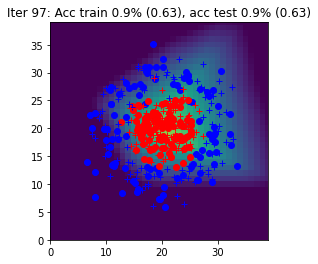

Iter 98: Acc train 0.9% (0.63), acc test 0.9% (0.63)


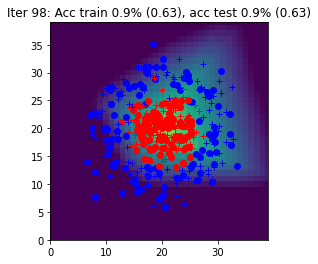

Iter 99: Acc train 0.9% (0.63), acc test 0.9% (0.63)


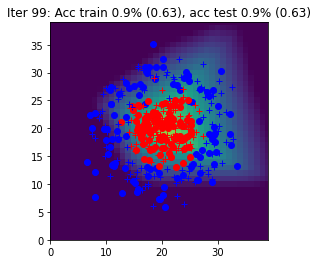

Iter 100: Acc train 0.9% (0.62), acc test 0.9% (0.62)


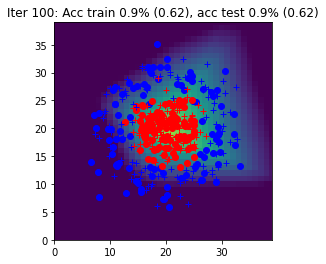

Iter 101: Acc train 0.9% (0.62), acc test 0.9% (0.62)


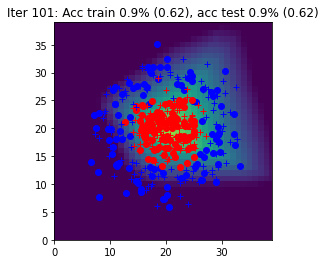

Iter 102: Acc train 0.9% (0.62), acc test 0.9% (0.62)


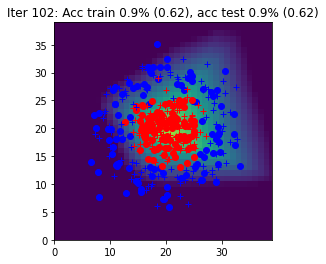

Iter 103: Acc train 0.9% (0.62), acc test 0.9% (0.62)


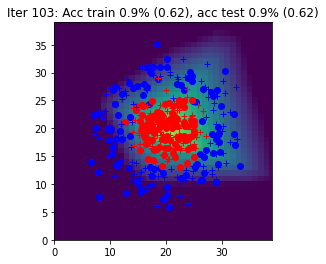

Iter 104: Acc train 0.9% (0.62), acc test 0.9% (0.62)


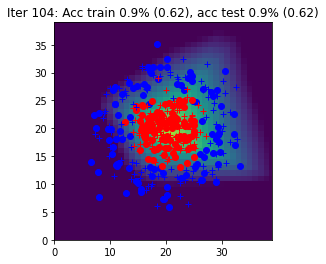

Iter 105: Acc train 0.9% (0.62), acc test 0.9% (0.62)


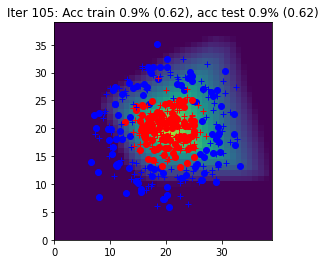

Iter 106: Acc train 0.9% (0.62), acc test 0.9% (0.62)


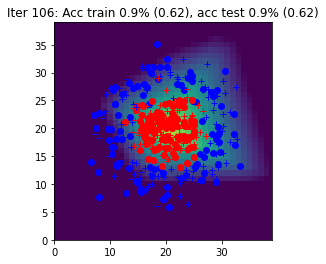

Iter 107: Acc train 0.9% (0.61), acc test 0.9% (0.62)


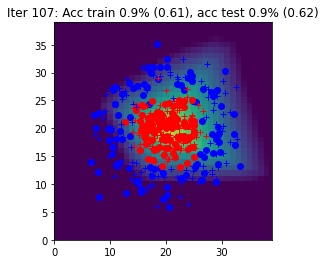

Iter 108: Acc train 0.9% (0.61), acc test 0.9% (0.61)


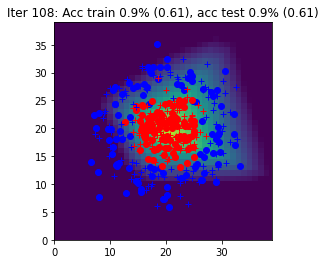

Iter 109: Acc train 0.9% (0.61), acc test 0.9% (0.61)


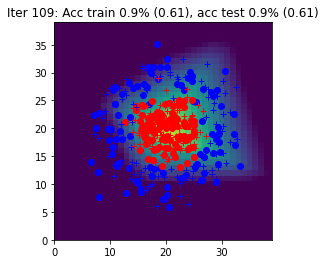

Iter 110: Acc train 0.9% (0.61), acc test 0.9% (0.61)


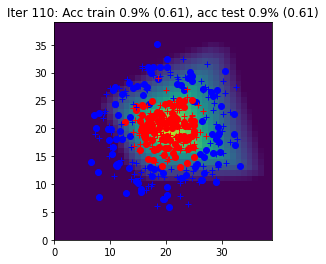

Iter 111: Acc train 0.9% (0.61), acc test 0.9% (0.61)


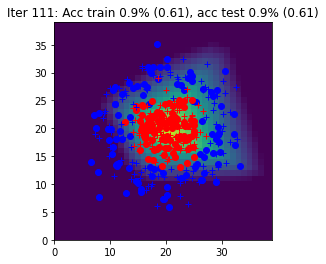

Iter 112: Acc train 0.9% (0.61), acc test 0.9% (0.61)


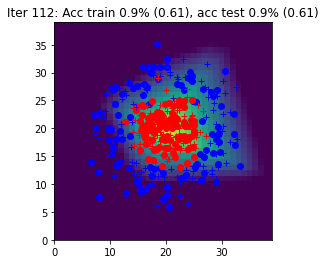

Iter 113: Acc train 0.9% (0.61), acc test 0.9% (0.61)


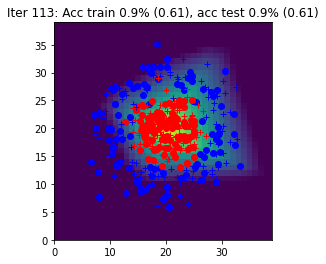

Iter 114: Acc train 0.9% (0.60), acc test 0.9% (0.60)


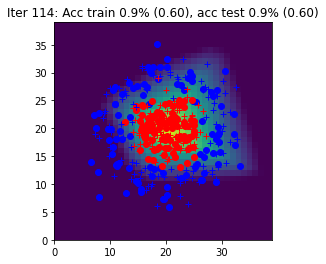

Iter 115: Acc train 0.9% (0.60), acc test 0.9% (0.60)


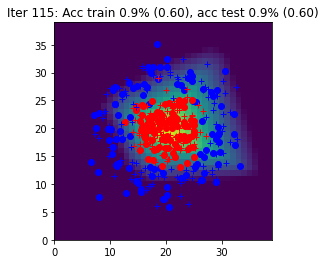

Iter 116: Acc train 0.9% (0.60), acc test 0.9% (0.60)


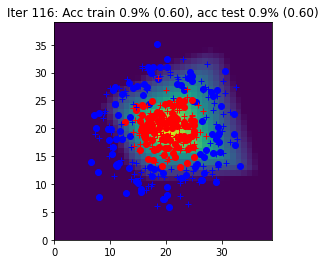

Iter 117: Acc train 0.9% (0.60), acc test 0.9% (0.60)


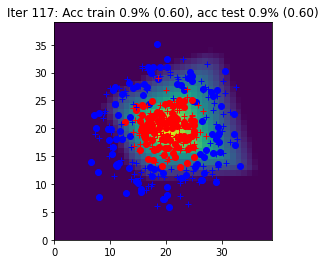

Iter 118: Acc train 0.9% (0.60), acc test 0.9% (0.60)


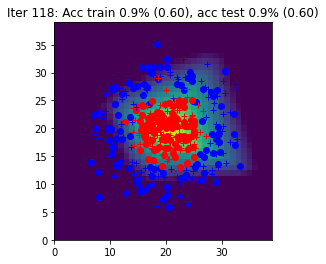

Iter 119: Acc train 0.9% (0.60), acc test 0.9% (0.60)


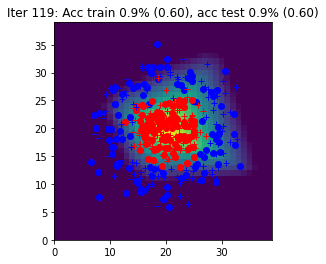

Iter 120: Acc train 0.9% (0.59), acc test 0.9% (0.60)


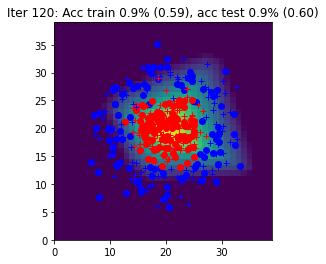

Iter 121: Acc train 0.9% (0.59), acc test 0.9% (0.59)


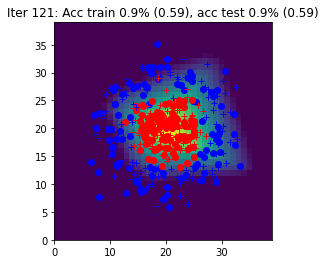

Iter 122: Acc train 0.9% (0.59), acc test 0.9% (0.59)


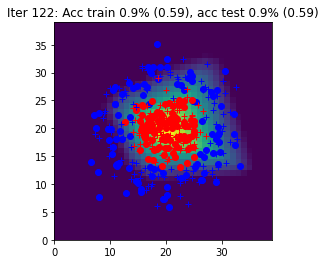

Iter 123: Acc train 0.9% (0.59), acc test 0.9% (0.59)


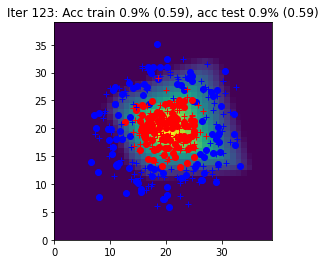

Iter 124: Acc train 0.9% (0.59), acc test 0.9% (0.59)


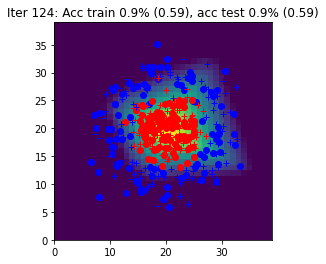

Iter 125: Acc train 0.9% (0.59), acc test 0.9% (0.59)


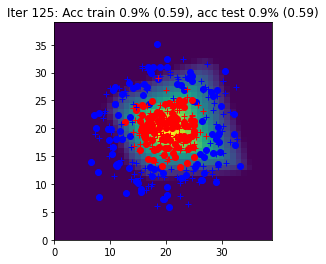

Iter 126: Acc train 0.9% (0.59), acc test 0.9% (0.59)


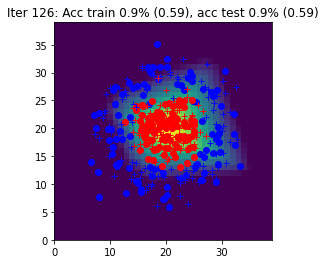

Iter 127: Acc train 0.9% (0.58), acc test 0.9% (0.58)


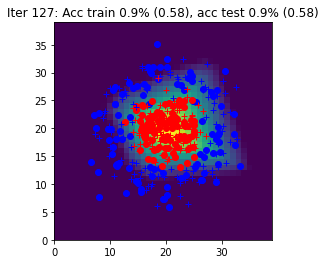

Iter 128: Acc train 0.9% (0.58), acc test 0.9% (0.58)


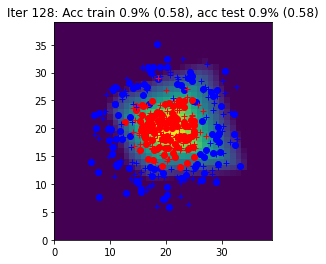

Iter 129: Acc train 0.9% (0.58), acc test 0.9% (0.58)


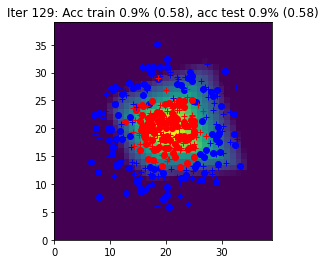

Iter 130: Acc train 0.9% (0.58), acc test 0.9% (0.58)


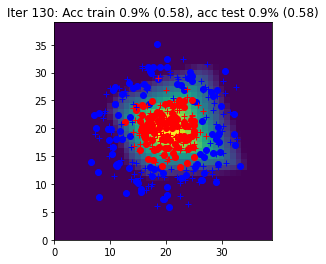

Iter 131: Acc train 0.9% (0.58), acc test 0.9% (0.58)


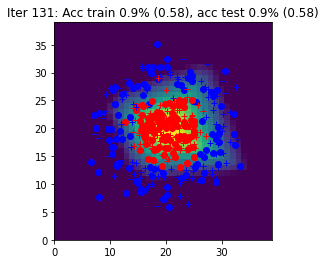

Iter 132: Acc train 0.9% (0.58), acc test 0.9% (0.58)


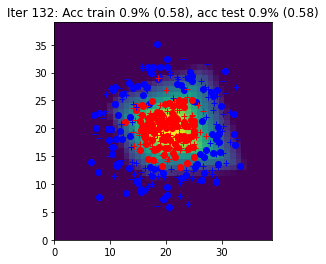

Iter 133: Acc train 0.9% (0.57), acc test 0.9% (0.58)


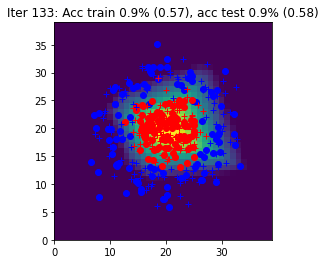

Iter 134: Acc train 0.9% (0.57), acc test 0.9% (0.57)


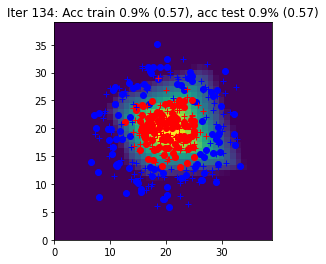

Iter 135: Acc train 0.9% (0.57), acc test 0.9% (0.57)


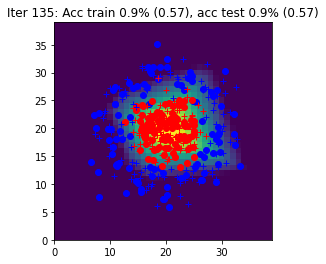

Iter 136: Acc train 0.9% (0.57), acc test 0.9% (0.57)


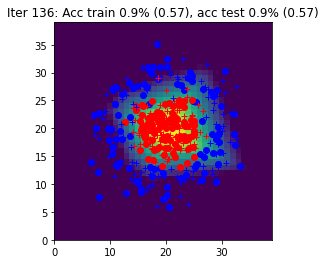

Iter 137: Acc train 0.9% (0.57), acc test 0.9% (0.57)


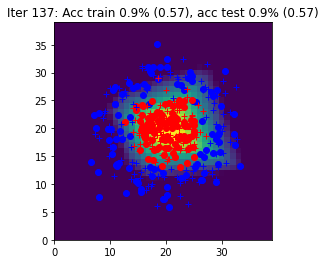

Iter 138: Acc train 0.9% (0.57), acc test 0.9% (0.57)


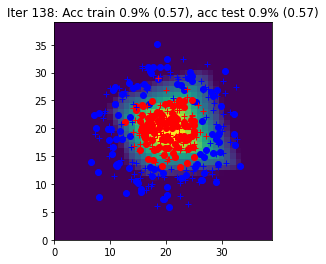

Iter 139: Acc train 0.9% (0.56), acc test 0.9% (0.57)


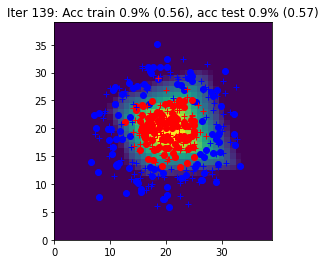

Iter 140: Acc train 0.9% (0.56), acc test 0.9% (0.56)


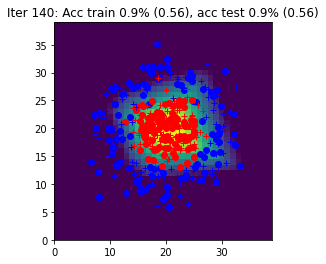

Iter 141: Acc train 0.9% (0.56), acc test 0.9% (0.56)


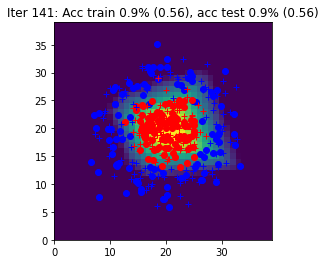

Iter 142: Acc train 0.9% (0.56), acc test 0.9% (0.56)


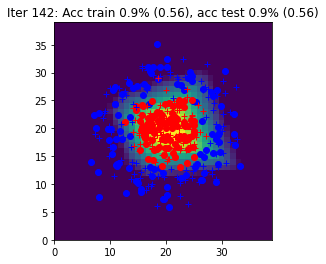

Iter 143: Acc train 0.9% (0.56), acc test 1.0% (0.56)


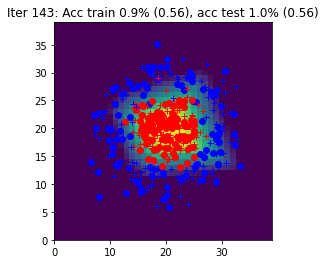

Iter 144: Acc train 0.9% (0.56), acc test 1.0% (0.56)


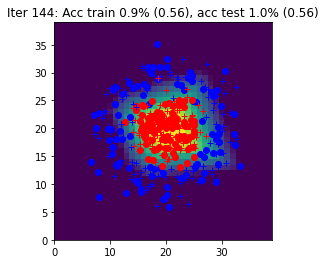

Iter 145: Acc train 0.9% (0.55), acc test 1.0% (0.56)


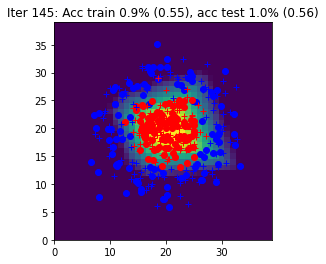

Iter 146: Acc train 0.9% (0.55), acc test 1.0% (0.55)


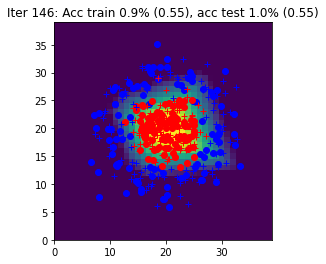

Iter 147: Acc train 0.9% (0.55), acc test 1.0% (0.55)


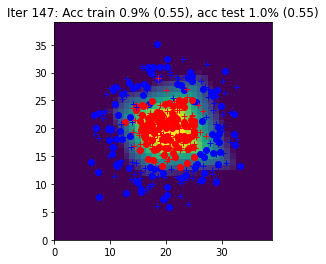

Iter 148: Acc train 0.9% (0.55), acc test 1.0% (0.55)


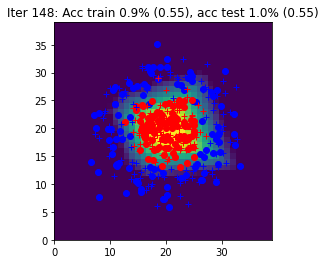

Iter 149: Acc train 0.9% (0.55), acc test 1.0% (0.55)


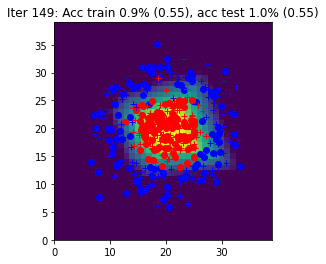

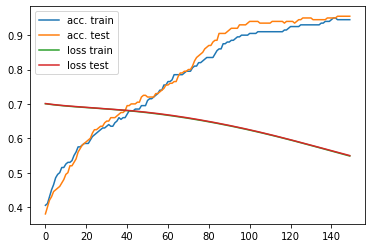

In [56]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.04

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

       # pass batch forward
        Yhat = model(X)
        
        # batch loss  
        L , accuracy = loss_accuracy(loss,Yhat, Y)
        
        # batch backward and SGD
        optim.zero_grad()
        L.backward()
        optim.step()
        
    with torch.no_grad():

        Yhat_train = model(data.Xtrain)
        Yhat_test = model(data.Xtest)
        Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
        Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
        Ygrid = model(data.Xgrid)

        title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
        print(title)
        data.plot_data_with_grid(Ygrid.detach(), title)

        curves[0].append(acctrain)
        curves[1].append(acctest)
        curves[2].append(Ltrain)
        curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 5 : MNIST

Apply the code from previous part code to the MNIST dataset.

100%|█████████████████████████████████████████| 150/150 [03:14<00:00,  1.30s/it]


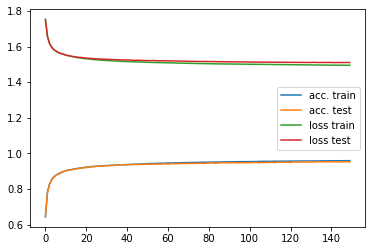

In [57]:
# init*
data = MNISTData()
N = data.Xtrain.shape[0]
Nbatch = 100
nx = data.Xtrain.shape[1]
nh = 100
ny = data.Ytrain.shape[1]
eta = 0.03


model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in tqdm(range(150)):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

       # pass batch forward
        Yhat = model(X)
        Yhat = torch.nn.Softmax(dim=0)(Yhat)
        
        # batch loss  
        L , accuracy = loss_accuracy(loss,Yhat, Y)
        
        # batch backward and SGD
        optim.zero_grad()
        L.backward()
        optim.step()
        
    with torch.no_grad():

        Yhat_train = model(data.Xtrain)
        Yhat_test = model(data.Xtest)
        Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
        Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
        

        curves[0].append(acctrain)
        curves[1].append(acctest)
        curves[2].append(Ltrain)
        curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 6: Bonus: SVM


Train a SVM model on the Circles dataset.

Ideas :
- First try a linear SVM (sklearn.svm.LinearSVC dans scikit-learn). Does it work well ? Why ?
- Then try more complex kernels (sklearn.svm.SVC). Which one is the best ? why ?
- Does the parameter C of regularization have an impact? Why ?

In [48]:
# data
data = CirclesData()
Xtrain = data.Xtrain.numpy()
Ytrain = data.Ytrain[:, 0].numpy()

Xgrid = data.Xgrid.numpy()

Xtest = data.Xtest.numpy()
Ytest = data.Ytest[:, 0].numpy()

def plot_svm_predictions(data, predictions):
    plt.figure(2)
    plt.clf()
    plt.imshow(np.reshape(predictions, (40,40)))
    plt.plot(data._Xtrain[data._Ytrain[:,0] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,0] == 1,1]*10+20, 'bo', label="Train")
    plt.plot(data._Xtrain[data._Ytrain[:,1] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,1] == 1,1]*10+20, 'ro')
    plt.plot(data._Xtest[data._Ytest[:,0] == 1,0]*10+20, data._Xtest[data._Ytest[:,0] == 1,1]*10+20, 'b+', label="Test")
    plt.plot(data._Xtest[data._Ytest[:,1] == 1,0]*10+20, data._Xtest[data._Ytest[:,1] == 1,1]*10+20, 'r+')
    plt.xlim(0,39)
    plt.ylim(0,39)
    plt.clim(0.3,0.7)
    plt.draw()
    plt.pause(1e-3)

### Linear SVM

Accuracy : 53.00


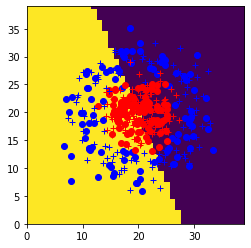

In [52]:
from sklearn.svm import LinearSVC

svm = LinearSVC()
svm.fit(Xtrain, Ytrain)

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

### Kernel RBF

Accuracy : 94.00


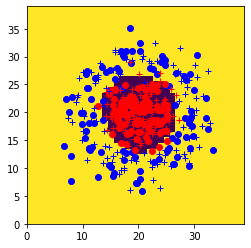

In [54]:
from sklearn.svm import SVC

svm = SVC(kernel='rbf')
svm.fit(Xtrain, Ytrain)

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

### Kernel Poly

Accuracy : 54.50


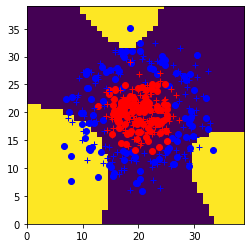

In [56]:
from sklearn.svm import SVC

svm = SVC(kernel='poly')
svm.fit(Xtrain, Ytrain)

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

### Kernel Sigmoid

Accuracy : 65.00


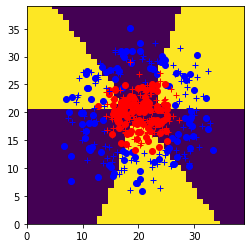

In [57]:
from sklearn.svm import SVC

svm = SVC(kernel='sigmoid')
svm.fit(Xtrain, Ytrain)

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)